# Packages and Functions

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
import seaborn as sns

pd.set_option('display.max_columns', None)

In [2]:
def adjust_data_types(df):
    for col in df.columns:
        unique_vals = df[col].unique()
        if df[col].dtypes == 'object':
            None
#         elif (set(unique_vals) == {0, 1}) or col == 'userId':
#             df[col] = df[col].astype('int64')
#         else:
#             df[col] = df[col].astype('float64')
        elif (set(unique_vals) != {0, 1}):
            df[col] = df[col].astype('float64')
        else:
            df[col] = df[col].astype('int64')
    return df

In [3]:
# ho_t02['userId'] = ho_t02['userId'].astype('str')
# ho_t02 = adjust_data_types(ho_t02)
# ho_t02.info()

In [4]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from lightgbm import LGBMClassifier
from xgboost.sklearn import XGBClassifier

from sklearn.feature_selection import RFE, RFECV, VarianceThreshold

from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, make_scorer, confusion_matrix, roc_curve
from sklearn.model_selection import GridSearchCV, StratifiedKFold, permutation_test_score
from sklearn.base import clone


from imblearn.metrics import geometric_mean_score
import shap

from imblearn.over_sampling import SMOTE, ADASYN, SMOTENC, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

from imblearn.pipeline import Pipeline
# from sklearn.pipeline import Pipeline

import dice_ml

from catboost import CatBoostClassifier

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
UserConfigValidationException will be deprecated from dice_ml.utils. Please import UserConfigValidationException from raiutils.exceptions.


In [5]:
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    specificity = tn / (tn + fp)
    return specificity

specificity_scorer = make_scorer(specificity_score)

def npv_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    npv = tn / (tn + fn)
    return npv

npv_scorer = make_scorer(npv_score)

g_mean_scorer = make_scorer(geometric_mean_score)


skf = StratifiedKFold(10, shuffle=True, random_state=0)

# def get_cat_cols(df):
#     one_hot_encoded_columns = []

#     for idx, column in enumerate(df.columns):
#         if df[column].nunique() == 2 and set(df[column].unique()) == {0, 1}:
#             one_hot_encoded_columns.append(idx)

#     return one_hot_encoded_columns

def get_cat_cols(df):
    return df.select_dtypes(include=['object']).columns.tolist()

# get_cat_cols(ho_t02)
# cat_cols = get_cat_cols(ho_t02)
# num_cols = [col for col in ho_t02.columns if col not in cat_cols]
# cat_cols, num_cols

In [6]:
from sklearn.decomposition import PCA

from imblearn.over_sampling import SMOTE, ADASYN, SMOTENC, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler, EditedNearestNeighbours, TomekLinks
from imblearn.combine import SMOTEENN, SMOTETomek


from sklearn.base import BaseEstimator, TransformerMixin

class DropCategoricalFeatures(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        # Assuming X is a DataFrame
        non_categorical_cols = X.select_dtypes(exclude=['object']).columns.tolist()
        return X[non_categorical_cols]


def knn_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', KNeighborsClassifier())
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#                   ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
#             SMOTEENN(random_state=random_state),
#             SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
#             TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)
        ],
        'classifier__n_neighbors': list(range(1, 16)),
        'classifier__metric': ['euclidean', 'cosine', 'hamming', 'braycurtis',
                               'chebyshev', 'canberra', 'cityblock', 'sqeuclidean'
                              ]
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def svm_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', SVC(random_state=random_state, max_iter=1000,
                           verbose=True))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#         ],
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__C': list(np.logspace(-6, 6, num=13)),
        'classifier__probability': [True, False],
        'classifier__kernel': ['linear', 'poly', 'rbf', 'sigmoid']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def logreg_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
#         ('drop_categorical', None),
#         ('encoder', None),
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', LogisticRegression(random_state=random_state, max_iter=1000))
    ])

    param_grid = {
#         'drop_categorical': [None, DropCategoricalFeatures()]
#         'encoder': [None, OneHotEncoder(sparse_output=False)],
#         'scaler': [
#             StandardScaler(),
#             MinMaxScaler(),
#             RobustScaler()
#         ],
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__C': list(np.logspace(-6, 6, num=13)),
        'classifier__penalty': ['l2', None],
        'classifier__solver': ['liblinear', 'lbfgs', 'newton-cholesky']
#         'classifier__penalty': ['l1', l2', 'elasticnet', 'None']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df



def dt_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    cat_cols = get_cat_cols(X_train)
    num_cols = [col for col in X_train.columns if col not in cat_cols]


    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', DecisionTreeClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [
#             StandardScaler(), 
#             RobustScaler(),
#             MinMaxScaler()
#         ],
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
            SMOTEENN(random_state=random_state),
            SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
            TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)
        ],
#         'classifier__max_depth': [3],
# #         'classifier__min_samples_split': [1],
#         'classifier__min_samples_leaf': [1],
#         'classifier__max_depth': [2, 5],
#         'classifier__min_samples_split': [3],
#         'classifier__min_samples_leaf': [3],
# #         'classifier__max_features': ['auto', 'sqrt', 'log2', None],
#         'classifier__criterion': ["entropy", "log_loss"]
#         'classifier__max_depth': [2, 3],
#         'classifier__min_samples_split': [1],
#         'classifier__min_samples_leaf': [2, 3],
        'classifier__max_depth': [2, 3, 5],
        'classifier__min_samples_split': [2, 3],
        'classifier__min_samples_leaf': [1, 2, 3],
        'classifier__max_features': ['auto', 'sqrt', 'log2', None],
        'classifier__criterion': ["gini", "entropy", "log_loss"]
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
#                                cv=10, scoring=scorer,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

from sklearn.decomposition import TruncatedSVD

def rf_class2(df, scorer, label_col, scaler, random_state=0):
#     df_majority = df[df.home_ownership_class == 0]
#     df_minority = df[df.home_ownership_class == 1]

# #     display(df_majority)
# #     display(df_minority)
# #     print(len(df_majority), len(df_minority))
#     # Randomly downsample majority class
#     df_majority_downsampled = df_majority.sample(frac=0.2,
#                                                  random_state=random_state)
#     df = pd.concat([df_majority_downsampled, df_minority], axis=0)

    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)

#     n_components = X_scaled.shape[1]  # Maximum number of components
#     svd = TruncatedSVD(n_components=n_components)
#     X_svd = svd.fit_transform(X_scaled)

#     # Step 3: Find number of components that explain at least 90% variance
#     cum_variance = np.cumsum(svd.explained_variance_ratio_)
#     num_components = np.argmax(cum_variance >= 0.90) + 1  # +1 because Python indexing starts from 0
#     X_selected = X_svd[:, :num_components]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

#     X_resampled, y_resampled = RandomOverSampler(random_state=random_state).fit_resample(X_train, y_train)
#     class_counts_original = np.bincount(y_train.astype(int))
#     class_counts_resampled = np.bincount(y_resampled.astype(int))

    # Assuming 0 is the majority class, calculate its upweight factor
#     majority_class_original = class_counts_original[0]
#     majority_class_resampled = class_counts_resampled[0]
#     upweight_factor = majority_class_original / majority_class_resampled

#     minority_class_original = class_counts_original[1]
#     minority_class_resampled = class_counts_resampled[1]
#     downweight_factor = minority_class_original / minority_class_resampled

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', RandomForestClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [
#             StandardScaler(),
#             MinMaxScaler(),
#             RobustScaler()
#         ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
#             SMOTEENN(random_state=random_state),
#             SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
#             TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)
        ],
        'classifier__n_estimators': [200, 300],
        'classifier__max_depth': [2, 3],
        'classifier__min_samples_split': [2, 3],
        'classifier__min_samples_leaf': [2, 3],
        'classifier__oob_score': [True, False],
        'classifier__criterion': ["gini", "entropy", "log_loss"]

#         'classifier__n_estimators': [200, 250],
#         'classifier__max_depth': [2, 3],
#         'classifier__min_samples_split': [3, 4],
#         'classifier__min_samples_leaf': [3, 4],
#         'classifier__oob_score': [True, False],
#         'classifier__criterion': ["gini", "entropy", "log_loss"]
    }
#         'classifier__n_estimators': [200, 250, 300],
# #         'classifier__max_depth': [2, 3, 4],
#         'classifier__max_depth': [2],
#         'classifier__class_weight': [{0: 263/807, 1:1}],
#         'classifier__oob_score': [True],
# #         'classifier__class_weight': [{0: 1, 1:807/263}],
#         'classifier__min_samples_split': [3, 4],
#         'classifier__min_samples_leaf': [3, 4],
#         'classifier__criterion': ["gini", "entropy", "log_loss"]
#     }
    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
#                                cv=10, scoring=scorer,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def gbm_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', GradientBoostingClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#                   ],
        'resampling': [
            SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
#         'classifier__n_estimators': [200],
#         'classifier__max_depth': [None],
#         'classifier__min_samples_leaf': [3],
#         'classifier__min_samples_split': [5],
#         'classifier__learning_rate': [0.1]
        'classifier__n_estimators': [200, 250],
        'classifier__max_depth': [2, 3],
        'classifier__min_samples_leaf': [2, 3],
        'classifier__min_samples_split': [2, 3],
        'classifier__learning_rate': [0.1]
    }
#         'loss': ['log_loss', 'deviance', 'exponential']
#         'min_samples_leaf': [1, 2, 3],
#         'min_samples_split': [2, 3, 5],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def lgbm_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     plt.figure(figsize=(10, 6))
#     plt.plot(range(1, len(explained_var_ratio)+1), cumulative_explained_var, marker='o', linestyle='--')
#     plt.title('Cumulative Explained Variance Plot')
#     plt.xlabel('Number of Components')
#     plt.ylabel('Cumulative Explained Variance')
#     plt.grid(True)
#     plt.show()

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', LGBMClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#                   ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
#         'classifier__n_estimators': [400, 450],
#         'classifier__learning_rate': [0.01],
#         'classifier__num_leaves': [20, 25],
#         'classifier__min_child_samples': [40, 45],
#         'classifier__class_weight': [{0: 263/807, 1:1}, {0: 1, 1:807/263}],
#         'classifier__class_weight': [{0: 1, 1:807/263}],
#         'classifier__max_depth': [2, 3],
#         'classifier__boosting_type': ['gbdt', 'dart', 'goss']

        'classifier__n_estimators': [200, 300, 400],
        'classifier__learning_rate': [0.1, 0.01],
#         'classifier__num_leaves': [20, 25],
#         'classifier__min_child_samples': [40, 45],
#         'classifier__class_weight': [{0: 263/807, 1:1}, {0: 1, 1:807/263}],
#         'classifier__class_weight': [{0: 1, 1:807/263}],
        'classifier__max_depth': [2, 3],
        'classifier__boosting_type': ['gbdt', 'dart', 'goss']
    }
#         'classifier__num_leaves': [20, 31, 40],
#         'classifier__min_child_samples': [10, 20, 30],
#         'classifier__max_depth': [-1, 5, 10],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def xgb_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', XGBClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [
#             StandardScaler(),
#             MinMaxScaler(),
#             RobustScaler()
#         ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
# #         'classifier__n_estimators': [200, 250],
#         'classifier__learning_rate': [2, 3],
# #         'classifier__max_depth': [2, 3],
#         'classifier__max_leaves': [5],
#         'classifier__grow_policy': ['depthwise', 'lossguide']
        'classifier__n_estimators': [200, 250],
        'classifier__learning_rate': [0.01, 0.1, 1],
        'classifier__max_depth': [None, 2, 3],
        'classifier__max_leaves': [10, 20, 30],
        'classifier__grow_policy': ['depthwise', 'lossguide']
    }
#         'classifier__max_depth': [None, 5, 10],
#         'classifier__max_leaves': [0, 10, 20],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def adaboost_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    cat_cols = get_cat_cols(X_train)
    num_cols = [col for col in X_train.columns if col not in cat_cols]

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', AdaBoostClassifier(
            random_state=random_state))
    ])

    param_grid = {
#         'scaler': [
#             StandardScaler(),
#             MinMaxScaler(),
#             RobustScaler()
#         ],
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
#             SMOTEENN(random_state=random_state),
#             SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
#             TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [200, 300],
        'classifier__estimator': [DecisionTreeClassifier(
            random_state=random_state,
#             criterion='entropy', max_depth=3,
#             min_samples_leaf=2, min_samples_split=2
        ),
                                  RandomForestClassifier(
            random_state=random_state,
#             max_depth=3, min_samples_leaf=2,
#             min_samples_split=2, n_estimators=250,
#             oob_score=True
                                                        )],
#         'classifier__learning_rate': [0.01, 0.1, 1],
        'classifier__algorithm': ['SAMME', 'SAMME.R']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

from sklearn.linear_model import RidgeClassifier

def ridge_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    cat_cols = get_cat_cols(X_train)
    num_cols = [col for col in X_train.columns if col not in cat_cols]
    
    cat_transformer = Pipeline([
        ('onehot', OneHotEncoder(handle_unknown='ignore'))
    ])
    
    num_transformer = Pipeline([
        ('variance_threshold', VarianceThreshold(threshold=0.15))
    ])
    
    preprocessor = ColumnTransformer(
        transformers = [
            ('num', num_transformer, num_cols),
            ('cat', cat_transformer, cat_cols)
        ],
        remainder='passthrough'
    )

    preprocessor_num = ColumnTransformer(
        transformers = [
            ('num', num_transformer, num_cols)
        ],
        remainder='drop'
    )

    preprocessor_drop_cat = ColumnTransformer(
        transformers = [
            ('num', 'passthrough', num_cols)
        ],
        remainder='drop'
    )

    pipeline = Pipeline([
#         ('preprocessor', None),
        ('preprocessor', preprocessor_drop_cat),
        ('scaler', scaler),
        ('resampling', None),
        ('var_threshold', VarianceThreshold(threshold=0.15)),
        ('classifier', RidgeClassifier(max_iter=1000, random_state=random_state))
    ])

    param_grid = {
#         'preprocessor': [
#             preprocessor_drop_cat,
#             preprocessor,
#             preprocessor_num            
#         ],
        'resampling': [ADASYN(random_state=random_state),
                       SMOTEENN(random_state=random_state),
                       SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
                       TomekLinks(),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__alpha': [0.01, 0.1, 1, 10, 100, 1000],
        'classifier__solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sag', 'saga'],
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def catboost_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', CatBoostClassifier(random_state=random_state, ))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#                   ],
        'resampling': [
            SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
#         'classifier__n_estimators': [200],
#         'classifier__max_depth': [None],
#         'classifier__min_samples_leaf': [3],
#         'classifier__min_samples_split': [5],
#         'classifier__learning_rate': [0.1]
#         'classifier__n_estimators': [200, 250],
#         'classifier__max_depth': [2, 3],
#         'classifier__min_samples_leaf': [2, 3],
#         'classifier__min_samples_split': [2, 3],
#         'classifier__learning_rate': [0.1]
    }
#         'loss': ['log_loss', 'deviance', 'exponential']
#         'min_samples_leaf': [1, 2, 3],
#         'min_samples_split': [2, 3, 5],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

In [367]:
help(CatBoostClassifier)
CatBoostClassifier()

Help on class CatBoostClassifier in module catboost.core:

class CatBoostClassifier(CatBoost)
 |  CatBoostClassifier(iterations=None, learning_rate=None, depth=None, l2_leaf_reg=None, model_size_reg=None, rsm=None, loss_function=None, border_count=None, feature_border_type=None, per_float_feature_quantization=None, input_borders=None, output_borders=None, fold_permutation_block=None, od_pval=None, od_wait=None, od_type=None, nan_mode=None, counter_calc_method=None, leaf_estimation_iterations=None, leaf_estimation_method=None, thread_count=None, random_seed=None, use_best_model=None, best_model_min_trees=None, verbose=None, silent=None, logging_level=None, metric_period=None, ctr_leaf_count_limit=None, store_all_simple_ctr=None, max_ctr_complexity=None, has_time=None, allow_const_label=None, target_border=None, classes_count=None, class_weights=None, auto_class_weights=None, class_names=None, one_hot_max_size=None, random_strength=None, random_score_type=None, name=None, ignored_feature

## Outlier Analysis Functions

In [16]:
from sklearn.covariance import EllipticEnvelope
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest

def plot_hist_ee(df, bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = EllipticEnvelope(random_state=0)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel('Elliptic Envelope scores')
    plt.ylabel('Frequency')
    plt.title(f'Elliptic Envelope score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_ee(df, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'Elliptic Envelope, Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

def plot_hist_gmm(df, n_components, covariance_type='full', bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = GaussianMixture(n_components=n_components,
                            covariance_type=covariance_type,
                            random_state=0)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{n_components}-component Gaussian Mixture Model scores')
    plt.ylabel('Frequency')
    plt.title(f'{n_components}-component Gaussian Mixture Model score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_gmm(df, n_components, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{n_components}-component Gaussian Mixture Model, Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

def plot_hist_lof(df, n_neighbors=20, bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = LocalOutlierFactor(n_neighbors=n_neighbors)
    model.fit(scaled_data)
    
#     model_scores = model.score_samples(scaled_data)
    model_scores = model.negative_outlier_factor_
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{n_neighbors}-neighbor Local Outlier Factor (LOF) scores')
    plt.ylabel('Frequency')
    plt.title(f'{n_neighbors}-neighbor Local Outlier Factor (LOF) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_lof(df, n_neighbors, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{n_neighbors}-neighbor Local Outlier Factor (LOF), Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

def plot_hist_ocsvm(df, kernel='rbf', bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = OneClassSVM(kernel=kernel, degree=4)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{kernel}-kernel One-Class SVM (OCSVM) scores')
    plt.ylabel('Frequency')
    plt.title(f'{kernel}-kernel One-Class SVM (OCSVM) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_hist_ocsvm2(df, kernel='rbf', bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'ageing_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = OneClassSVM(kernel=kernel, degree=4)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{kernel}-kernel One-Class SVM (OCSVM) scores')
    plt.ylabel('Frequency')
    plt.title(f'{kernel}-kernel One-Class SVM (OCSVM) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_ocsvm(df, kernel, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{kernel}-kernel One-Class SVM (OCSVM), Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

    return list(df2[df2['pred_outlier'] == True].index)

def plot_hist_if(df, n_estimators=100, bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = IsolationForest(n_estimators=n_estimators, random_state=0)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{n_estimators}-estimator Isolation Forest (IF) scores')
    plt.ylabel('Frequency')
    plt.title(f'{n_estimators}-estimator Isolation Forest (IF) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_if(df, n_estimators, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{n_estimators}-estimator Isolation Forest (IF), Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

    return list(df2[df2['pred_outlier'] == True].index)

# Loading and Preprocessing the Dataset

In [7]:
# Loading the dataset
dataset = pd.read_csv('data/df_cluster_Cao_3.csv')
# dataset = dataset.drop('Unnamed: 0', axis=1)

# Creating 'daysFromDateEntryStart'
dataset['dateEntry'] = pd.to_datetime(dataset['dateEntry'], format='%Y-%m-%d')
dateEntryStart = pd.to_datetime('2022-03-28', format='%Y-%m-%d')
dataset['daysFromDateEntryStart'] = (dataset['dateEntry'] - dateEntryStart).dt.days

# Dropping irrelevant columns
cols_to_drop = [
    'id', 'fullName', 'firstName', 'lastName', 'address', 'occupation', 'dateEntry'
]
dataset = dataset.drop(cols_to_drop, axis=1)

boolean_columns = [col for col in dataset.columns if dataset[col].dtype == bool]
dataset[boolean_columns] = dataset[boolean_columns].apply(lambda x: x.astype('int'))

columns_to_move = ['lastFirstName', 'age', 'gender', 'province', 'job']
columns_remaining = [col for col in dataset.columns if col not in columns_to_move]

new_column_order = columns_to_move + columns_remaining
dataset = dataset[new_column_order]
dataset.insert(0, 'userId', dataset.pop('userId'))

def map_ageing_class(row):
    found_in_hdmf = row['foundInHDMF']
    home_ownership_class = row['home_ownership_class']

    if home_ownership_class == 0:
        return np.nan
    elif found_in_hdmf in [' Current', 'FP', '01 mos', '02 mos', '03 mos']:
        return 0
    elif found_in_hdmf in ['04 mos', '05 mos']:
        return 1

# One-hot encoding of categorical columns
# dataset = pd.get_dummies(dataset, columns=['gender'], prefix='gender', drop_first='True')
# dataset = pd.get_dummies(dataset, columns=['province'], prefix='province')
# dataset = pd.get_dummies(dataset, columns=['job'], prefix='job')

dataset['home_ownership_class'] = ((dataset['foundInOS'] != 'False') |
                                   (dataset['foundInHDMF'] != 'False')).astype('int')

# dataset['ageing_class'] = dataset['home_ownership_class'].astype('int64')
# dataset['ageing_class'] = dataset.apply(map_ageing_class, axis=1)

cols_to_drop = ['foundInOS', 'foundInHDMF']
dataset = dataset.drop(cols_to_drop, axis=1)

# Selecting only Cluster 1 from the dataset
# dataset = dataset[dataset['cluster'] == 1].drop(columns=['cluster'])
dataset

,userId,lastFirstName,age,gender,province,job,Unnamed: 0,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,cluster,daysFromDateEntryStart,home_ownership_class
0,370,"IBALI, HOWARD",24,MALE,METRO MANILA,SERVICE AND SALES,0,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,25,1
1,1025,"PATALINGHOG, KIMBERLY",26,FEMALE,METRO MANILA,SERVICE AND SALES,1,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0
2,1105,"TEMILLOSO, DENNIS",40,MALE,METRO MANILA,SERVICE AND SALES,2,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,166,0
3,1719,"OSCARES, ELMER",32,MALE,UNKNOWN,MACHINE OPERATOR,3,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,7,1
4,2081,"LEGASPI, MANNY",39,MALE,METRO MANILA,CLERICAL SUPPORT,4,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",34,MALE,METRO MANILA,ASSOCIATE PROFESSIONAL,1065,19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,5000,1000,1,1,1,1,1,500,1,1,1,1,1,1,1,1,1,1,1,2000,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,2,232,0
1066,12852,"TEJADA, JERIC",27,MALE,LAGUNA,CRAFT AND TRADE,1066,20,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,0,0,0,0,500,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,232,0
1067,12853,"RAMOS, RHEALYN",27,FEMALE,CAVITE,SERVICE AND SALES,1067,13962,1,2,4,40000.0,4,2,1,3,1,1,0,0,0,0,30000,1000,150,1000,2000,500,0,1000,0,0,0,300,0,0,0,500,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,232,0
1068,12854,"BURGOS, LIEZEL",48,FEMALE,ILOILO,SERVICE AND SALES,1068,51000,2,0,5,51000.0,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,300,800,0,0,0,500,500,300,500,300,800,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,232,0


In [8]:
df = dataset.copy()

df['monthlyUtilityBills'] = (
    df['water'] + df['electricity'] + df['rent'] +
    df['internet'] + df['mobileLoad']
)
df['monthlyVices'] = (
    df['smoking'] + df['alcohol'] + df['gambling'] +
    df['smallLottery'] + df['otherVices']
)
df['monthlyExpenses'] = (
    df['food'] + df['hygiene'] + df['houseCleaning'] +
    df['fare'] + df['parking'] + df['gasoline'] +
    df['tuition'] + df['allowance'] + df['uniform'] +
    df['otherEducation'] + df['emergency'] + df['medicine'] +
    df['repair'] + df['cinema'] + df['dineOut'] +
    df['leisure'] + df['personalCare'] + df['clothing'] +
    df['vehicleLoan'] + df['monthlyUtilityBills'] +
    df['informalLenders'] + df['companyLoan'] + df['privateLoans'] +
    df['governmentLoans'] + df['monthlyVices']
)
df['monthlySoloNetIncome'] = (
    df['basicMonthlySalary'] - df['monthlyExpenses']
)
df['positiveMonthlySoloNetIncome'] = (
    df['monthlySoloNetIncome'] > 0
).astype(int)
df['monthlyFamilyNetIncome'] = (
    df['monthlyFamilyIncome'] - df['monthlyExpenses']
)
df['positiveMonthlyFamilyNetIncome'] = (
    df['monthlyFamilyNetIncome'] > 0
).astype(int)
df['monthlySoloNetIncomeWithSavings'] = (
    df['basicMonthlySalary'] + df['savings'] - df['monthlyExpenses']
)
df['positiveMonthlySoloNetIncomeWithSavings'] = (
    df['monthlySoloNetIncomeWithSavings'] > 0
).astype(int)
df['monthlyFamilyNetIncomeWithSavings'] = (
    df['monthlyFamilyIncome'] + df['savings'] - df['monthlyExpenses']
)
df['positiveMonthlyFamilyNetIncomeWithSavings'] = (
    df['monthlyFamilyNetIncomeWithSavings'] > 0
).astype(int)
df['monthlyFamilyIncome - basicMonthlySalary'] = (
    df['monthlyFamilyIncome'] - df['basicMonthlySalary']
)
df['positive monthlyFamilyIncome - basicMonthlySalary'] = (
    df['monthlyFamilyIncome - basicMonthlySalary'] > 0
).astype(int)
df['basicMonthlySalary - monthlyExpenses'] = (
    df['basicMonthlySalary'] - df['monthlyExpenses']
)
df['positive basicMonthlySalary - monthlyExpenses'] = (
    df['basicMonthlySalary - monthlyExpenses'] > 0
).astype(int)
df['monthlyFamilyIncome - monthlyExpenses'] = (
    df['monthlyFamilyIncome'] - df['monthlyExpenses']
)
df['positive monthlyFamilyIncome - monthlyExpenses'] = (
    df['monthlyFamilyIncome - monthlyExpenses'] > 0
).astype(int)
df['basicMonthlySalary / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['monthlyFamilyIncome']
)
df['monthlyExpenses / basicMonthlySalary'] = np.where(
    df['basicMonthlySalary'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['basicMonthlySalary']
)
df['monthlyExpenses / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['monthlyFamilyIncome']
)
df['monthlyVices / basicMonthlySalary'] = np.where(
    df['basicMonthlySalary'] == 0,
    np.nan,
    df['monthlyVices'] / df['basicMonthlySalary']
)
df['monthlyVices / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['monthlyVices'] / df['monthlyFamilyIncome']
)
df['basicMonthlySalary / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['workingFamilyCount']
)
df['basicMonthlySalary / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['residentsCount']
)
df['monthlyFamilyIncome / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyFamilyIncome'] / df['workingFamilyCount']
)
df['monthlyFamilyIncome / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyFamilyIncome'] / df['residentsCount']
)
df['monthlyExpenses / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['workingFamilyCount']
)
df['monthlyExpenses / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['residentsCount']
)
df['monthlyUtilityBills / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyUtilityBills'] / df['workingFamilyCount']
)
df['monthlyUtilityBills / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyUtilityBills'] / df['residentsCount']
)
dataset = df.copy()

# Convert all int32 columns to int64
for col in dataset.select_dtypes(include='int32').columns:
    dataset[col] = dataset[col].astype('int64')

dataset['userId'] = dataset['userId'].astype(str)
dataset

,userId,lastFirstName,age,gender,province,job,Unnamed: 0,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,cluster,daysFromDateEntryStart,home_ownership_class,monthlyUtilityBills,monthlyVices,monthlyExpenses,monthlySoloNetIncome,positiveMonthlySoloNetIncome,monthlyFamilyNetIncome,positiveMonthlyFamilyNetIncome,monthlySoloNetIncomeWithSavings,positiveMonthlySoloNetIncomeWithSavings,monthlyFamilyNetIncomeWithSavings,positiveMonthlyFamilyNetIncomeWithSavings,monthlyFamilyIncome - basicMonthlySalary,positive monthlyFamilyIncome - basicMonthlySalary,basicMonthlySalary - monthlyExpenses,positive basicMonthlySalary - monthlyExpenses,monthlyFamilyIncome - monthlyExpenses,positive monthlyFamilyIncome - monthlyExpenses,basicMonthlySalary / monthlyFamilyIncome,monthlyExpenses / basicMonthlySalary,monthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary,monthlyVices / monthlyFamilyIncome,basicMonthlySalary / workingFamilyCount,basicMonthlySalary / residentsCount,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,monthlyExpenses / workingFamilyCount,monthlyExpenses / residentsCount,monthlyUtilityBills / workingFamilyCount,monthlyUtilityBills / residentsCount
0,370,"IBALI, HOWARD",24,MALE,METRO MANILA,SERVICE AND SALES,0,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,25,1,50,0,2950,16050,1,37050.0,1,18050,1,39050.0,1,21000.0,1,16050,1,37050.0,1,0.475000,0.155263,0.073750,0.000000,0.000000,6333.333333,6333.333333,13333.333333,13333.333333,983.333333,983.333333,16.666667,16.666667
1,1025,"PATALINGHOG, KIMBERLY",26,FEMALE,METRO MANILA,SERVICE AND SALES,1,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1400,0,15900,-900,0,14100.0,1,1100,1,16100.0,1,15000.0,1,-900,0,14100.0,1,0.500000,1.060000,0.530000,0.000000,0.000000,7500.000000,3750.000000,15000.000000,7500.000000,7950.000000,3975.000000,700.000000,350.000000
2,1105,"TEMILLOSO, DENNIS",40,MALE,METRO MANILA,SERVICE AND SALES,2,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,166,0,1100,0,7250,12750,1,22750.0,1,13750,1,23750.0,1,10000.0,1,12750,1,22750.0,1,0.666667,0.362500,0.241667,0.000000,0.000000,NaN,6666.666667,NaN,10000.000000,NaN,2416.666667,NaN,366.666667
3,1719,"OSCARES, ELMER",32,MALE,UNKNOWN,MACHINE OPERATOR,3,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,7,1,3800,0,8168,13032,1,3832.0,1,13532,1,4332.0,1,-9200.0,0,13032,1,3832.0,1,1.766667,0.385283,0.680667,0.000000,0.000000,NaN,4240.000000,NaN,2400.000000,NaN,1633.600000,NaN,760.000000
4,2081,"LEGASPI, MANNY",39,MALE,METRO MANILA,CLERICAL SUPPORT,4,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,12,0,4300,0,23800,-4000,0,1200.0,1,6000,1,11200.0,1,5200.0,1,-4000,0,1200.0,1,0.792000,1.202020,0.952000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [9]:
cols_with_nulls = [
    'monthlyExpenses / basicMonthlySalary',
    'monthlyVices / basicMonthlySalary',
    'basicMonthlySalary / workingFamilyCount',
    'basicMonthlySalary / residentsCount',
    'monthlyFamilyIncome / workingFamilyCount',
    'monthlyFamilyIncome / residentsCount',
    'monthlyExpenses / workingFamilyCount',
    'monthlyExpenses / residentsCount',
    'monthlyUtilityBills / workingFamilyCount',
    'monthlyUtilityBills / residentsCount'
]
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1070 entries, 0 to 1069
Data columns (total 94 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   userId                                             1070 non-null   object 
 1   lastFirstName                                      1070 non-null   object 
 2   age                                                1070 non-null   int64  
 3   gender                                             1070 non-null   object 
 4   province                                           1070 non-null   object 
 5   job                                                1070 non-null   object 
 6   Unnamed: 0                                         1070 non-null   int64  
 7   basicMonthlySalary                                 1070 non-null   int64  
 8   preferredNetDisposableIncomeId                     1070 non-null   int64  
 9   workingF

In [10]:
# dataset[dataset['monthlyExpenses / basicMonthlySalary'].isnull()]
dataset

,userId,lastFirstName,age,gender,province,job,Unnamed: 0,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,cluster,daysFromDateEntryStart,home_ownership_class,monthlyUtilityBills,monthlyVices,monthlyExpenses,monthlySoloNetIncome,positiveMonthlySoloNetIncome,monthlyFamilyNetIncome,positiveMonthlyFamilyNetIncome,monthlySoloNetIncomeWithSavings,positiveMonthlySoloNetIncomeWithSavings,monthlyFamilyNetIncomeWithSavings,positiveMonthlyFamilyNetIncomeWithSavings,monthlyFamilyIncome - basicMonthlySalary,positive monthlyFamilyIncome - basicMonthlySalary,basicMonthlySalary - monthlyExpenses,positive basicMonthlySalary - monthlyExpenses,monthlyFamilyIncome - monthlyExpenses,positive monthlyFamilyIncome - monthlyExpenses,basicMonthlySalary / monthlyFamilyIncome,monthlyExpenses / basicMonthlySalary,monthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary,monthlyVices / monthlyFamilyIncome,basicMonthlySalary / workingFamilyCount,basicMonthlySalary / residentsCount,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,monthlyExpenses / workingFamilyCount,monthlyExpenses / residentsCount,monthlyUtilityBills / workingFamilyCount,monthlyUtilityBills / residentsCount
0,370,"IBALI, HOWARD",24,MALE,METRO MANILA,SERVICE AND SALES,0,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,25,1,50,0,2950,16050,1,37050.0,1,18050,1,39050.0,1,21000.0,1,16050,1,37050.0,1,0.475000,0.155263,0.073750,0.000000,0.000000,6333.333333,6333.333333,13333.333333,13333.333333,983.333333,983.333333,16.666667,16.666667
1,1025,"PATALINGHOG, KIMBERLY",26,FEMALE,METRO MANILA,SERVICE AND SALES,1,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1400,0,15900,-900,0,14100.0,1,1100,1,16100.0,1,15000.0,1,-900,0,14100.0,1,0.500000,1.060000,0.530000,0.000000,0.000000,7500.000000,3750.000000,15000.000000,7500.000000,7950.000000,3975.000000,700.000000,350.000000
2,1105,"TEMILLOSO, DENNIS",40,MALE,METRO MANILA,SERVICE AND SALES,2,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,166,0,1100,0,7250,12750,1,22750.0,1,13750,1,23750.0,1,10000.0,1,12750,1,22750.0,1,0.666667,0.362500,0.241667,0.000000,0.000000,NaN,6666.666667,NaN,10000.000000,NaN,2416.666667,NaN,366.666667
3,1719,"OSCARES, ELMER",32,MALE,UNKNOWN,MACHINE OPERATOR,3,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,7,1,3800,0,8168,13032,1,3832.0,1,13532,1,4332.0,1,-9200.0,0,13032,1,3832.0,1,1.766667,0.385283,0.680667,0.000000,0.000000,NaN,4240.000000,NaN,2400.000000,NaN,1633.600000,NaN,760.000000
4,2081,"LEGASPI, MANNY",39,MALE,METRO MANILA,CLERICAL SUPPORT,4,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,12,0,4300,0,23800,-4000,0,1200.0,1,6000,1,11200.0,1,5200.0,1,-4000,0,1200.0,1,0.792000,1.202020,0.952000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

# HO_T01: Original (OHE only), Yes - 30

In [14]:
t01 = dataset.copy().drop(columns=cols_with_nulls)
# t01_num = t01.drop(columns=['gender', 'province', 'job'])
t01 = pd.get_dummies(t01, columns=['gender'], prefix='gender', drop_first='True')
t01 = pd.get_dummies(t01, columns=['province'], prefix='province', drop_first='True')
t01 = pd.get_dummies(t01, columns=['job'], prefix='job', drop_first='True')

t01.isna().sum()[t01.isna().sum() > 0]
t01 = t01.copy().loc[:, ['userId', 'lastFirstName', 'basicMonthlySalary', 'monthlyFamilyIncome', 'internet',
                         'monthlyFamilyNetIncome', 'home_ownership_class']]
df = t01


## Outlier Analysis

### Elliptic Envelope

In [23]:
# scores = plot_hist_ee(ho_t01_num, bins=10_000, xlim=-1e8)

In [24]:
# for i in np.arange(-1e11, 1, 2e10):
#     plot_ee(ho_t01, scores, i)

### Gaussian Mixture Model (GMM)

#### 1-component GMM

In [7]:
# k = 1

# scores = plot_hist_gmm(ho_t01_num, k, covariance_type='full',
#                        bins=1_000)

In [8]:
# for i in np.arange(-600, -150, 30):
#     plot_gmm(ho_t01, k, scores, i)

### Local Outlier Factor

### One-Class SVM

### Isolation Forest

In [9]:
# k = 'rbf'

# scores = plot_hist_ocsvm(ho_t01_num, kernel=k,
#                          bins=1_000)

# ho_t01_outliers = plot_ocsvm(ho_t01_num, k, scores, 360)
# print(ho_t01_outliers)

### Final Outlier Removal

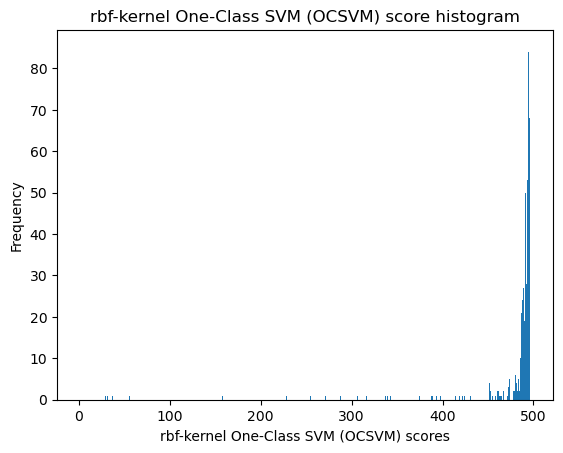

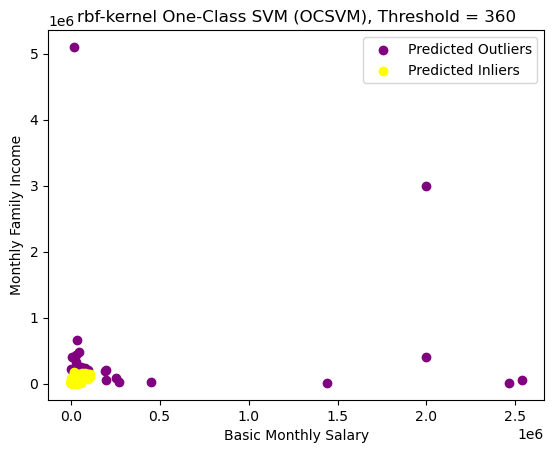

Number of predicted outliers: 38


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,True
114,10596,"ALERE, DINOS",40,19000,1,0,0,190000.0,1,3,4,3,1,1,1,2,2,1,4,4,5,5,4500,2,6,6,6,6,6,8,2,8,8,8,8,6,9,9,9,9,9,10,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,True
162,10679,"GONEZ, JAMES",25,80000,3,2,3,203000.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,1,True
200,10764,"SANTOS, JOHN CARLO",27,60000,3,1,5,65000.0,5000,1000,500,500,0,0,0,0,0,0,20000,5000,500,6000,0,1000,300,300,300,300,300,0,1625,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,True
253,11201,"ABALOS, GLYNN",36,80000,3,2,2,230000.0,13000,2000,1000,3640,0,0,0,0,0,0,0,0,2275,3900,57200,0,0,3000,0,0,0,1300,1625,0,0,0,0,0,0,0,0,0,0,50000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,True


[14, 24, 32, 50, 70, 114, 162, 200, 231, 253, 299, 323, 325, 380, 391, 405, 417, 435, 515, 556, 558, 563, 568, 584, 608, 677, 692, 702, 706, 762, 773, 830, 868, 912, 929, 940, 1009, 1046]


In [6]:
k = 'rbf'

scores = plot_hist_ocsvm(ho_t01_num, kernel=k,
                         bins=1_000)

ho_t01_outliers = plot_ocsvm(ho_t01_num, k, scores, 360)
print(ho_t01_outliers)

## EDA on Dataset

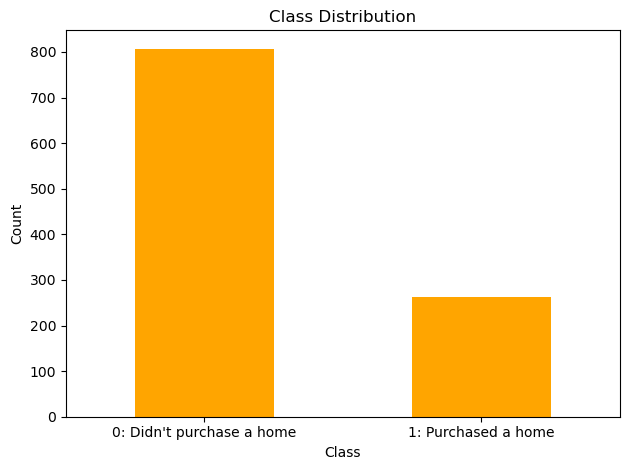

0    0.754206
1    0.245794
Name: home_ownership_class, dtype: float64

0    807
1    263
Name: home_ownership_class, dtype: int64

In [15]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()
display(df['home_ownership_class'].value_counts(normalize=True))
display(df['home_ownership_class'].value_counts())

## Runs: RobustScaler

In [17]:
t01_adaboost_gs, t01_adaboost_be, t01_adaboost_model_info, t01_adaboost_metrics_df = adaboost_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.2946003470213997
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.7946866408589603
Std Train Score (Precision) 0.005626320382390556
GridSearchCV Runtime: 7.619178295135498 secs
Run 1 - Random State: 0
Test Precision: 0.35106382978723405
Run 2 - Random State: 1
Test Precision: 0.23255813953488372
Run 3 - Random State: 2
Test Precision: 0.2054794520547945
Run 4 - Ra

Permutation explainer: 103it [00:22,  2.60it/s]                         
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


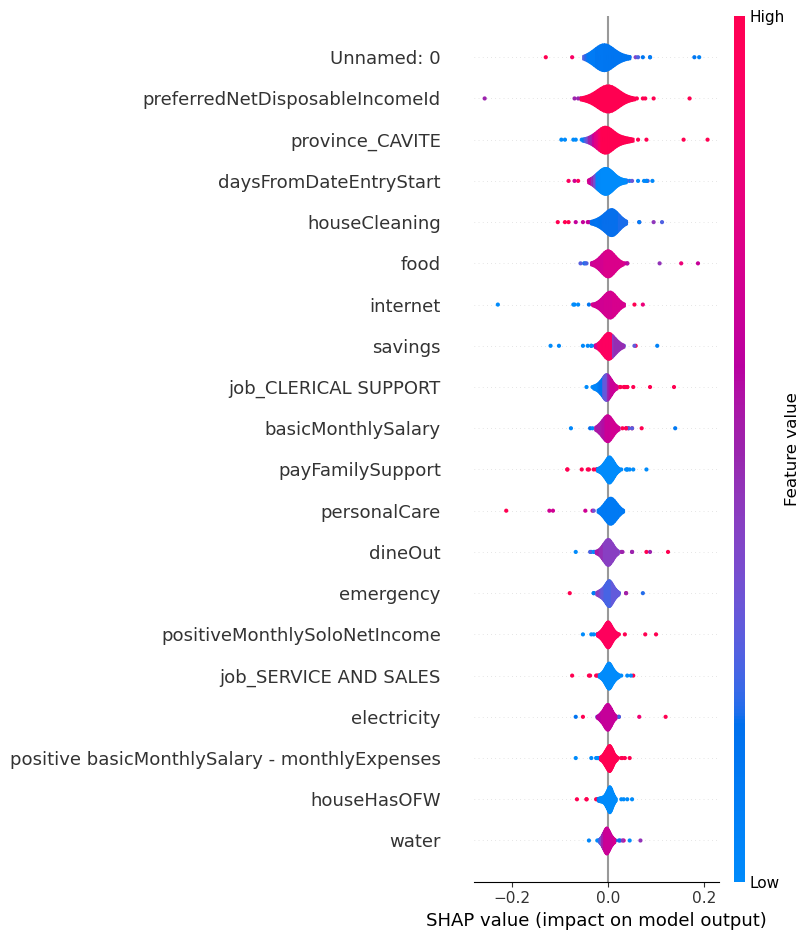

In [35]:
df = t01.copy()
# model = ho_t02_xgb_be.named_steps['classifier']
model = t01_adaboost_be
label_col = 'home_ownership_class'
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(model.predict, X_test)
# explainer = shap.TreeExplainer(model=model,
#                                data=X_test,
#                                model_output='raw',
# #                                feature_perturbation='tree_path_dependent'
#                               )

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)
# shap_values = explainer.shap_values(X_test)

feature_names = X.columns

# shap.summary_plot(shap_values, feature_names=feature_names, plot_type='dot')
shap.summary_plot(shap_values, feature_names=feature_names, plot_type='violin')

In [18]:
t01_dt_gs, t01_dt_be, t01_dt_model_info, t01_dt_metrics_df = dt_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__max_features': None, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.44226190476190474
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, min_samples_leaf=3,
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 19.480521202087402 secs
Run 1 - Random State: 0
Test Precision: 0.5
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.2857142857142857
Run 4 - Random State: 3
Test Precision: 0.2682926829268293
Run 5 - Random State: 4
Test Precision: 0.4
Ave Test Precision: 0.3574680603


4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1684 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

In [19]:
t01_logreg_gs, t01_logreg_be, t01_logreg_model_info, t01_logreg_metrics_df = logreg_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits


Best Hyperparameters: {'classifier__C': 0.01, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.46129870129870126
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.01, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 4.690246105194092 secs
Run 1 - Random State: 0
Test Precision: 0.4375
Run 2 - Random State: 1
Test Precision: 0.3269230769230769
Run 3 - Random State: 2
Test Precision: 0.37142857142857144
Run 4 - Random State: 3
Test Precision: 0.3488372093023256
Run 5 - Random State: 4
Test Precision: 0.30952380952380953
Ave Test Precision: 0.35884253343555667
Stdev Test Precision: 0.04974107995923584
Ave Test Accuracy: 0.7104477611940299
Stdev Test Accuracy: 0.023687418280752083
Ave Test Spec


650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

In [20]:
t01_knn_gs, t01_knn_be, t01_knn_model_info, t01_knn_metrics_df = knn_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits
Best Hyperparameters: {'classifier__metric': 'hamming', 'classifier__n_neighbors': 12, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.3778458066987479
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='hamming', n_neighbors=12))])
Mean Train Score (Precision) 0.47637600983698625
Std Train Score (Precision) 0.014028875472133983
GridSearchCV Runtime: 18.107035636901855 secs
Run 1 - Random State: 0
Test Precision: 0.4
Run 2 - Random State: 1
Test Precision: 0.32653061224489793
Run 3 - Random State: 2
Test Precision: 0.3673469387755102
Run 4 - Random State: 3
Test Precision: 0.3380281690140845
Run 5 - Random State: 4
Test Precision: 0.3783783783783784
Ave Test Precision: 0.3620568196825742
Stdev Test Precision: 0.02988959283233812
Ave 

In [21]:
t01_svm_gs, t01_svm_be, t01_svm_model_info, t01_svm_metrics_df = svm_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1000.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.3919969638113098
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 SVC(C=1000.0, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.2716877330064894
Std Train Score (Precision) 0.05720434441346807
GridSearchCV Runtime: 40.71975111961365 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.2
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.25
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.0
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.2
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.4074074074074074
Ave Test Precision: 0.21148148148148146
Stdev Test Precision: 0.1456

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [22]:
t01_catboost_gs, t01_catboost_be, t01_catboost_model_info, t01_catboost_metrics_df = catboost_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.007395
0:	learn: 0.6915598	total: 141ms	remaining: 2m 21s
1:	learn: 0.6902241	total: 143ms	remaining: 1m 11s
2:	learn: 0.6885221	total: 144ms	remaining: 48s
3:	learn: 0.6869195	total: 146ms	remaining: 36.3s
4:	learn: 0.6855746	total: 147ms	remaining: 29.3s
5:	learn: 0.6840031	total: 148ms	remaining: 24.6s
6:	learn: 0.6824300	total: 150ms	remaining: 21.2s
7:	learn: 0.6805293	total: 151ms	remaining: 18.7s
8:	learn: 0.6789418	total: 152ms	remaining: 16.7s
9:	learn: 0.6773940	total: 153ms	remaining: 15.2s
10:	learn: 0.6761061	total: 154ms	remaining: 13.9s
11:	learn: 0.6744709	total: 156ms	remaining: 12.8s
12:	learn: 0.6731676	total: 157ms	remaining: 12s
13:	learn: 0.6716287	total: 159ms	remaining: 11.2s
14:	learn: 0.6706459	total: 160ms	remaining: 10.5s
15:	learn: 0.6695716	total: 162ms	remaining: 9.94s
16:	learn: 0.6683306	total: 163ms	remaining: 9.44s
17:	learn: 0.6666759	total: 164ms	remaining: 8.97s
18:	learn: 0.6654919	total: 166ms	remaining: 8.58s
19:	learn: 0.

In [23]:
t01_lgbm_gs, t01_lgbm_be, t01_lgbm_model_info, t01_lgbm_metrics_df = lgbm_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Info] Number of positive: 605, number of negative: 605
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 554
[LightGBM] [Info] Number of data points in the train set: 1210, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 2, 'classifier__n_estimators': 400, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.32410404636625156
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', learning_rate=0.01,
        

In [24]:
t01_gbm_gs, t01_gbm_be, t01_gbm_model_info, t01_gbm_metrics_df = gbm_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.29283793586794166
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.5728646083457786
Std Train Score (Precision) 0.017159896994445804
GridSearchCV Runtime: 28.220099687576294 secs
Run 1 - Random State: 0
Test Precision: 0.32727272727272727
Run 2 - Random State: 1
Test Precision: 0.2868217054263566
Run 3 - Random State: 2
Test Precision: 0.233870967

In [26]:
t01_rf_gs, t01_rf_be, t01_rf_model_info, t01_rf_metrics_df = rf_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.3316343631165656
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=3, n_estimators=300,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.34677151180351834
Std Train Score (Precision) 0.00881715653127003
GridSearchCV Runtime: 196.0035538673401 secs
Run 1 - Random State: 0
Test Precision: 0.38738738738738737
Run 2 - Random State: 1

In [28]:
t01_xgb_gs, t01_xgb_be, t01_xgb_model_info, t01_xgb_metrics_df = xgb_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.32284617365119395
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importan

## Results

In [29]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't01_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t01_model_summ)
t01_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t01_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
0,k-Nearest Neighbors,0.362057,0.029890,0.377846,0.476376,0.014029,0.697015,0.019460,0.825743,0.303030,0.784457,0.325056,0.494463
2,Logistic Regression,0.358843,0.049741,0.461299,NaN,NaN,0.710448,0.023687,0.878218,0.196970,0.770075,0.246453,0.410384
3,Decision Tree,0.357468,0.094615,0.442262,NaN,NaN,0.730597,0.027973,0.941584,0.084848,0.758937,0.129003,0.274460
4,Random Forest,0.349957,0.038383,0.331634,0.346772,0.008817,0.627612,0.032465,0.637624,0.596970,0.828999,0.441038,0.616210
6,LightGBM,0.337400,0.029954,0.324104,0.420848,0.013859,0.609701,0.032486,0.611881,0.603030,0.825180,0.432180,0.606419
7,Extreme Gradient Boosting (XGBoost),0.325518,0.032016,0.322846,0.601048,0.013134,0.601493,0.029897,0.609901,0.575758,0.814970,0.415587,0.591751
9,CatBoost,0.309891,0.019699,0.291753,0.612674,0.016740,0.589552,0.022075,0.604950,0.542424,0.801932,0.394124,0.572162
5,Gradient Boosting Machine (GBM),0.281347,0.033189,0.292838,0.572865,0.017160,0.553731,0.037555,0.565347,0.518182,0.781710,0.364412,0.540848
8,AdaBoost,0.254904,0.057932,0.294600,0.794687,0.005626,0.596269,0.034137,0.680198,0.339394,0.759675,0.290602,0.476384
1,SVM Classifier,0.211481,0.145653,0.391997,0.271688,0.057204,0.737313,0.005006,0.962376,0.048485,0.756089,0.073964,0.168775


In [30]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t01_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.737313,SVM Classifier
Highest Test G-mean,0.616210,Random Forest
Highest Test Recall,0.603030,LightGBM
Highest Test Precision,0.362057,k-Nearest Neighbors
Highest Test Specificity,0.962376,SVM Classifier
Highest Test F1-score,0.441038,Random Forest


In [287]:
# model = t01_adaboost_be.named_steps['classifier']

# explainer = shap.TreeExplainer(model=model,
#                                data=None,
#                                model_output='raw',
#                                feature_perturbation='tree_path_dependent')

## Runs: StandardScaler

In [49]:
scaler = StandardScaler()

In [50]:
t01_adaboost_gs, t01_adaboost_be, t01_adaboost_model_info, t01_adaboost_metrics_df = adaboost_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.2994469944240446
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.7906751181600062
Std Train Score (Precision) 0.00579576055550197
GridSearchCV Runtime: 6.865035057067871 secs
Run 1 - Random State: 0
Test Precision: 0.30597014925373134
Run 2 - Random State: 1
Test Precision: 0.31496062992125984
Run 3 - Random State: 2
Test Precision: 0.28695652173913044
Run 4 - Random State: 3
Test Precision: 0.2878787878787879
Run 

In [51]:
t01_dt_gs, t01_dt_be, t01_dt_model_info, t01_dt_metrics_df = dt_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 3, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.49000000000000005
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(max_depth=3, max_features='sqrt',
                                        min_samples_leaf=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 24.017566919326782 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.0
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.3333333333333333
Ave Te


4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2560 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

In [52]:
t01_logreg_gs, t01_logreg_be, t01_logreg_model_info, t01_logreg_metrics_df = logreg_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits
Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.3252802676396461
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=1e-06, max_iter=1000, random_state=0,
                                    solver='liblinear'))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 5.432668685913086 secs
Run 1 - Random State: 0
Test Precision: 0.36
Run 2 - Random State: 1
Test Precision: 0.2608695652173913
Run 3 - Random State: 2
Test Precision: 0.35294117647058826
Run 4 - Random State: 3
Test Precision: 0.3258426966292135
Run 5 - Random State: 4
Test Precision: 0.3088235294117647
Ave Test Precision: 0.3216953935457915
Stdev Test 


650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

In [53]:
t01_knn_gs, t01_knn_be, t01_knn_model_info, t01_knn_metrics_df = knn_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'hamming', 'classifier__n_neighbors': 2, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.4238095238095238
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='hamming', n_neighbors=2))])
Mean Train Score (Precision) 0.4721368372230228
Std Train Score (Precision) 0.014673660863904795
GridSearchCV Runtime: 32.910905599594116 secs
Run 1 - Random State: 0
Test Precision: 0.38461538461538464
Run 2 - Random State: 1
Test Precision: 0.35294117647058826
Run 3 - Random State: 2
Test Precision: 0.2222222222222222
Run 4 - Random State: 3
Test Precision: 0.19230769230769232
Run 5 - Random State: 4
Test Precision: 0.7
Ave Test Precision: 0.3704172951231775
Stdev Test Precision: 0.20175267660524362
Ave Test Accuracy: 0.7350746268656716
Stdev Test Accuracy: 0.026777425549267393
Ave Test Spe

In [54]:
t01_svm_gs, t01_svm_be, t01_svm_model_info, t01_svm_metrics_df = svm_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 0.01, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.4583333333333333
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 SVC(C=0.01, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.2746931839116764
Std Train Score (Precision) 0.03397206525534724
GridSearchCV Runtime: 53.828747510910034 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.5
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.3333333333333333
[LibSVM]

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


Run 3 - Random State: 2
Test Precision: 0.359375
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.6
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.6666666666666666
Ave Test Precision: 0.49187499999999995
Stdev Test Precision: 0.14577454172073012
Ave Test Accuracy: 0.7402985074626866
Stdev Test Accuracy: 0.03038239251615267
Ave Test Specificity: 0.9514851485148516
Ave Test Recall: 0.09393939393939395
Ave Test NPV: 0.763905362932112
Ave Test F1-Score: 0.1162583061707733
Ave Test G-mean: 0.241588672494019
Ave Runtime: 0.1565007209777832


In [55]:
t01_catboost_gs, t01_catboost_be, t01_catboost_model_info, t01_catboost_metrics_df = catboost_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.00736
0:	learn: 0.6908158	total: 2.38ms	remaining: 2.37s
1:	learn: 0.6887008	total: 4.53ms	remaining: 2.26s
2:	learn: 0.6865764	total: 6.57ms	remaining: 2.18s
3:	learn: 0.6848388	total: 8.32ms	remaining: 2.07s
4:	learn: 0.6824651	total: 10.1ms	remaining: 2.02s
5:	learn: 0.6806374	total: 12ms	remaining: 1.99s
6:	learn: 0.6791144	total: 13.8ms	remaining: 1.95s
7:	learn: 0.6771490	total: 15.5ms	remaining: 1.92s
8:	learn: 0.6756810	total: 17.6ms	remaining: 1.94s
9:	learn: 0.6739825	total: 19.5ms	remaining: 1.93s
10:	learn: 0.6724247	total: 21.5ms	remaining: 1.93s
11:	learn: 0.6708677	total: 23.1ms	remaining: 1.9s
12:	learn: 0.6689479	total: 24.8ms	remaining: 1.88s
13:	learn: 0.6670423	total: 26.4ms	remaining: 1.86s
14:	learn: 0.6653306	total: 28.1ms	remaining: 1.85s
15:	learn: 0.6637717	total: 29.6ms	remaining: 1.82s
16:	learn: 0.6625303	total: 31ms	remaining: 1.79s
17:	learn: 0.6607114	total: 32.5ms	remaining: 1.77s
18:	learn: 0.6591886	total: 34.1ms	remaining: 1.76

In [56]:
t01_lgbm_gs, t01_lgbm_be, t01_lgbm_model_info, t01_lgbm_metrics_df = lgbm_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Info] Number of positive: 605, number of negative: 605
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 577
[LightGBM] [Info] Number of data points in the train set: 1210, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


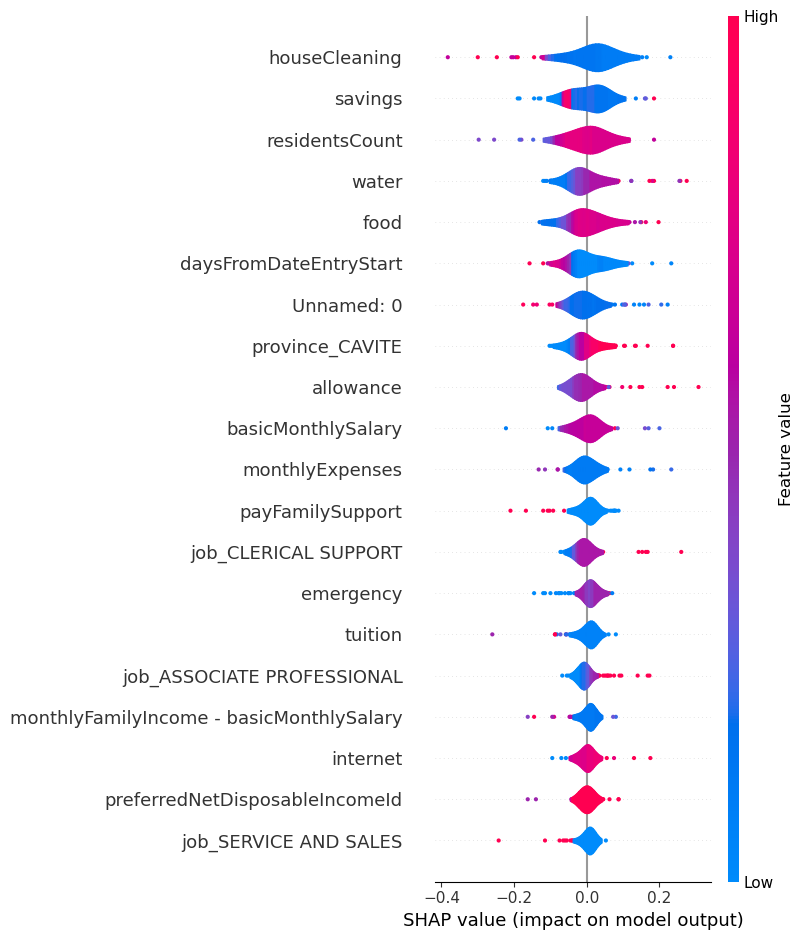

In [ ]:
df = t01.copy()
# model = ho_t02_xgb_be.named_steps['classifier']
model = t01_lgbm_be
label_col = 'home_ownership_class'
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(model.predict, X_test)
# explainer = shap.TreeExplainer(model=model,
#                                data=X_test,
#                                model_output='raw',
# #                                feature_perturbation='tree_path_dependent'
#                               )

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)
# shap_values = explainer.shap_values(X_test)

feature_names = X.columns

# shap.summary_plot(shap_values, feature_names=feature_names, plot_type='dot')
shap.summary_plot(shap_values, feature_names=feature_names, plot_type='violin')

In [57]:
t01_gbm_gs, t01_gbm_be, t01_gbm_model_info, t01_gbm_metrics_df = gbm_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


KeyboardInterrupt: 

In [ ]:
t01_rf_gs, t01_rf_be, t01_rf_model_info, t01_rf_metrics_df = rf_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.34056631019479316
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=3, min_samples_leaf=3,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.4514879858240946
Std Train Score (Precision) 0.025808457206570996
GridSearchCV Runtime: 370.96174335479736 secs
Run 1 - Random State: 0
Test Precision: 0.5333333333333333
Run 2 - Random State: 1
Test Precision: 0.3582089552238806
R

In [ ]:
t01_xgb_gs, t01_xgb_be, t01_xgb_model_info, t01_xgb_metrics_df = xgb_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.4305555555555555
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
     

In [ ]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't01_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t01_model_summ)
t01_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t01_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
8,AdaBoost,0.465021,0.125150,0.365476,0.826417,0.007437,0.743284,0.743284,0.936634,0.151515,0.771690,0.222359,0.372630
9,CatBoost,0.437123,0.055523,0.396667,0.835777,0.007151,0.741045,0.741045,0.928713,0.166667,0.773270,0.240825,0.393266
7,Extreme Gradient Boosting (XGBoost),0.426831,0.067163,0.430556,0.744636,0.013497,0.736567,0.736567,0.905941,0.218182,0.780211,0.287847,0.441626
4,Random Forest,0.403596,0.075462,0.340566,0.451488,0.025808,0.714925,0.714925,0.853465,0.290909,0.786924,0.329476,0.491623
6,LightGBM,0.400155,0.031775,0.413479,0.629024,0.020450,0.727612,0.727612,0.898020,0.206061,0.775884,0.271085,0.429621
3,Decision Tree,0.382471,0.088851,0.552121,NaN,NaN,0.728358,0.728358,0.918812,0.145455,0.766862,0.208210,0.363699
0,k-Nearest Neighbors,0.346474,0.132889,0.378571,0.499571,0.017212,0.738806,0.738806,0.959406,0.063636,0.758221,0.106661,0.242646
5,Gradient Boosting Machine (GBM),0.341242,0.031980,0.361237,0.789319,0.013797,0.690299,0.690299,0.826733,0.272727,0.776782,0.301486,0.473083
2,Logistic Regression,0.326318,0.022898,0.325373,NaN,NaN,0.611940,0.611940,0.634653,0.542424,0.809638,0.407281,0.586016
1,SVM Classifier,0.268571,0.150373,0.375379,0.489193,0.027501,0.694776,0.694776,0.848515,0.224242,0.772320,0.230470,0.366415


In [ ]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t01_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.743284,AdaBoost
Highest Test G-mean,0.586016,Logistic Regression
Highest Test Recall,0.542424,Logistic Regression
Highest Test Precision,0.465021,AdaBoost
Highest Test Specificity,0.959406,k-Nearest Neighbors
Highest Test F1-score,0.407281,Logistic Regression


## Runs: MinMaxScaler

In [ ]:
scaler = MinMaxScaler()

In [ ]:
t01_adaboost_gs, t01_adaboost_be, t01_adaboost_model_info, t01_adaboost_metrics_df = adaboost_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.36698135198135196
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8203665733377411
Std Train Score (Precision) 0.006787868455785764
GridSearchCV Runtime: 12.050014972686768 secs
Run 1 - Random State: 0
Test Precision: 0.3333333333333333
Run 2 - Random State: 1
Test Precision: 0.2571428571428571
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 

In [ ]:
t01_dt_gs, t01_dt_be, t01_dt_model_info, t01_dt_metrics_df = dt_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2423 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__max_features': 'log2', 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 3, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.5874819624819624
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, max_features='log2',
                                        min_samples_split=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 45.51039505004883 secs
Run 1 - Random State: 0
Test Precision: 0.45454545454545453
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.26666666666666666
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.5
Ave Test Precision: 0.3509090909090909
Stdev Test Precision: 0.125646171904

In [ ]:
t01_logreg_gs, t01_logreg_be, t01_logreg_model_info, t01_logreg_metrics_df = logreg_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.01, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.45
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.01, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 42.30820631980896 secs
Run 1 - Random State: 0
Test Precision: 0.35714285714285715
Run 2 - Random State: 1
Test Precision: 0.37142857142857144
Run 3 - Random State: 2
Test Precision: 0.4
Run 4 - Random State: 3
Test Precision: 0.375
Run 5 - Random State: 4
Test Precision: 0.3953488372093023
Ave Test Precision: 0.37978405315614616
Stdev Test Precision: 0.017721963814908818
Ave Test Accuracy: 0.7350746268656716
Stdev Test Accuracy: 0.0142085319139252
Ave Test Specificity: 0.9356435643564357
Ave 

In [ ]:
t01_knn_gs, t01_knn_be, t01_knn_model_info, t01_knn_metrics_df = knn_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits
Best Hyperparameters: {'classifier__metric': 'chebyshev', 'classifier__n_neighbors': 13, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.3963888888888889
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='chebyshev', n_neighbors=13))])
Mean Train Score (Precision) 0.5030823205250171
Std Train Score (Precision) 0.015390835611851911
GridSearchCV Runtime: 70.98736572265625 secs
Run 1 - Random State: 0
Test Precision: 0.2608695652173913
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.23529411764705882
Run 4 - Random State: 3
Test Precision: 0.1875
Run 5 - Random State: 4
Test Precision: 0.15
Ave Test Precision: 0.20673273657289
Stdev Test Precision: 0.042954569027750196
Ave Test Accuracy: 0.7119402985074627
Stdev Test Accura

In [ ]:
t01_svm_gs, t01_svm_be, t01_svm_model_info, t01_svm_metrics_df = svm_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.36460312835312836
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 SVC(C=1e-06, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.3972907993648116
Std Train Score (Precision) 0.01428982707183499
GridSearchCV Runtime: 112.69371676445007 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.2972972972972973
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.27692307692307694
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.3333333333333333
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.30434782608695654
[LibSVM]R

In [ ]:
t01_catboost_gs, t01_catboost_be, t01_catboost_model_info, t01_catboost_metrics_df = catboost_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.011235
0:	learn: 0.6899036	total: 22.4ms	remaining: 22.3s
1:	learn: 0.6879018	total: 27.7ms	remaining: 13.8s
2:	learn: 0.6855107	total: 33.2ms	remaining: 11s
3:	learn: 0.6818007	total: 38.2ms	remaining: 9.5s
4:	learn: 0.6779000	total: 42.9ms	remaining: 8.54s
5:	learn: 0.6739376	total: 48.4ms	remaining: 8.01s
6:	learn: 0.6718846	total: 53.9ms	remaining: 7.64s
7:	learn: 0.6696322	total: 58.6ms	remaining: 7.27s
8:	learn: 0.6671108	total: 64.1ms	remaining: 7.05s
9:	learn: 0.6639419	total: 69.3ms	remaining: 6.86s
10:	learn: 0.6603524	total: 74.2ms	remaining: 6.67s
11:	learn: 0.6570631	total: 79.4ms	remaining: 6.54s
12:	learn: 0.6546488	total: 84.7ms	remaining: 6.43s
13:	learn: 0.6521371	total: 89.6ms	remaining: 6.31s
14:	learn: 0.6499302	total: 94.9ms	remaining: 6.23s
15:	learn: 0.6467228	total: 100ms	remaining: 6.16s
16:	learn: 0.6441519	total: 105ms	remaining: 6.09s
17:	learn: 0.6427153	total: 111ms	remain

In [ ]:
t01_lgbm_gs, t01_lgbm_be, t01_lgbm_model_info, t01_lgbm_metrics_df = lgbm_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 605, number of negative: 605
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10391
[LightGBM] [Info] Number of data points in the train set: 1210, number of used features: 93
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits wit

In [ ]:
t01_gbm_gs, t01_gbm_be, t01_gbm_model_info, t01_gbm_metrics_df = gbm_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.36415336984996427
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=2,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.7804951226850534
Std Train Score (Precision) 0.01404909561382805
GridSearchCV Runtime: 213.00230240821838 secs
Run 1 - Random State: 0
Test Precision: 0.3448275862068966
Run 2 - Random State: 1
Test Precision: 0.3181818181818182
Run 3 - Random State: 2
Test Precisio

In [ ]:
t01_rf_gs, t01_rf_be, t01_rf_model_info, t01_rf_metrics_df = rf_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.34876662243844914
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=3, min_samples_leaf=3,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.43030479827739093
Std Train Score (Precision) 0.020067863602251435
GridSearchCV Runtime: 343.91191601753235 secs
Run 1 - Random State: 0
Test Precision: 0.49206349206349204
Run 2 - Random State: 1
Test Precision: 0.32978723404255317


In [ ]:
t01_xgb_gs, t01_xgb_be, t01_xgb_model_info, t01_xgb_metrics_df = xgb_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.4313128538128539
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
       

In [ ]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't01_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t01_model_summ)
t01_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t01_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
7,Extreme Gradient Boosting (XGBoost),0.405552,0.046765,0.431313,0.732847,0.012492,0.728358,0.013297,0.894059,0.221212,0.778486,0.285707,0.443606
9,CatBoost,0.398939,0.061458,0.379297,0.824066,0.007152,0.730597,0.730597,0.909901,0.181818,0.772937,0.249016,0.405408
4,Random Forest,0.386338,0.065611,0.348767,0.430305,0.020068,0.689552,0.042166,0.778218,0.418182,0.803521,0.399484,0.568680
6,LightGBM,0.385316,0.037428,0.389121,0.612427,0.017244,0.700000,0.023392,0.812871,0.354545,0.793967,0.367932,0.536020
2,Logistic Regression,0.379784,0.017722,0.450000,NaN,NaN,0.735075,0.735075,0.935644,0.121212,0.765789,0.166354,0.309009
3,Decision Tree,0.350909,0.125646,0.587482,NaN,NaN,0.741791,0.741791,0.968317,0.048485,0.756994,0.081935,0.204701
5,Gradient Boosting Machine (GBM),0.344044,0.034092,0.364153,0.780495,0.014049,0.691045,0.021500,0.826733,0.275758,0.777481,0.304542,0.475888
8,AdaBoost,0.329689,0.075809,0.366981,0.820367,0.006788,0.714925,0.714925,0.900000,0.148485,0.763883,0.203125,0.362622
1,SVM Classifier,0.299852,0.021387,0.364603,0.397291,0.014290,0.614179,0.614179,0.676238,0.424242,0.785070,0.344372,0.522157
0,k-Nearest Neighbors,0.206733,0.042955,0.396389,0.503082,0.015391,0.711940,0.711940,0.924752,0.060606,0.750812,0.093436,0.234633


In [ ]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t01_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.741791,Decision Tree
Highest Test G-mean,0.568680,Random Forest
Highest Test Recall,0.424242,SVM Classifier
Highest Test Precision,0.405552,Extreme Gradient Boosting (XGBoost)
Highest Test Specificity,0.968317,Decision Tree
Highest Test F1-score,0.399484,Random Forest


# HO_T02: Overall Dataset - 1

In [31]:
# Loading the dataset
dataset = pd.read_csv('data/df_cluster_Cao_3.csv')
# dataset = dataset.drop('Unnamed: 0', axis=1)

# Creating 'daysFromDateEntryStart'
dataset['dateEntry'] = pd.to_datetime(dataset['dateEntry'], format='%Y-%m-%d')
dateEntryStart = pd.to_datetime('2022-03-28', format='%Y-%m-%d')
dataset['daysFromDateEntryStart'] = (dataset['dateEntry'] - dateEntryStart).dt.days

# Dropping irrelevant columns
cols_to_drop = [
    'id', 'fullName', 'firstName', 'lastName', 'address', 'occupation', 'dateEntry'
]
dataset = dataset.drop(cols_to_drop, axis=1)

boolean_columns = [col for col in dataset.columns if dataset[col].dtype == bool]
dataset[boolean_columns] = dataset[boolean_columns].apply(lambda x: x.astype('int'))

columns_to_move = ['lastFirstName', 'age', 'gender', 'province', 'job']
columns_remaining = [col for col in dataset.columns if col not in columns_to_move]

new_column_order = columns_to_move + columns_remaining
dataset = dataset[new_column_order]
dataset.insert(0, 'userId', dataset.pop('userId'))

def map_ageing_class(row):
    found_in_hdmf = row['foundInHDMF']
    home_ownership_class = row['home_ownership_class']

    if home_ownership_class == 0:
        return np.nan
    elif found_in_hdmf in [' Current', 'FP', '01 mos', '02 mos', '03 mos']:
        return 0
    elif found_in_hdmf in ['04 mos', '05 mos']:
        return 1

# One-hot encoding of categorical columns
# dataset = pd.get_dummies(dataset, columns=['gender'], prefix='gender', drop_first='True')
# dataset = pd.get_dummies(dataset, columns=['province'], prefix='province')
# dataset = pd.get_dummies(dataset, columns=['job'], prefix='job')

dataset['home_ownership_class'] = ((dataset['foundInOS'] != 'False') |
                                   (dataset['foundInHDMF'] != 'False')).astype('int')

# dataset['ageing_class'] = dataset['home_ownership_class'].astype('int64')
# dataset['ageing_class'] = dataset.apply(map_ageing_class, axis=1)

cols_to_drop = ['foundInOS', 'foundInHDMF']
dataset = dataset.drop(cols_to_drop, axis=1)

# Selecting only Cluster 1 from the dataset
dataset = dataset[dataset['cluster'] == 0].drop(columns=['cluster'])
dataset

,userId,lastFirstName,age,gender,province,job,Unnamed: 0,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,daysFromDateEntryStart,home_ownership_class
0,370,"IBALI, HOWARD",24,MALE,METRO MANILA,SERVICE AND SALES,0,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,25,1
1,1025,"PATALINGHOG, KIMBERLY",26,FEMALE,METRO MANILA,SERVICE AND SALES,1,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0
3,1719,"OSCARES, ELMER",32,MALE,UNKNOWN,MACHINE OPERATOR,3,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,7,1
5,2250,"ALARCON, RIZA",38,FEMALE,CAVITE,SERVICE AND SALES,5,15000,1,2,4,20000.0,5000,1000,800,500,0,0,0,500,500,200,0,0,215,270,0,0,0,0,0,0,200,0,500,0,0,0,0,0,0,0,0,0,0,1000,0,1,1,0,1,0,0,0,1,1,0,0,0,1,0,14,0
8,3979,"QUIATCHON, MILA",29,FEMALE,BULACAN,ASSOCIATE PROFESSIONAL,8,58000,3,2,4,100000.0,5000,800,800,0,0,3000,0,0,0,0,0,0,500,3000,0,0,0,0,0,0,500,0,1000,0,0,0,0,4150,0,0,0,0,0,10000,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,179,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1056,12836,"TULING, JAN NERILYN",26,FEMALE,METRO MANILA,CLERICAL SUPPORT,1056,50000,3,3,6,74000.0,1500,300,150,0,0,0,0,0,0,0,1000,0,100,100,5500,100,0,500,500,100,100,0,1699,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,232,0
1060,12844,"DELOS SANTOS, MARK ANGELO",36,MALE,BULACAN,MANAGER,1060,15000,1,0,0,15000.0,3000,1000,500,100,50,100,0,0,0,0,1000,500,250,200,3500,0,0,0,0,100,0,0,0,0,0,0,0,0,0,0,0,0,0,3000,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,232,0
1062,12847,"DIOSO, DANISA",25,FEMALE,METRO MANILA,CLERICAL SUPPORT,1062,16800,2,4,5,38800.0,0,0,0,1500,0,0,0,0,0,0,0,0,600,2000,4000,0,0,0,0,0,0,0,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,232,0
1066,12852,"TEJADA, JERIC",27,MALE,LAGUNA,CRAFT AND TRADE,1066,20,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,0,0,0,0,500,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,232,0


In [32]:
df = dataset.copy()

df['monthlyUtilityBills'] = (
    df['water'] + df['electricity'] + df['rent'] +
    df['internet'] + df['mobileLoad']
)
df['monthlyVices'] = (
    df['smoking'] + df['alcohol'] + df['gambling'] +
    df['smallLottery'] + df['otherVices']
)
df['monthlyExpenses'] = (
    df['food'] + df['hygiene'] + df['houseCleaning'] +
    df['fare'] + df['parking'] + df['gasoline'] +
    df['tuition'] + df['allowance'] + df['uniform'] +
    df['otherEducation'] + df['emergency'] + df['medicine'] +
    df['repair'] + df['cinema'] + df['dineOut'] +
    df['leisure'] + df['personalCare'] + df['clothing'] +
    df['vehicleLoan'] + df['monthlyUtilityBills'] +
    df['informalLenders'] + df['companyLoan'] + df['privateLoans'] +
    df['governmentLoans'] + df['monthlyVices']
)
df['monthlySoloNetIncome'] = (
    df['basicMonthlySalary'] - df['monthlyExpenses']
)
df['positiveMonthlySoloNetIncome'] = (
    df['monthlySoloNetIncome'] > 0
).astype(int)
df['monthlyFamilyNetIncome'] = (
    df['monthlyFamilyIncome'] - df['monthlyExpenses']
)
df['positiveMonthlyFamilyNetIncome'] = (
    df['monthlyFamilyNetIncome'] > 0
).astype(int)
df['monthlySoloNetIncomeWithSavings'] = (
    df['basicMonthlySalary'] + df['savings'] - df['monthlyExpenses']
)
df['positiveMonthlySoloNetIncomeWithSavings'] = (
    df['monthlySoloNetIncomeWithSavings'] > 0
).astype(int)
df['monthlyFamilyNetIncomeWithSavings'] = (
    df['monthlyFamilyIncome'] + df['savings'] - df['monthlyExpenses']
)
df['positiveMonthlyFamilyNetIncomeWithSavings'] = (
    df['monthlyFamilyNetIncomeWithSavings'] > 0
).astype(int)
df['monthlyFamilyIncome - basicMonthlySalary'] = (
    df['monthlyFamilyIncome'] - df['basicMonthlySalary']
)
df['positive monthlyFamilyIncome - basicMonthlySalary'] = (
    df['monthlyFamilyIncome - basicMonthlySalary'] > 0
).astype(int)
df['basicMonthlySalary - monthlyExpenses'] = (
    df['basicMonthlySalary'] - df['monthlyExpenses']
)
df['positive basicMonthlySalary - monthlyExpenses'] = (
    df['basicMonthlySalary - monthlyExpenses'] > 0
).astype(int)
df['monthlyFamilyIncome - monthlyExpenses'] = (
    df['monthlyFamilyIncome'] - df['monthlyExpenses']
)
df['positive monthlyFamilyIncome - monthlyExpenses'] = (
    df['monthlyFamilyIncome - monthlyExpenses'] > 0
).astype(int)
df['basicMonthlySalary / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['monthlyFamilyIncome']
)
df['monthlyExpenses / basicMonthlySalary'] = np.where(
    df['basicMonthlySalary'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['basicMonthlySalary']
)
df['monthlyExpenses / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['monthlyFamilyIncome']
)
df['monthlyVices / basicMonthlySalary'] = np.where(
    df['basicMonthlySalary'] == 0,
    np.nan,
    df['monthlyVices'] / df['basicMonthlySalary']
)
df['monthlyVices / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['monthlyVices'] / df['monthlyFamilyIncome']
)
df['basicMonthlySalary / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['workingFamilyCount']
)
df['basicMonthlySalary / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['residentsCount']
)
df['monthlyFamilyIncome / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyFamilyIncome'] / df['workingFamilyCount']
)
df['monthlyFamilyIncome / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyFamilyIncome'] / df['residentsCount']
)
df['monthlyExpenses / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['workingFamilyCount']
)
df['monthlyExpenses / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['residentsCount']
)
df['monthlyUtilityBills / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyUtilityBills'] / df['workingFamilyCount']
)
df['monthlyUtilityBills / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyUtilityBills'] / df['residentsCount']
)
dataset = df.copy()

# Convert all int32 columns to int64
for col in dataset.select_dtypes(include='int32').columns:
    dataset[col] = dataset[col].astype('int64')

dataset['userId'] = dataset['userId'].astype(str)
dataset

,userId,lastFirstName,age,gender,province,job,Unnamed: 0,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,daysFromDateEntryStart,home_ownership_class,monthlyUtilityBills,monthlyVices,monthlyExpenses,monthlySoloNetIncome,positiveMonthlySoloNetIncome,monthlyFamilyNetIncome,positiveMonthlyFamilyNetIncome,monthlySoloNetIncomeWithSavings,positiveMonthlySoloNetIncomeWithSavings,monthlyFamilyNetIncomeWithSavings,positiveMonthlyFamilyNetIncomeWithSavings,monthlyFamilyIncome - basicMonthlySalary,positive monthlyFamilyIncome - basicMonthlySalary,basicMonthlySalary - monthlyExpenses,positive basicMonthlySalary - monthlyExpenses,monthlyFamilyIncome - monthlyExpenses,positive monthlyFamilyIncome - monthlyExpenses,basicMonthlySalary / monthlyFamilyIncome,monthlyExpenses / basicMonthlySalary,monthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary,monthlyVices / monthlyFamilyIncome,basicMonthlySalary / workingFamilyCount,basicMonthlySalary / residentsCount,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,monthlyExpenses / workingFamilyCount,monthlyExpenses / residentsCount,monthlyUtilityBills / workingFamilyCount,monthlyUtilityBills / residentsCount
0,370,"IBALI, HOWARD",24,MALE,METRO MANILA,SERVICE AND SALES,0,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,25,1,50,0,2950,16050,1,37050.0,1,18050,1,39050.0,1,21000.0,1,16050,1,37050.0,1,0.475000,0.155263,0.073750,0.0,0.0,6333.333333,6333.333333,13333.333333,13333.333333,983.333333,983.333333,16.666667,16.666667
1,1025,"PATALINGHOG, KIMBERLY",26,FEMALE,METRO MANILA,SERVICE AND SALES,1,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1400,0,15900,-900,0,14100.0,1,1100,1,16100.0,1,15000.0,1,-900,0,14100.0,1,0.500000,1.060000,0.530000,0.0,0.0,7500.000000,3750.000000,15000.000000,7500.000000,7950.000000,3975.000000,700.000000,350.000000
3,1719,"OSCARES, ELMER",32,MALE,UNKNOWN,MACHINE OPERATOR,3,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,7,1,3800,0,8168,13032,1,3832.0,1,13532,1,4332.0,1,-9200.0,0,13032,1,3832.0,1,1.766667,0.385283,0.680667,0.0,0.0,NaN,4240.000000,NaN,2400.000000,NaN,1633.600000,NaN,760.000000
5,2250,"ALARCON, RIZA",38,FEMALE,CAVITE,SERVICE AND SALES,5,15000,1,2,4,20000.0,5000,1000,800,500,0,0,0,500,500,200,0,0,215,270,0,0,0,0,0,0,200,0,500,0,0,0,0,0,0,0,0,0,0,1000,0,1,1,0,1,0,0,0,1,1,0,0,0,1,0,14,0,985,0,9685,5315,1,10315.0,1,6315,1,11315.0,1,5000.0,1,5315,1,10315.0,1,0.750000,0.645667,0.484250,0.0,0.0,7500.000000,3750.000000,10000.000000,5000.000000,4842.500000,2421.250000,492.500000,246.250000
8,3979,"QUIATCHON, MILA",29,FEMALE,BULACAN,ASSOCIATE PROFESSIONAL,8,58000,3,2,4,100000.0,5000,800,800,0,0,3000,0,0,0,0,0,0,500,3000,0,0,0,0,0,0,500,0,1000,0,0,0,0,4150,0,0,0,0,0,10000,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,179,0,4500,0,18750,39250,1,81250.0,1,49250,1,91250.0,1,42000.0,1,39250,1,81250.0,1,0.580000,0.323276,0.187500,0.0,0.0,29000.000000,14500.000000,50000.000000,25000.000000,9375.000000,4687.500000,2250.000000,1125.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [33]:
t02 = dataset.copy().drop(columns=cols_with_nulls)
# t02_num = t02.drop(columns=['gender', 'province', 'job'])
t02 = pd.get_dummies(t02, columns=['gender'], prefix='gender', drop_first='True')
t02 = pd.get_dummies(t02, columns=['province'], prefix='province', drop_first='True')
t02 = pd.get_dummies(t02, columns=['job'], prefix='job', drop_first='True')

t02.loc[t02['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000
t02 = t02.copy().loc[:, ['userId', 'lastFirstName', 'basicMonthlySalary', 'monthlyFamilyIncome', 'internet',
                         'monthlyFamilyNetIncome', 'home_ownership_class']]
# t02.isna().sum()[t02.isna().sum() > 0]
df = t02

## EDA on Dataset

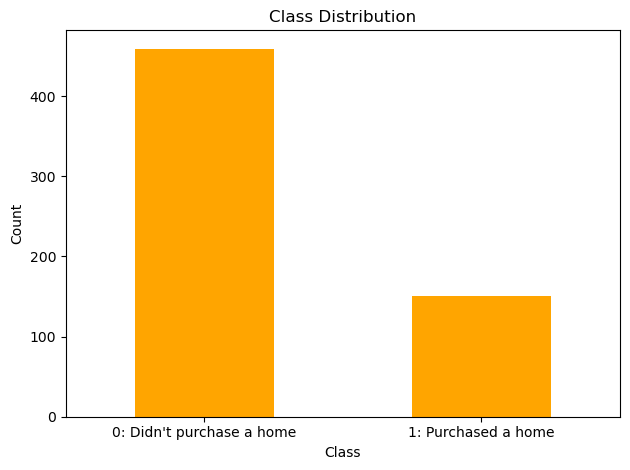

0    0.752459
1    0.247541
Name: home_ownership_class, dtype: float64

0    459
1    151
Name: home_ownership_class, dtype: int64

In [34]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()
display(df['home_ownership_class'].value_counts(normalize=True))
display(df['home_ownership_class'].value_counts())

## Runs: RobustScaler()

In [35]:
scaler = RobustScaler()

In [36]:
t02_adaboost_gs, t02_adaboost_be, t02_adaboost_model_info, t02_adaboost_metrics_df = adaboost_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.38896825396825396
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8015875156030912
Std Train Score (Precision) 0.008565268746967357
GridSearchCV Runtime: 5.054129123687744 secs
Run 1 - Random State: 0
Test Precision: 0.2682926829268293
Run 2 - Random State: 1
Test Precision: 0.2777777777777778
Run 3 - Random State: 2
Test Precision: 0.35
Run 4 - Random State: 3
Test Precision: 0.391304347826087
Run 5 

In [37]:
t02_dt_gs, t02_dt_be, t02_dt_model_info, t02_dt_metrics_df = dt_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__max_features': None, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': SMOTEENN(random_state=0)}
Best Validation Score (Precision): 0.3719086365261392
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTEENN(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 21.51339316368103 secs
Run 1 - Random State: 0
Test Precision: 0.3333333333333333
Run 2 - Random State: 1
Test Precision: 0.3968253968253968
Run 3 - Random State: 2
Test Precision: 0.3157894736842105
Run 4 - Random State: 3
Test Precision: 0.3846153846153846


4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2256 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

In [38]:
t02_logreg_gs, t02_logreg_be, t02_logreg_model_info, t02_logreg_metrics_df = logreg_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits
Best Hyperparameters: {'classifier__C': 0.01, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4333333333333334
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.01, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 5.489626407623291 secs
Run 1 - Random State: 0
Test Precision: 0.391304347826087
Run 2 - Random State: 1
Test Precision: 0.36363636363636365
Run 3 - Random State: 2
Test Precision: 0.3684210526315789
Run 4 - Random State: 3
Test Precision: 0.3
Run 5 - Random State: 4
Test Precision: 0.5185185185185185
Ave Test Precision: 0.38837605652250967
Stdev Test Precision: 0.0802592942518169
Ave Test Accuracy: 0.71633986928104


650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

In [39]:
t02_knn_gs, t02_knn_be, t02_knn_model_info, t02_knn_metrics_df = knn_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'hamming', 'classifier__n_neighbors': 1, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.43499999999999994
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='hamming', n_neighbors=1))])
Mean Train Score (Precision) 0.5155927357851986
Std Train Score (Precision) 0.02093139688091724
GridSearchCV Runtime: 15.372159481048584 secs
Run 1 - Random State: 0
Test Precision: 0.28
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.21428571428571427
Run 4 - Random State: 3
Test Precision: 0.23809523809523808
Run 5 - Random State: 4
Test Precision: 0.25806451612903225
Ave Test Precision: 0.24808909370199692
Stdev Test Precision: 0.024310554117951466
Ave Test Accuracy: 0.6588235294117648
Stdev Test Accuracy: 0.03794228829725489
Ave Test Specificity: 0.8173

In [40]:
t02_svm_gs, t02_svm_be, t02_svm_model_info, t02_svm_metrics_df = svm_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.43539682539682545
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 SVC(kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.2988546847364553
Std Train Score (Precision) 0.07592631332038603
GridSearchCV Runtime: 20.811039686203003 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.3684210526315789
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.24836601307189543
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.24836601307189543
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.3333333333333333
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.2222222222222222
Ave Test Precision

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
invalid value encountered in scalar divide
invalid value encountered in scalar divide
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [41]:
t02_catboost_gs, t02_catboost_be, t02_catboost_model_info, t02_catboost_metrics_df = catboost_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.008782
0:	learn: 0.6918920	total: 2.88ms	remaining: 2.87s
1:	learn: 0.6901830	total: 5.3ms	remaining: 2.64s
2:	learn: 0.6884161	total: 7.57ms	remaining: 2.52s
3:	learn: 0.6869138	total: 9.81ms	remaining: 2.44s
4:	learn: 0.6856543	total: 11.5ms	remaining: 2.29s
5:	learn: 0.6840178	total: 13.2ms	remaining: 2.18s
6:	learn: 0.6825449	total: 14.7ms	remaining: 2.09s
7:	learn: 0.6809022	total: 16.2ms	remaining: 2.01s
8:	learn: 0.6795820	total: 17.9ms	remaining: 1.97s
9:	learn: 0.6782533	total: 19.7ms	remaining: 1.95s
10:	learn: 0.6769966	total: 21.3ms	remaining: 1.92s
11:	learn: 0.6756286	total: 23ms	remaining: 1.9s
12:	learn: 0.6739691	total: 24.8ms	remaining: 1.88s
13:	learn: 0.6727309	total: 26.4ms	remaining: 1.86s
14:	learn: 0.6712934	total: 28.1ms	remaining: 1.84s
15:	learn: 0.6705432	total: 29.8ms	remaining: 1.83s
16:	learn: 0.6691389	total: 31.4ms	remaining: 1.82s
17:	learn: 0.6677347	total: 33ms	remain

In [43]:
t02_lgbm_gs, t02_lgbm_be, t02_lgbm_model_info, t02_lgbm_metrics_df = lgbm_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Info] Number of positive: 113, number of negative: 164
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 277, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.407942 -> initscore=-0.372479
[LightGBM] [Info] Start training from score -0.372479
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

In [44]:
t02_gbm_gs, t02_gbm_be, t02_gbm_model_info, t02_gbm_metrics_df = gbm_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.388923723335488
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=2,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.6666541037482692
Std Train Score (Precision) 0.022595000217235782
GridSearchCV Runtime: 20.9343683719635 secs
Run 1 - Random State: 0
Test Precision: 0.24528301886792453
Run 2 - Random State: 1
Test Precision: 0.2765957446808511
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.28888888888888886
Run 5

In [45]:
t02_rf_gs, t02_rf_be, t02_rf_model_info, t02_rf_metrics_df = rf_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.3777878714067972
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=300, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.4005647908449544
Std Train Score (Precision) 0.013994860133536341
GridSearchCV Runtime: 181.13479328155518 secs
Run 1 - Random State: 0
Test Precision: 0.32
Run 2 - Random State: 1
Test Precision: 0.3472222222222222
Ru

In [46]:
t02_xgb_gs, t02_xgb_be, t02_xgb_model_info, t02_xgb_metrics_df = xgb_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits


Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.4135804473304473
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constra

## Results

In [47]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't02_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t02_model_summ)
t02_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t02_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
2,Logistic Regression,0.388376,0.080259,0.433333,NaN,NaN,0.716340,0.030165,0.871304,0.247368,0.778065,0.300568,0.460779
3,Decision Tree,0.375768,0.052861,0.371909,NaN,NaN,0.660131,0.037830,0.692174,0.563158,0.828134,0.450282,0.622540
6,LightGBM,0.365927,0.044713,0.373148,0.480848,0.017603,0.649673,0.038833,0.681739,0.552632,0.821816,0.439425,0.612617
4,Random Forest,0.350644,0.027566,0.377788,0.400565,0.013995,0.618301,0.035679,0.617391,0.621053,0.831965,0.446669,0.617028
9,CatBoost,0.331640,0.044716,0.367937,0.652790,0.022959,0.658824,0.025482,0.753043,0.373684,0.785043,0.349448,0.526482
8,AdaBoost,0.330202,0.054370,0.388968,0.801588,0.008565,0.667974,0.034399,0.784348,0.315789,0.776462,0.318610,0.493657
7,Extreme Gradient Boosting (XGBoost),0.326429,0.045918,0.413580,0.654665,0.016246,0.664052,0.016405,0.770435,0.342105,0.780492,0.333151,0.509881
5,Gradient Boosting Machine (GBM),0.289198,0.032390,0.388924,0.666654,0.022595,0.610458,0.020461,0.681739,0.394737,0.773824,0.332932,0.516080
1,SVM Classifier,0.284142,0.063081,0.435397,0.298855,0.075926,0.532026,0.258959,0.553043,0.468421,0.759174,0.257306,0.188293
0,k-Nearest Neighbors,0.248089,0.024311,0.435000,0.515593,0.020931,0.658824,0.037942,0.817391,0.178947,0.750506,0.204202,0.378067


In [48]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t02_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.716340,Logistic Regression
Highest Test G-mean,0.622540,Decision Tree
Highest Test Recall,0.621053,Random Forest
Highest Test Precision,0.388376,Logistic Regression
Highest Test Specificity,0.871304,Logistic Regression
Highest Test F1-score,0.450282,Decision Tree


# HO_T03: Cluster 0 - Original

In [58]:
# Loading the dataset
dataset = pd.read_csv('data/df_cluster_Cao_3.csv')
# dataset = dataset.drop('Unnamed: 0', axis=1)

# Creating 'daysFromDateEntryStart'
dataset['dateEntry'] = pd.to_datetime(dataset['dateEntry'], format='%Y-%m-%d')
dateEntryStart = pd.to_datetime('2022-03-28', format='%Y-%m-%d')
dataset['daysFromDateEntryStart'] = (dataset['dateEntry'] - dateEntryStart).dt.days

# Dropping irrelevant columns
cols_to_drop = [
    'id', 'fullName', 'firstName', 'lastName', 'address', 'occupation', 'dateEntry'
]
dataset = dataset.drop(cols_to_drop, axis=1)

boolean_columns = [col for col in dataset.columns if dataset[col].dtype == bool]
dataset[boolean_columns] = dataset[boolean_columns].apply(lambda x: x.astype('int'))

columns_to_move = ['lastFirstName', 'age', 'gender', 'province', 'job']
columns_remaining = [col for col in dataset.columns if col not in columns_to_move]

new_column_order = columns_to_move + columns_remaining
dataset = dataset[new_column_order]
dataset.insert(0, 'userId', dataset.pop('userId'))

def map_ageing_class(row):
    found_in_hdmf = row['foundInHDMF']
    home_ownership_class = row['home_ownership_class']

    if home_ownership_class == 0:
        return np.nan
    elif found_in_hdmf in [' Current', 'FP', '01 mos', '02 mos', '03 mos']:
        return 0
    elif found_in_hdmf in ['04 mos', '05 mos']:
        return 1

# One-hot encoding of categorical columns
# dataset = pd.get_dummies(dataset, columns=['gender'], prefix='gender', drop_first='True')
# dataset = pd.get_dummies(dataset, columns=['province'], prefix='province')
# dataset = pd.get_dummies(dataset, columns=['job'], prefix='job')

dataset['home_ownership_class'] = ((dataset['foundInOS'] != 'False') |
                                   (dataset['foundInHDMF'] != 'False')).astype('int')

# dataset['ageing_class'] = dataset['home_ownership_class'].astype('int64')
# dataset['ageing_class'] = dataset.apply(map_ageing_class, axis=1)

cols_to_drop = ['foundInOS', 'foundInHDMF']
dataset = dataset.drop(cols_to_drop, axis=1)

# Selecting only Cluster 1 from the dataset
dataset = dataset[dataset['cluster'] == 0].drop(columns=['cluster'])
dataset

,userId,lastFirstName,age,gender,province,job,Unnamed: 0,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,daysFromDateEntryStart,home_ownership_class
0,370,"IBALI, HOWARD",24,MALE,METRO MANILA,SERVICE AND SALES,0,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,25,1
1,1025,"PATALINGHOG, KIMBERLY",26,FEMALE,METRO MANILA,SERVICE AND SALES,1,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0
3,1719,"OSCARES, ELMER",32,MALE,UNKNOWN,MACHINE OPERATOR,3,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,7,1
5,2250,"ALARCON, RIZA",38,FEMALE,CAVITE,SERVICE AND SALES,5,15000,1,2,4,20000.0,5000,1000,800,500,0,0,0,500,500,200,0,0,215,270,0,0,0,0,0,0,200,0,500,0,0,0,0,0,0,0,0,0,0,1000,0,1,1,0,1,0,0,0,1,1,0,0,0,1,0,14,0
8,3979,"QUIATCHON, MILA",29,FEMALE,BULACAN,ASSOCIATE PROFESSIONAL,8,58000,3,2,4,100000.0,5000,800,800,0,0,3000,0,0,0,0,0,0,500,3000,0,0,0,0,0,0,500,0,1000,0,0,0,0,4150,0,0,0,0,0,10000,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,179,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1056,12836,"TULING, JAN NERILYN",26,FEMALE,METRO MANILA,CLERICAL SUPPORT,1056,50000,3,3,6,74000.0,1500,300,150,0,0,0,0,0,0,0,1000,0,100,100,5500,100,0,500,500,100,100,0,1699,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,232,0
1060,12844,"DELOS SANTOS, MARK ANGELO",36,MALE,BULACAN,MANAGER,1060,15000,1,0,0,15000.0,3000,1000,500,100,50,100,0,0,0,0,1000,500,250,200,3500,0,0,0,0,100,0,0,0,0,0,0,0,0,0,0,0,0,0,3000,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,232,0
1062,12847,"DIOSO, DANISA",25,FEMALE,METRO MANILA,CLERICAL SUPPORT,1062,16800,2,4,5,38800.0,0,0,0,1500,0,0,0,0,0,0,0,0,600,2000,4000,0,0,0,0,0,0,0,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,232,0
1066,12852,"TEJADA, JERIC",27,MALE,LAGUNA,CRAFT AND TRADE,1066,20,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,0,0,0,0,500,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,232,0


In [59]:
df = dataset.copy()

df['monthlyUtilityBills'] = (
    df['water'] + df['electricity'] + df['rent'] +
    df['internet'] + df['mobileLoad']
)
df['monthlyVices'] = (
    df['smoking'] + df['alcohol'] + df['gambling'] +
    df['smallLottery'] + df['otherVices']
)
df['monthlyExpenses'] = (
    df['food'] + df['hygiene'] + df['houseCleaning'] +
    df['fare'] + df['parking'] + df['gasoline'] +
    df['tuition'] + df['allowance'] + df['uniform'] +
    df['otherEducation'] + df['emergency'] + df['medicine'] +
    df['repair'] + df['cinema'] + df['dineOut'] +
    df['leisure'] + df['personalCare'] + df['clothing'] +
    df['vehicleLoan'] + df['monthlyUtilityBills'] +
    df['informalLenders'] + df['companyLoan'] + df['privateLoans'] +
    df['governmentLoans'] + df['monthlyVices']
)
df['monthlySoloNetIncome'] = (
    df['basicMonthlySalary'] - df['monthlyExpenses']
)
df['positiveMonthlySoloNetIncome'] = (
    df['monthlySoloNetIncome'] > 0
).astype(int)
df['monthlyFamilyNetIncome'] = (
    df['monthlyFamilyIncome'] - df['monthlyExpenses']
)
df['positiveMonthlyFamilyNetIncome'] = (
    df['monthlyFamilyNetIncome'] > 0
).astype(int)
df['monthlySoloNetIncomeWithSavings'] = (
    df['basicMonthlySalary'] + df['savings'] - df['monthlyExpenses']
)
df['positiveMonthlySoloNetIncomeWithSavings'] = (
    df['monthlySoloNetIncomeWithSavings'] > 0
).astype(int)
df['monthlyFamilyNetIncomeWithSavings'] = (
    df['monthlyFamilyIncome'] + df['savings'] - df['monthlyExpenses']
)
df['positiveMonthlyFamilyNetIncomeWithSavings'] = (
    df['monthlyFamilyNetIncomeWithSavings'] > 0
).astype(int)
df['monthlyFamilyIncome - basicMonthlySalary'] = (
    df['monthlyFamilyIncome'] - df['basicMonthlySalary']
)
df['positive monthlyFamilyIncome - basicMonthlySalary'] = (
    df['monthlyFamilyIncome - basicMonthlySalary'] > 0
).astype(int)
df['basicMonthlySalary - monthlyExpenses'] = (
    df['basicMonthlySalary'] - df['monthlyExpenses']
)
df['positive basicMonthlySalary - monthlyExpenses'] = (
    df['basicMonthlySalary - monthlyExpenses'] > 0
).astype(int)
df['monthlyFamilyIncome - monthlyExpenses'] = (
    df['monthlyFamilyIncome'] - df['monthlyExpenses']
)
df['positive monthlyFamilyIncome - monthlyExpenses'] = (
    df['monthlyFamilyIncome - monthlyExpenses'] > 0
).astype(int)
df['basicMonthlySalary / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['monthlyFamilyIncome']
)
df['monthlyExpenses / basicMonthlySalary'] = np.where(
    df['basicMonthlySalary'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['basicMonthlySalary']
)
df['monthlyExpenses / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['monthlyFamilyIncome']
)
df['monthlyVices / basicMonthlySalary'] = np.where(
    df['basicMonthlySalary'] == 0,
    np.nan,
    df['monthlyVices'] / df['basicMonthlySalary']
)
df['monthlyVices / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['monthlyVices'] / df['monthlyFamilyIncome']
)
df['basicMonthlySalary / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['workingFamilyCount']
)
df['basicMonthlySalary / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['residentsCount']
)
df['monthlyFamilyIncome / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyFamilyIncome'] / df['workingFamilyCount']
)
df['monthlyFamilyIncome / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyFamilyIncome'] / df['residentsCount']
)
df['monthlyExpenses / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['workingFamilyCount']
)
df['monthlyExpenses / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['residentsCount']
)
df['monthlyUtilityBills / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyUtilityBills'] / df['workingFamilyCount']
)
df['monthlyUtilityBills / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyUtilityBills'] / df['residentsCount']
)
dataset = df.copy()

# Convert all int32 columns to int64
for col in dataset.select_dtypes(include='int32').columns:
    dataset[col] = dataset[col].astype('int64')

dataset['userId'] = dataset['userId'].astype(str)
dataset

,userId,lastFirstName,age,gender,province,job,Unnamed: 0,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,daysFromDateEntryStart,home_ownership_class,monthlyUtilityBills,monthlyVices,monthlyExpenses,monthlySoloNetIncome,positiveMonthlySoloNetIncome,monthlyFamilyNetIncome,positiveMonthlyFamilyNetIncome,monthlySoloNetIncomeWithSavings,positiveMonthlySoloNetIncomeWithSavings,monthlyFamilyNetIncomeWithSavings,positiveMonthlyFamilyNetIncomeWithSavings,monthlyFamilyIncome - basicMonthlySalary,positive monthlyFamilyIncome - basicMonthlySalary,basicMonthlySalary - monthlyExpenses,positive basicMonthlySalary - monthlyExpenses,monthlyFamilyIncome - monthlyExpenses,positive monthlyFamilyIncome - monthlyExpenses,basicMonthlySalary / monthlyFamilyIncome,monthlyExpenses / basicMonthlySalary,monthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary,monthlyVices / monthlyFamilyIncome,basicMonthlySalary / workingFamilyCount,basicMonthlySalary / residentsCount,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,monthlyExpenses / workingFamilyCount,monthlyExpenses / residentsCount,monthlyUtilityBills / workingFamilyCount,monthlyUtilityBills / residentsCount
0,370,"IBALI, HOWARD",24,MALE,METRO MANILA,SERVICE AND SALES,0,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,25,1,50,0,2950,16050,1,37050.0,1,18050,1,39050.0,1,21000.0,1,16050,1,37050.0,1,0.475000,0.155263,0.073750,0.0,0.0,6333.333333,6333.333333,13333.333333,13333.333333,983.333333,983.333333,16.666667,16.666667
1,1025,"PATALINGHOG, KIMBERLY",26,FEMALE,METRO MANILA,SERVICE AND SALES,1,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1400,0,15900,-900,0,14100.0,1,1100,1,16100.0,1,15000.0,1,-900,0,14100.0,1,0.500000,1.060000,0.530000,0.0,0.0,7500.000000,3750.000000,15000.000000,7500.000000,7950.000000,3975.000000,700.000000,350.000000
3,1719,"OSCARES, ELMER",32,MALE,UNKNOWN,MACHINE OPERATOR,3,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,7,1,3800,0,8168,13032,1,3832.0,1,13532,1,4332.0,1,-9200.0,0,13032,1,3832.0,1,1.766667,0.385283,0.680667,0.0,0.0,NaN,4240.000000,NaN,2400.000000,NaN,1633.600000,NaN,760.000000
5,2250,"ALARCON, RIZA",38,FEMALE,CAVITE,SERVICE AND SALES,5,15000,1,2,4,20000.0,5000,1000,800,500,0,0,0,500,500,200,0,0,215,270,0,0,0,0,0,0,200,0,500,0,0,0,0,0,0,0,0,0,0,1000,0,1,1,0,1,0,0,0,1,1,0,0,0,1,0,14,0,985,0,9685,5315,1,10315.0,1,6315,1,11315.0,1,5000.0,1,5315,1,10315.0,1,0.750000,0.645667,0.484250,0.0,0.0,7500.000000,3750.000000,10000.000000,5000.000000,4842.500000,2421.250000,492.500000,246.250000
8,3979,"QUIATCHON, MILA",29,FEMALE,BULACAN,ASSOCIATE PROFESSIONAL,8,58000,3,2,4,100000.0,5000,800,800,0,0,3000,0,0,0,0,0,0,500,3000,0,0,0,0,0,0,500,0,1000,0,0,0,0,4150,0,0,0,0,0,10000,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,179,0,4500,0,18750,39250,1,81250.0,1,49250,1,91250.0,1,42000.0,1,39250,1,81250.0,1,0.580000,0.323276,0.187500,0.0,0.0,29000.000000,14500.000000,50000.000000,25000.000000,9375.000000,4687.500000,2250.000000,1125.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [61]:
t03 = dataset.copy().drop(columns=cols_with_nulls)
# t03 = t03[t03['positiveMonthlySoloNetIncome'] != 0]
# t03_num = t03.drop(columns=['gender', 'province', 'job'])
t03 = pd.get_dummies(t03, columns=['gender'], prefix='gender', drop_first='True')
t03 = pd.get_dummies(t03, columns=['province'], prefix='province', drop_first='True')
t03 = pd.get_dummies(t03, columns=['job'], prefix='job', drop_first='True')

# t03.loc[t03['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000
t03 = t03.copy().loc[:, ['userId', 'lastFirstName', 'basicMonthlySalary', 'monthlyFamilyIncome',
                         'internet', 'allowance', 'otherEducation', 'daysFromDateEntryStart',
                         'monthlyFamilyNetIncome', 'home_ownership_class']]

# t03.isna().sum()[t03.isna().sum() > 0]
df = t03

## EDA on Dataset

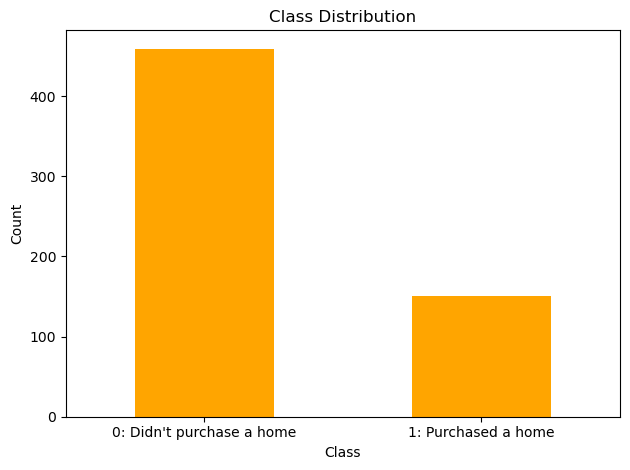

0    0.752459
1    0.247541
Name: home_ownership_class, dtype: float64

0    459
1    151
Name: home_ownership_class, dtype: int64

In [62]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()
display(df['home_ownership_class'].value_counts(normalize=True))
display(df['home_ownership_class'].value_counts())

## Runs: RobustScaler()

In [63]:
scaler = RobustScaler()

In [64]:
t03_adaboost_gs, t03_adaboost_be, t03_adaboost_model_info, t03_adaboost_metrics_df = adaboost_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.40858585858585855
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8171225960819253
Std Train Score (Precision) 0.008019795981917226
GridSearchCV Runtime: 6.702600955963135 secs
Run 1 - Random State: 0
Test Precision: 0.5185185185185185
Run 2 - Random State: 1
Test Precision: 0.41379310344827586
Run 3 - Random State: 2
Test Precision: 0.424

In [65]:
t03_dt_gs, t03_dt_be, t03_dt_model_info, t03_dt_metrics_df = dt_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 3, 'classifier__max_features': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.4370454545454545
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(max_depth=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 21.89157223701477 secs
Run 1 - Random State: 0
Test Precision: 0.41379310344827586
Run 2 - Random State: 1
Test Precision: 0.3448275862068966
Run 3 - Random State: 2
Test Precision: 0.43333333333333335
Run 4 - Random State: 3
Test Precision: 0.5714285714285714
Run 5 - Random State: 4
Test Precision: 0.37037037037037035
Ave Test Precision: 0.4267505929574895
Stdev Test Precision: 


4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1817 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

In [66]:
t03_logreg_gs, t03_logreg_be, t03_logreg_model_info, t03_logreg_metrics_df = logreg_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits


Best Hyperparameters: {'classifier__C': 0.01, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.46517857142857144
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.01, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 5.987666606903076 secs
Run 1 - Random State: 0
Test Precision: 0.38461538461538464
Run 2 - Random State: 1
Test Precision: 0.4074074074074074
Run 3 - Random State: 2
Test Precision: 0.36
Run 4 - Random State: 3
Test Precision: 0.3829787234042553
Run 5 - Random State: 4
Test Precision: 0.44680851063829785
Ave Test Precision: 0.39636200521306897
Stdev Test Precision: 0.03281059878228247
Ave Test Accuracy: 0.7032679738562091
Stdev Test Accuracy: 0.01704366641883045
Ave Test Specifi


650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

In [67]:
t03_knn_gs, t03_knn_be, t03_knn_model_info, t03_knn_metrics_df = knn_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'hamming', 'classifier__n_neighbors': 2, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.725
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='hamming', n_neighbors=2))])
Mean Train Score (Precision) 0.5220652835145432
Std Train Score (Precision) 0.018003507069733395
GridSearchCV Runtime: 13.93297553062439 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.5
Run 3 - Random State: 2
Test Precision: 0.3076923076923077
Run 4 - Random State: 3
Test Precision: 0.6666666666666666
Run 5 - Random State: 4
Test Precision: 0.6666666666666666
Ave Test Precision: 0.46820512820512816
Stdev Test Precision: 0.21064379572752903
Ave Test Accuracy: 0.7450980392156863
Stdev Test Accuracy: 0.019055398349167637
Ave Test Specificity: 0.9669565217391305
Ave 

In [68]:
t03_svm_gs, t03_svm_be, t03_svm_model_info, t03_svm_metrics_df = svm_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 100.0, 'classifier__kernel': 'rbf', 'classifier__probability': True, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3889870733131603
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 SVC(C=100.0, max_iter=1000, probability=True, random_state=0,
                     verbose=True))])
Mean Train Score (Precision) 0.22365077682732604
Std Train Score (Precision) 0.04075542132319817
GridSearchCV Runtime: 20.266602039337158 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.39285714285714285
[LibSVM]

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


Run 2 - Random State: 1
Test Precision: 0.28
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.35526315789473684
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.3898305084745763
[LibSVM]

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


Run 5 - Random State: 4
Test Precision: 0.4339622641509434
Ave Test Precision: 0.3703826146754799
Stdev Test Precision: 0.05771332564181588
Ave Test Accuracy: 0.6235294117647059
Stdev Test Accuracy: 0.09590264475568458
Ave Test Specificity: 0.6156521739130435
Ave Test Recall: 0.6473684210526315
Ave Test NPV: 0.8387881380332969
Ave Test F1-Score: 0.4654575455953573
Ave Test G-mean: 0.6231444286246806
Ave Runtime: 0.08519043922424316


In [69]:
t03_catboost_gs, t03_catboost_be, t03_catboost_model_info, t03_catboost_metrics_df = catboost_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.008782
0:	learn: 0.6902713	total: 2.6ms	remaining: 2.6s
1:	learn: 0.6874306	total: 4.51ms	remaining: 2.25s
2:	learn: 0.6851637	total: 6.57ms	remaining: 2.18s
3:	learn: 0.6828852	total: 8.7ms	remaining: 2.17s
4:	learn: 0.6798275	total: 10.8ms	remaining: 2.15s
5:	learn: 0.6774618	total: 12.5ms	remaining: 2.07s
6:	learn: 0.6748184	total: 14.2ms	remaining: 2.02s
7:	learn: 0.6723569	total: 16.4ms	remaining: 2.03s
8:	learn: 0.6701881	total: 18.3ms	remaining: 2.01s
9:	learn: 0.6676473	total: 19.8ms	remaining: 1.96s
10:	learn: 0.6652604	total: 21.5ms	remaining: 1.94s
11:	learn: 0.6626155	total: 23.1ms	remaining: 1.9s
12:	learn: 0.6609395	total: 24.9ms	remaining: 1.89s
13:	learn: 0.6588495	total: 26.4ms	remaining: 1.86s
14:	learn: 0.6566674	total: 28ms	remaining: 1.84s
15:	learn: 0.6549681	total: 29.4ms	remaining: 1.81s
16:	learn: 0.6527303	total: 31.3ms	remaining: 1.81s
17:	learn: 0.6509458	total: 32.9ms	remain

In [70]:
t03_lgbm_gs, t03_lgbm_be, t03_lgbm_model_info, t03_lgbm_metrics_df = lgbm_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 344, number of negative: 344
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 498
[LightGBM] [Info] Number of data points in the train set: 688, number of used features: 7
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with pos

In [71]:
t03_gbm_gs, t03_gbm_be, t03_gbm_model_info, t03_gbm_metrics_df = gbm_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.4091697191697192
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.7140890053364348
Std Train Score (Precision) 0.017678765552223252
GridSearchCV Runtime: 23.97681951522827 secs
Run 1 - Random State: 0
Test Precision: 0.38636363636363635
Run 2 - Random State: 1
Test Precision: 0.2972972972972973
Run 3 - Random State: 2
Test Precision: 0.359375
Run 4 - Random State: 3
Test Precision: 0.40540540540540543
Run 5 - Random 

In [72]:
t03_rf_gs, t03_rf_be, t03_rf_model_info, t03_rf_metrics_df = rf_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.40200216450216447
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=2, n_estimators=200,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.44016916532244843
Std Train Score (Precision) 0.01663218382565025
GridSearchCV Runtime: 175.14791345596313 secs
Run 1 - Random State: 0
Test Precision: 0.3673469387755102
Run 2 - Random State: 1
Test Precision: 0.3076923076923077
Run 3 - Random State: 2
Test Precision: 0.31

In [73]:
t03_xgb_gs, t03_xgb_be, t03_xgb_model_info, t03_xgb_metrics_df = xgb_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits


KeyboardInterrupt: 

## Results

In [74]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm',
            #   'xgb',
              'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM',
        # 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't03_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t03_model_summ)
t03_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t03_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
0,k-Nearest Neighbors,0.468205,0.210644,0.725000,0.522065,0.018004,0.745098,0.019055,0.966957,0.073684,0.759551,0.123823,0.259635
7,AdaBoost,0.458811,0.047269,0.408586,0.817123,0.008020,0.734641,0.018830,0.864348,0.342105,0.799078,0.390002,0.542815
3,Decision Tree,0.426751,0.088081,0.437045,NaN,NaN,0.721569,0.027185,0.867826,0.278947,0.784643,0.330891,0.489531
8,CatBoost,0.401996,0.057026,0.411504,0.732612,0.020878,0.698039,0.031819,0.789565,0.421053,0.805098,0.409046,0.574995
2,Logistic Regression,0.396362,0.032811,0.465179,NaN,NaN,0.703268,0.017044,0.806957,0.389474,0.801668,0.386287,0.551757
6,LightGBM,0.378473,0.062877,0.406553,0.537300,0.019082,0.675817,0.042509,0.744348,0.468421,0.809847,0.415783,0.586239
4,Random Forest,0.377240,0.082235,0.402002,0.440169,0.016632,0.682353,0.046584,0.758261,0.452632,0.808665,0.410433,0.580868
1,SVM Classifier,0.370383,0.057713,0.388987,0.223651,0.040755,0.623529,0.095903,0.615652,0.647368,0.838788,0.465458,0.623144
5,Gradient Boosting Machine (GBM),0.368758,0.043459,0.409170,0.714089,0.017679,0.674510,0.029737,0.753043,0.436842,0.803371,0.395740,0.567178


In [75]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t03_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.745098,k-Nearest Neighbors
Highest Test G-mean,0.623144,SVM Classifier
Highest Test Recall,0.647368,SVM Classifier
Highest Test Precision,0.468205,k-Nearest Neighbors
Highest Test Specificity,0.966957,k-Nearest Neighbors
Highest Test F1-score,0.465458,SVM Classifier


# HO_T04: Cluster 0; Yes - 1

In [ ]:
t04 = dataset.copy().drop(columns=cols_with_nulls)
# t04 = t04[t04['positiveMonthlyFamilyNetIncome'] != 0]
# t04_num = t04.drop(columns=['gender', 'province', 'job'])
t04 = pd.get_dummies(t04, columns=['gender'], prefix='gender', drop_first='True')
t04 = pd.get_dummies(t04, columns=['province'], prefix='province', drop_first='True')
t04 = pd.get_dummies(t04, columns=['job'], prefix='job', drop_first='True')

t04.loc[t04['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000
t04 = t04.copy().loc[:, ['userId', 'lastFirstName', 'basicMonthlySalary', 'monthlyFamilyIncome',
                         'internet', 'allowance', 'otherEducation', 'daysFromDateEntryStart',
                         'monthlyFamilyNetIncome', 'home_ownership_class']]

# t04.isna().sum()[t04.isna().sum() > 0]
df = t04

## EDA on Dataset

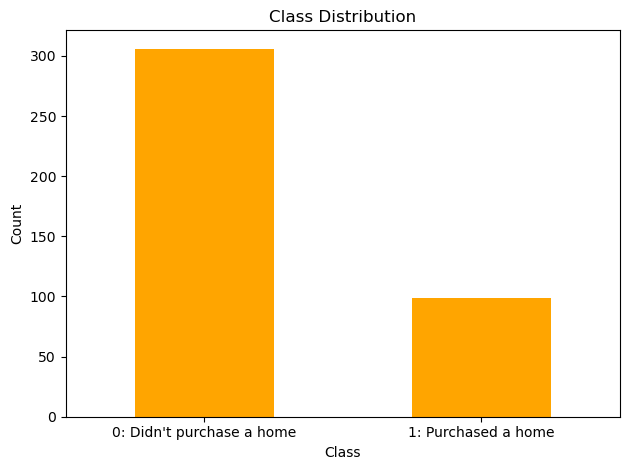

0    0.755556
1    0.244444
Name: home_ownership_class, dtype: float64

0    306
1     99
Name: home_ownership_class, dtype: int64

In [ ]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()
display(df['home_ownership_class'].value_counts(normalize=True))
display(df['home_ownership_class'].value_counts())

## Runs: RobustScaler()

In [ ]:
scaler = RobustScaler()

In [ ]:
t04_adaboost_gs, t04_adaboost_be, t04_adaboost_model_info, t04_adaboost_metrics_df = adaboost_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.3635858585858585
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8252876327640234
Std Train Score (Precision) 0.012767014120596842
GridSearchCV Runtime: 15.018794775009155 secs
Run 1 - Random State: 0
Test Precision: 0.2558139534883721
Run 2 - Random State: 1
Test Precision: 0.42857142857142855
Run 3 - Random State: 2
Test Precision: 0.3225806451612903
Run 4 - Random State: 3
Test Precision: 0.21621621621621623
Run 5 - Rando

In [ ]:
t04_dt_gs, t04_dt_be, t04_dt_model_info, t04_dt_metrics_df = dt_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1816 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__max_features': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.4438095238095238
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=3,
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 62.61732268333435 secs
Run 1 - Random State: 0
Test Precision: 0.1111111111111111
Run 2 - Random State: 1
Test Precision: 0.4444444444444444
Run 3 - Random State: 2
Test Precision: 0.2857142857142857
Run 4 - Random State: 3
Test Precision: 0.22
Run 5 - Random State: 4
Test Precision: 0.275
Ave Test Precision: 0.2672539682539683
Stdev Test Precision:

In [ ]:
t04_logreg_gs, t04_logreg_be, t04_logreg_model_info, t04_logreg_metrics_df = logreg_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 1.0, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.38528166278166276
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 LogisticRegression(max_iter=1000, random_state=0,
                                    solver='liblinear'))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 68.299635887146 secs
Run 1 - Random State: 0
Test Precision: 0.21951219512195122
Run 2 - Random State: 1
Test Precision: 0.20588235294117646
Run 3 - Random State: 2
Test Precision: 0.3125
Run 4 - Random State: 3
Test Precision: 0.3111111111111111
Run 5 - Random State: 4
Test Precision: 0.32432432432432434
Ave Test Precision: 0.27466599669971264
Stdev Test Precision: 0.05700600659105943
Ave Test Accuracy: 0.5882352941176471
Stdev Test Ac

In [ ]:
t04_knn_gs, t04_knn_be, t04_knn_model_info, t04_knn_metrics_df = knn_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'canberra', 'classifier__n_neighbors': 4, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.5416666666666666
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='canberra', n_neighbors=4))])
Mean Train Score (Precision) 0.5174267670804269
Std Train Score (Precision) 0.031240602138575775
GridSearchCV Runtime: 43.589484214782715 secs
Run 1 - Random State: 0
Test Precision: 0.16666666666666666
Run 2 - Random State: 1
Test Precision: 0.375
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.25
Run 5 - Random State: 4
Test Precision: 0.25
Ave Test Precision: 0.275
Stdev Test Precision: 0.08122328620674137
Ave Test Accuracy: 0.7215686274509805
Stdev Test Accuracy: 0.01640509855949171
Ave Test Specificity: 0.9272727272727274
Ave Test Recall

In [ ]:
t04_svm_gs, t04_svm_be, t04_svm_model_info, t04_svm_metrics_df = svm_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1000.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.49523809523809514
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 SVC(C=1000.0, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.36727146596102206
Std Train Score (Precision) 0.0818065879321001
GridSearchCV Runtime: 45.08928179740906 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.42857142857142855
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.16666666666666666
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.24242424242424243


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


[LibSVM]Run 4 - Random State: 3
Test Precision: 0.25
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.2391304347826087
Ave Test Precision: 0.26535855448898926
Stdev Test Precision: 0.09724751040179738
Ave Test Accuracy: 0.4568627450980392
Stdev Test Accuracy: 0.2502017640266151
Ave Test Specificity: 0.4129870129870129
Ave Test Recall: 0.592
Ave Test NPV: 0.7436842105263158
Ave Test F1-Score: 0.2823750988340431
Ave Test G-mean: 0.24422324979249113
Ave Runtime: 0.035903310775756835


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [ ]:
t04_catboost_gs, t04_catboost_be, t04_catboost_model_info, t04_catboost_metrics_df = catboost_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.007415
0:	learn: 0.6897089	total: 7.34ms	remaining: 7.33s
1:	learn: 0.6877796	total: 14.9ms	remaining: 7.44s
2:	learn: 0.6852018	total: 22.3ms	remaining: 7.4s
3:	learn: 0.6818668	total: 29.3ms	remaining: 7.3s
4:	learn: 0.6787323	total: 34.9ms	remaining: 6.95s
5:	learn: 0.6760782	total: 40.5ms	remaining: 6.7s
6:	learn: 0.6732221	total: 45.9ms	remaining: 6.51s
7:	learn: 0.6706526	total: 51.9ms	remaining: 6.44s
8:	learn: 0.6673001	total: 58ms	remaining: 6.38s
9:	learn: 0.6641483	total: 63.4ms	remaining: 6.28s
10:	learn: 0.6608120	total: 69.1ms	remaining: 6.21s
11:	learn: 0.6578020	total: 75.6ms	remaining: 6.22s
12:	learn: 0.6551684	total: 81ms	remaining: 6.15s
13:	learn: 0.6517649	total: 86.4ms	remaining: 6.08s
14:	learn: 0.6483392	total: 91.9ms	remaining: 6.04s
15:	learn: 0.6457402	total: 96.7ms	remaining: 5.95s
16:	learn: 0.6437614	total: 102ms	remaining: 5.88s
17:	learn: 0.6415516	total: 107ms	remaining: 5.83s
18:	learn: 0.6395918	total: 112ms	remaining: 5.76s
19

In [ ]:
t04_lgbm_gs, t04_lgbm_be, t04_lgbm_model_info, t04_lgbm_metrics_df = lgbm_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Info] Number of positive: 234, number of negative: 229
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3154
[LightGBM] [Info] Number of data points in the train set: 463, number of used features: 60
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.505400 -> initscore=0.021599
[LightGBM] [Info] Start training from score 0.021599
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [ ]:
t04_gbm_gs, t04_gbm_be, t04_gbm_model_info, t04_gbm_metrics_df = gbm_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.3983333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8188035906690934
Std Train Score (Precision) 0.014539853179577561
GridSearchCV Runtime: 139.78312921524048 secs
Run 1 - Random State: 0
Test Precision: 0.29411764705882354
Run 2 - Random State: 1
Test Precision: 0.30434782608695654
Run 3 - Random State: 2
Test Precision: 0.35
Run 4 - Random State: 3
Test Precision: 0.25
Run 5 - 

In [ ]:
t04_rf_gs, t04_rf_be, t04_rf_model_info, t04_rf_metrics_df = rf_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.39
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=3, min_samples_leaf=2,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.6119775963330525
Std Train Score (Precision) 0.047378467452196635
GridSearchCV Runtime: 456.3760030269623 secs
Run 1 - Random State: 0
Test Precision: 0.4117647058823529
Run 2 - Random State: 1
Test Precision: 0.43478260869565216
Run 3 - Random State: 2
Te

In [ ]:
t04_xgb_gs, t04_xgb_be, t04_xgb_model_info, t04_xgb_metrics_df = xgb_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits


Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.49833333333333335
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constr

## Results

In [ ]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't04_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t04_model_summ)
t04_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t04_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
4,Random Forest,0.375207,0.045052,0.390000,0.611978,0.047378,0.698039,0.027205,0.815584,0.336,0.790998,0.352041,0.521493
7,Extreme Gradient Boosting (XGBoost),0.338528,0.090804,0.498333,0.792759,0.020584,0.703922,0.032810,0.859740,0.224,0.773821,0.265656,0.431006
9,CatBoost,0.329048,0.101147,0.398333,0.839046,0.018427,0.717647,0.022356,0.901299,0.152,0.766401,0.200876,0.357092
8,AdaBoost,0.302701,0.080731,0.363586,0.825288,0.012767,0.617647,0.070697,0.688312,0.400,0.777776,0.342599,0.523366
5,Gradient Boosting Machine (GBM),0.289693,0.041900,0.398333,0.818804,0.014540,0.672549,0.032956,0.815584,0.232,0.765932,0.253437,0.428216
0,k-Nearest Neighbors,0.275000,0.081223,0.541667,0.517427,0.031241,0.721569,0.016405,0.927273,0.088,0.758011,0.130787,0.276523
2,Logistic Regression,0.274666,0.057006,0.385282,NaN,NaN,0.588235,0.045459,0.644156,0.416,0.773146,0.329598,0.513470
3,Decision Tree,0.267254,0.120842,0.443810,NaN,NaN,0.607843,0.105591,0.709091,0.296,0.754122,0.264880,0.435581
1,SVM Classifier,0.265359,0.097248,0.495238,0.367271,0.081807,0.456863,0.250202,0.412987,0.592,0.743684,0.282375,0.244223
6,LightGBM,0.244921,0.034263,0.480000,0.720023,0.032579,0.682353,0.016405,0.857143,0.144,0.755160,0.180116,0.348105


In [ ]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t04_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.721569,k-Nearest Neighbors
Highest Test G-mean,0.523366,AdaBoost
Highest Test Recall,0.592000,SVM Classifier
Highest Test Precision,0.375207,Random Forest
Highest Test Specificity,0.927273,k-Nearest Neighbors
Highest Test F1-score,0.352041,Random Forest


# HO_T05: Cluster 1 - Original

In [76]:
# Loading the dataset
dataset = pd.read_csv('data/df_cluster_Cao_3.csv')
# dataset = dataset.drop('Unnamed: 0', axis=1)

# Creating 'daysFromDateEntryStart'
dataset['dateEntry'] = pd.to_datetime(dataset['dateEntry'], format='%Y-%m-%d')
dateEntryStart = pd.to_datetime('2022-03-28', format='%Y-%m-%d')
dataset['daysFromDateEntryStart'] = (dataset['dateEntry'] - dateEntryStart).dt.days

# Dropping irrelevant columns
cols_to_drop = [
    'id', 'fullName', 'firstName', 'lastName', 'address', 'occupation', 'dateEntry'
]
dataset = dataset.drop(cols_to_drop, axis=1)

boolean_columns = [col for col in dataset.columns if dataset[col].dtype == bool]
dataset[boolean_columns] = dataset[boolean_columns].apply(lambda x: x.astype('int'))

columns_to_move = ['lastFirstName', 'age', 'gender', 'province', 'job']
columns_remaining = [col for col in dataset.columns if col not in columns_to_move]

new_column_order = columns_to_move + columns_remaining
dataset = dataset[new_column_order]
dataset.insert(0, 'userId', dataset.pop('userId'))

def map_ageing_class(row):
    found_in_hdmf = row['foundInHDMF']
    home_ownership_class = row['home_ownership_class']

    if home_ownership_class == 0:
        return np.nan
    elif found_in_hdmf in [' Current', 'FP', '01 mos', '02 mos', '03 mos']:
        return 0
    elif found_in_hdmf in ['04 mos', '05 mos']:
        return 1

# One-hot encoding of categorical columns
# dataset = pd.get_dummies(dataset, columns=['gender'], prefix='gender', drop_first='True')
# dataset = pd.get_dummies(dataset, columns=['province'], prefix='province')
# dataset = pd.get_dummies(dataset, columns=['job'], prefix='job')

dataset['home_ownership_class'] = ((dataset['foundInOS'] != 'False') |
                                   (dataset['foundInHDMF'] != 'False')).astype('int')

# dataset['ageing_class'] = dataset['home_ownership_class'].astype('int64')
# dataset['ageing_class'] = dataset.apply(map_ageing_class, axis=1)

cols_to_drop = ['foundInOS', 'foundInHDMF']
dataset = dataset.drop(cols_to_drop, axis=1)

# Selecting only Cluster 1 from the dataset
dataset = dataset[dataset['cluster'] == 1].drop(columns=['cluster'])
dataset

,userId,lastFirstName,age,gender,province,job,Unnamed: 0,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,daysFromDateEntryStart,home_ownership_class
2,1105,"TEMILLOSO, DENNIS",40,MALE,METRO MANILA,SERVICE AND SALES,2,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,166,0
4,2081,"LEGASPI, MANNY",39,MALE,METRO MANILA,CLERICAL SUPPORT,4,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,0
6,3382,"GARDON, JOSEFINO",39,MALE,METRO MANILA,SERVICE AND SALES,6,17342,2,3,6,28182.0,6000,1000,500,100,0,1000,1000,500,500,0,500,500,200,2000,0,0,0,500,500,100,500,150,0,0,0,0,0,1500,0,0,0,0,0,500,0,0,1,0,1,0,0,0,1,0,1,0,0,1,0,193,0
7,3511,"SALUBRE, EDDIE",52,MALE,UNKNOWN,SERVICE AND SALES,7,28684,2,2,6,36000.0,6000,1800,1000,0,0,2000,500,500,0,200,0,200,500,1000,3000,0,0,0,0,70,200,500,0,0,0,0,0,400,500,0,0,0,0,7000,0,1,1,0,1,0,1,0,0,1,0,1,0,1,0,36,0
9,4090,"MILLARES, LEONORA",42,FEMALE,ISABELA,SERVICE AND SALES,9,40000,3,2,4,43000.0,5000,1500,1000,500,0,0,1500,3500,1000,0,1500,500,300,500,2600,0,0,1500,1000,200,1000,100,1200,0,0,0,0,0,0,0,0,0,0,12000,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,199,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1061,12845,"BANAL, JOYCE",33,FEMALE,METRO MANILA,CLERICAL SUPPORT,1061,57000,3,2,2,50000.0,7000,2000,2500,500,2000,2000,0,0,0,0,2000,2000,500,1000,6500,0,0,2000,1000,500,1000,300,300,0,0,0,0,0,0,0,0,0,0,6000,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,232,0
1063,12848,"BUGARIN, JUN JUN",31,MALE,BULACAN,SERVICE AND SALES,1063,46000,1,0,0,80000.0,1500,1000,1000,500,0,1000,1500,1000,450,500,500,500,300,450,0,0,0,500,0,400,500,0,1500,0,0,0,0,0,250,0,0,0,0,5000,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,232,0
1064,12849,"FERERR, JHENNYLYN",29,FEMALE,METRO MANILA,ASSOCIATE PROFESSIONAL,1064,25000,3,2,4,40000.0,4000,1500,1000,0,100,600,0,0,200,300,1500,0,500,1500,0,0,0,500,500,0,0,0,1299,0,0,0,0,0,0,0,0,0,0,1200,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,232,0
1068,12854,"BURGOS, LIEZEL",48,FEMALE,ILOILO,SERVICE AND SALES,1068,51000,2,0,5,51000.0,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,300,800,0,0,0,500,500,300,500,300,800,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,232,0


In [77]:
df = dataset.copy()

df['monthlyUtilityBills'] = (
    df['water'] + df['electricity'] + df['rent'] +
    df['internet'] + df['mobileLoad']
)
df['monthlyVices'] = (
    df['smoking'] + df['alcohol'] + df['gambling'] +
    df['smallLottery'] + df['otherVices']
)
df['monthlyExpenses'] = (
    df['food'] + df['hygiene'] + df['houseCleaning'] +
    df['fare'] + df['parking'] + df['gasoline'] +
    df['tuition'] + df['allowance'] + df['uniform'] +
    df['otherEducation'] + df['emergency'] + df['medicine'] +
    df['repair'] + df['cinema'] + df['dineOut'] +
    df['leisure'] + df['personalCare'] + df['clothing'] +
    df['vehicleLoan'] + df['monthlyUtilityBills'] +
    df['informalLenders'] + df['companyLoan'] + df['privateLoans'] +
    df['governmentLoans'] + df['monthlyVices']
)
df['monthlySoloNetIncome'] = (
    df['basicMonthlySalary'] - df['monthlyExpenses']
)
df['positiveMonthlySoloNetIncome'] = (
    df['monthlySoloNetIncome'] > 0
).astype(int)
df['monthlyFamilyNetIncome'] = (
    df['monthlyFamilyIncome'] - df['monthlyExpenses']
)
df['positiveMonthlyFamilyNetIncome'] = (
    df['monthlyFamilyNetIncome'] > 0
).astype(int)
df['monthlySoloNetIncomeWithSavings'] = (
    df['basicMonthlySalary'] + df['savings'] - df['monthlyExpenses']
)
df['positiveMonthlySoloNetIncomeWithSavings'] = (
    df['monthlySoloNetIncomeWithSavings'] > 0
).astype(int)
df['monthlyFamilyNetIncomeWithSavings'] = (
    df['monthlyFamilyIncome'] + df['savings'] - df['monthlyExpenses']
)
df['positiveMonthlyFamilyNetIncomeWithSavings'] = (
    df['monthlyFamilyNetIncomeWithSavings'] > 0
).astype(int)
df['monthlyFamilyIncome - basicMonthlySalary'] = (
    df['monthlyFamilyIncome'] - df['basicMonthlySalary']
)
df['positive monthlyFamilyIncome - basicMonthlySalary'] = (
    df['monthlyFamilyIncome - basicMonthlySalary'] > 0
).astype(int)
df['basicMonthlySalary - monthlyExpenses'] = (
    df['basicMonthlySalary'] - df['monthlyExpenses']
)
df['positive basicMonthlySalary - monthlyExpenses'] = (
    df['basicMonthlySalary - monthlyExpenses'] > 0
).astype(int)
df['monthlyFamilyIncome - monthlyExpenses'] = (
    df['monthlyFamilyIncome'] - df['monthlyExpenses']
)
df['positive monthlyFamilyIncome - monthlyExpenses'] = (
    df['monthlyFamilyIncome - monthlyExpenses'] > 0
).astype(int)
df['basicMonthlySalary / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['monthlyFamilyIncome']
)
df['monthlyExpenses / basicMonthlySalary'] = np.where(
    df['basicMonthlySalary'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['basicMonthlySalary']
)
df['monthlyExpenses / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['monthlyFamilyIncome']
)
df['monthlyVices / basicMonthlySalary'] = np.where(
    df['basicMonthlySalary'] == 0,
    np.nan,
    df['monthlyVices'] / df['basicMonthlySalary']
)
df['monthlyVices / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['monthlyVices'] / df['monthlyFamilyIncome']
)
df['basicMonthlySalary / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['workingFamilyCount']
)
df['basicMonthlySalary / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['residentsCount']
)
df['monthlyFamilyIncome / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyFamilyIncome'] / df['workingFamilyCount']
)
df['monthlyFamilyIncome / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyFamilyIncome'] / df['residentsCount']
)
df['monthlyExpenses / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['workingFamilyCount']
)
df['monthlyExpenses / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['residentsCount']
)
df['monthlyUtilityBills / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyUtilityBills'] / df['workingFamilyCount']
)
df['monthlyUtilityBills / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyUtilityBills'] / df['residentsCount']
)
dataset = df.copy()

# Convert all int32 columns to int64
for col in dataset.select_dtypes(include='int32').columns:
    dataset[col] = dataset[col].astype('int64')

dataset['userId'] = dataset['userId'].astype(str)
dataset

,userId,lastFirstName,age,gender,province,job,Unnamed: 0,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,daysFromDateEntryStart,home_ownership_class,monthlyUtilityBills,monthlyVices,monthlyExpenses,monthlySoloNetIncome,positiveMonthlySoloNetIncome,monthlyFamilyNetIncome,positiveMonthlyFamilyNetIncome,monthlySoloNetIncomeWithSavings,positiveMonthlySoloNetIncomeWithSavings,monthlyFamilyNetIncomeWithSavings,positiveMonthlyFamilyNetIncomeWithSavings,monthlyFamilyIncome - basicMonthlySalary,positive monthlyFamilyIncome - basicMonthlySalary,basicMonthlySalary - monthlyExpenses,positive basicMonthlySalary - monthlyExpenses,monthlyFamilyIncome - monthlyExpenses,positive monthlyFamilyIncome - monthlyExpenses,basicMonthlySalary / monthlyFamilyIncome,monthlyExpenses / basicMonthlySalary,monthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary,monthlyVices / monthlyFamilyIncome,basicMonthlySalary / workingFamilyCount,basicMonthlySalary / residentsCount,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,monthlyExpenses / workingFamilyCount,monthlyExpenses / residentsCount,monthlyUtilityBills / workingFamilyCount,monthlyUtilityBills / residentsCount
2,1105,"TEMILLOSO, DENNIS",40,MALE,METRO MANILA,SERVICE AND SALES,2,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,166,0,1100,0,7250,12750,1,22750.0,1,13750,1,23750.0,1,10000.0,1,12750,1,22750.0,1,0.666667,0.362500,0.241667,0.000000,0.000000,NaN,6666.666667,NaN,10000.000000,NaN,2416.666667,NaN,366.666667
4,2081,"LEGASPI, MANNY",39,MALE,METRO MANILA,CLERICAL SUPPORT,4,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,0,4300,0,23800,-4000,0,1200.0,1,6000,1,11200.0,1,5200.0,1,-4000,0,1200.0,1,0.792000,1.202020,0.952000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,3382,"GARDON, JOSEFINO",39,MALE,METRO MANILA,SERVICE AND SALES,6,17342,2,3,6,28182.0,6000,1000,500,100,0,1000,1000,500,500,0,500,500,200,2000,0,0,0,500,500,100,500,150,0,0,0,0,0,1500,0,0,0,0,0,500,0,0,1,0,1,0,0,0,1,0,1,0,0,1,0,193,0,2350,0,17050,292,1,11132.0,1,792,1,11632.0,1,10840.0,1,292,1,11132.0,1,0.615357,0.983162,0.604996,0.000000,0.000000,5780.666667,2890.333333,9394.000000,4697.000000,5683.333333,2841.666667,783.333333,391.666667
7,3511,"SALUBRE, EDDIE",52,MALE,UNKNOWN,SERVICE AND SALES,7,28684,2,2,6,36000.0,6000,1800,1000,0,0,2000,500,500,0,200,0,200,500,1000,3000,0,0,0,0,70,200,500,0,0,0,0,0,400,500,0,0,0,0,7000,0,1,1,0,1,0,1,0,0,1,0,1,0,1,0,36,0,5000,500,18370,10314,1,17630.0,1,17314,1,24630.0,1,7316.0,1,10314,1,17630.0,1,0.796778,0.640427,0.510278,0.017431,0.013889,14342.000000,4780.666667,18000.000000,6000.000000,9185.000000,3061.666667,2500.000000,833.333333
9,4090,"MILLARES, LEONORA",42,FEMALE,ISABELA,SERVICE AND SALES,9,40000,3,2,4,43000.0,5000,1500,1000,500,0,0,1500,3500,1000,0,1500,500,300,500,2600,0,0,1500,1000,200,1000,100,1200,0,0,0,0,0,0,0,0,0,0,12000,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,199,1,4700,0,24400,15600,1,18600.0,1,27600,1,30600.0,1,3000.0,1,15600,1,18600.0,1,0.930233,0.610000,0.567442,0.000000,0.000000,20000.000000,10000.000000,21500.000000,10750.000000,12200.000000,6100.000000,2350.000000,1175.000000
...,...,...,...,...,...,...,

In [78]:
t05 = dataset.copy().drop(columns=cols_with_nulls)
# t05 = t05[t05['positiveMonthlyFamilyNetIncomeWithSavings'] != 0]
# t05_num = t05.drop(columns=['gender', 'province', 'job'])
t05 = pd.get_dummies(t05, columns=['gender'], prefix='gender', drop_first='True')
t05 = pd.get_dummies(t05, columns=['province'], prefix='province', drop_first='True')
t05 = pd.get_dummies(t05, columns=['job'], prefix='job', drop_first='True')

# t05.loc[t05['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000
t05 = t05.copy().loc[:, ['userId', 'lastFirstName', 'basicMonthlySalary', 'monthlyFamilyIncome',
                         'internet', 'food', 'dineOut', 'informalLenders', 'savings', 'mobileLoad',
                         'monthlyVices',
                         'monthlyFamilyNetIncome', 'home_ownership_class']]

# t05.isna().sum()[t05.isna().sum() > 0]
df = t05

## EDA on Dataset

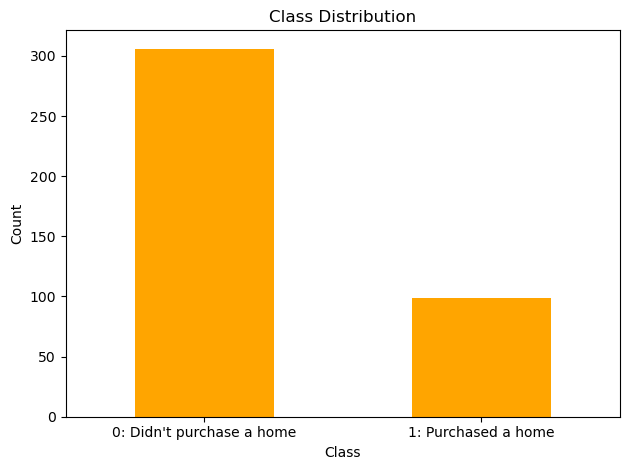

0    306
1     99
Name: home_ownership_class, dtype: int64

0    0.755556
1    0.244444
Name: home_ownership_class, dtype: float64

In [79]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

## Runs: RobustScaler()

In [80]:
scaler = RobustScaler()

In [81]:
t05_adaboost_gs, t05_adaboost_be, t05_adaboost_model_info, t05_adaboost_metrics_df = adaboost_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.30853035853035854
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8102669551467934
Std Train Score (Precision) 0.013252457197330106
GridSearchCV Runtime: 6.15156364440918 secs
Run 1 - Random State: 0
Test Precision: 0.225
Run 2 - Random State: 1
Test Precision: 0.2391304347826087
Run 3 - Random State: 2
Test Precision: 0.27586206896551724
Run 4 - Random State: 

In [82]:
t05_dt_gs, t05_dt_be, t05_dt_model_info, t05_dt_metrics_df = dt_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.4
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, max_features='sqrt',
                                        min_samples_leaf=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 22.162168502807617 secs
Run 1 - Random State: 0
Test Precision: 0.5833333333333334
Run 2 - Random State: 1
Test Precision: 0.2727272727272727
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 3
Test Precision: 0.25
Run 5 - Random State: 4
Test Precision: 0.3181818181818182
Ave Test Precision: 0.33484848484848484
Stdev Test Precision: 0.14166869225581535
Ave Test


4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2208 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

In [83]:
t05_logreg_gs, t05_logreg_be, t05_logreg_model_info, t05_logreg_metrics_df = logreg_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits


Best Hyperparameters: {'classifier__C': 0.0001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.4223593073593074
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.0001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 8.162250757217407 secs
Run 1 - Random State: 0
Test Precision: 0.45454545454545453
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.4
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.45161290322580644
Ave Test Precision: 0.3678983382209189
Stdev Test Precision: 0.10598462080712294
Ave Test Accuracy: 0.7
Stdev Test Accuracy: 0.03958162595722817
Ave Test Specificity: 0.81558


650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

In [84]:
t05_knn_gs, t05_knn_be, t05_knn_model_info, t05_knn_metrics_df = knn_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits
Best Hyperparameters: {'classifier__metric': 'hamming', 'classifier__n_neighbors': 6, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.5324675324675324
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='hamming', n_neighbors=6))])
Mean Train Score (Precision) 0.5081588353926486
Std Train Score (Precision) 0.03151060197102174
GridSearchCV Runtime: 11.734879732131958 secs
Run 1 - Random State: 0
Test Precision: 0.3333333333333333
Run 2 - Random State: 1
Test Precision: 0.34615384615384615
Run 3 - Random State: 2
Test Precision: 0.28
Run 4 - Random State: 3
Test Precision: 0.2857142857142857
Run 5 - Random State: 4
Test Precision: 0.2727272727272727
Ave Test Precision: 0.3035857475857476
Stdev Test Precision: 0.03363362894004362
Ave Tes

In [85]:
t05_svm_gs, t05_svm_be, t05_svm_model_info, t05_svm_metrics_df = svm_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 0.0001, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.440925925925926
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 SVC(C=0.0001, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.36486497083566033
Std Train Score (Precision) 0.09022984679114834
GridSearchCV Runtime: 13.815762281417847 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 1.0
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.23076923076923078
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.0
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.2857142857142857
[LibSVM]Run 5 - Random State: 4
Test 

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [86]:
t05_catboost_gs, t05_catboost_be, t05_catboost_model_info, t05_catboost_metrics_df = catboost_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.004557
0:	learn: 0.6925820	total: 1.59ms	remaining: 1.59s
1:	learn: 0.6920081	total: 3ms	remaining: 1.5s
2:	learn: 0.6914371	total: 4.24ms	remaining: 1.41s
3:	learn: 0.6906168	total: 5.71ms	remaining: 1.42s
4:	learn: 0.6894153	total: 7.34ms	remaining: 1.46s
5:	learn: 0.6891500	total: 8.66ms	remaining: 1.43s
6:	learn: 0.6886292	total: 10ms	remaining: 1.42s
7:	learn: 0.6878127	total: 11.3ms	remaining: 1.4s
8:	learn: 0.6870157	total: 12.6ms	remaining: 1.39s
9:	learn: 0.6866653	total: 13.8ms	remaining: 1.37s
10:	learn: 0.6857442	total: 15.1ms	remaining: 1.36s
11:	learn: 0.6846869	total: 16.3ms	remaining: 1.34s
12:	learn: 0.6834368	total: 17.6ms	remaining: 1.34s
13:	learn: 0.6824601	total: 18.8ms	remaining: 1.33s
14:	learn: 0.6818870	total: 20.1ms	remaining: 1.32s
15:	learn: 0.6811913	total: 21.3ms	remaining: 1.31s
16:	learn: 0.6800687	total: 22.4ms	remaining: 1.29s
17:	learn: 0.6789298	total: 23.5ms	remaini

In [87]:
t05_lgbm_gs, t05_lgbm_be, t05_lgbm_model_info, t05_lgbm_metrics_df = lgbm_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 229, number of negative: 229
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 678
[LightGBM] [Info] Number of data points in the train set: 458, number of used features: 10
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with p

In [88]:
t05_gbm_gs, t05_gbm_be, t05_gbm_model_info, t05_gbm_metrics_df = gbm_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.28695526695526696
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=2,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.7691668685337417
Std Train Score (Precision) 0.02285953189740625
GridSearchCV Runtime: 22.74280834197998 secs
Run 1 - Random State: 0
Test Precision: 0.36666666666666664
Run 2 - Random State: 1
Test Precision: 0.2962962962962963
Run 3 - Random State: 2
Test Precision: 0.22727272727272727

In [89]:
t05_rf_gs, t05_rf_be, t05_rf_model_info, t05_rf_metrics_df = rf_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.3022458153301807
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=3, n_estimators=300,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.4177165900766003
Std Train Score (Precision) 0.03192935589750673
GridSearchCV Runtime: 198.27480053901672 secs
Run 1 - Random State: 0
Test Precision: 0.37777777777777777
Run 2 - Random State:

In [90]:
t05_xgb_gs, t05_xgb_be, t05_xgb_model_info, t05_xgb_metrics_df = xgb_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 3, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3196338383838384
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
         

## Results

In [91]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 
            #   'xgb', 
              'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 
        # 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't05_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t05_model_summ)
t05_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t05_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
1,SVM Classifier,0.403297,0.378036,0.440926,0.364865,0.090230,0.737255,0.032069,0.945455,0.096,0.763374,0.136828,0.253413
2,Logistic Regression,0.367898,0.105985,0.422359,NaN,NaN,0.700000,0.039582,0.815584,0.344,0.794387,0.352643,0.519213
4,Random Forest,0.336904,0.031688,0.302246,0.417717,0.031929,0.600000,0.049701,0.587013,0.640,0.834305,0.439848,0.609737
3,Decision Tree,0.334848,0.141669,0.400000,NaN,NaN,0.700000,0.046813,0.859740,0.208,0.769727,0.249581,0.412330
0,k-Nearest Neighbors,0.303586,0.033634,0.532468,0.508159,0.031511,0.684314,0.034938,0.833766,0.224,0.768554,0.245895,0.416205
8,CatBoost,0.287473,0.017929,0.283542,0.795704,0.019527,0.547059,0.023407,0.537662,0.576,0.797448,0.382695,0.553818
6,LightGBM,0.277555,0.047786,0.301881,0.542290,0.025611,0.611765,0.027381,0.690909,0.368,0.771320,0.316228,0.502209
5,Gradient Boosting Machine (GBM),0.273208,0.059505,0.286955,0.769167,0.022860,0.629412,0.036288,0.732468,0.312,0.766502,0.290232,0.473950
7,AdaBoost,0.250856,0.035999,0.308530,0.810267,0.013252,0.560784,0.049215,0.615584,0.392,0.756543,0.304193,0.488461


In [92]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t05_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.737255,SVM Classifier
Highest Test G-mean,0.609737,Random Forest
Highest Test Recall,0.640000,Random Forest
Highest Test Precision,0.403297,SVM Classifier
Highest Test Specificity,0.945455,SVM Classifier
Highest Test F1-score,0.439848,Random Forest


# HO_T06: Cluster 1; Yes - 1

In [93]:
t06 = dataset.copy().drop(columns=cols_with_nulls)
# t06 = t06[t06['positiveMonthlySoloNetIncome'] != 0]
# t06_num = t06.drop(columns=['gender', 'province', 'job'])
t06 = pd.get_dummies(t06, columns=['gender'], prefix='gender', drop_first='True')
t06 = pd.get_dummies(t06, columns=['province'], prefix='province', drop_first='True')
t06 = pd.get_dummies(t06, columns=['job'], prefix='job', drop_first='True')

t06.loc[t06['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000
t06 = t06.copy().loc[:, ['userId', 'lastFirstName', 'basicMonthlySalary', 'monthlyFamilyIncome',
                         'internet', 'food', 'dineOut', 'informalLenders', 'savings', 'mobileLoad',
                         'monthlyVices',
                         'monthlyFamilyNetIncome', 'home_ownership_class']]

# t06.isna().sum()[t06.isna().sum() > 0]
df = t06

## EDA on Dataset

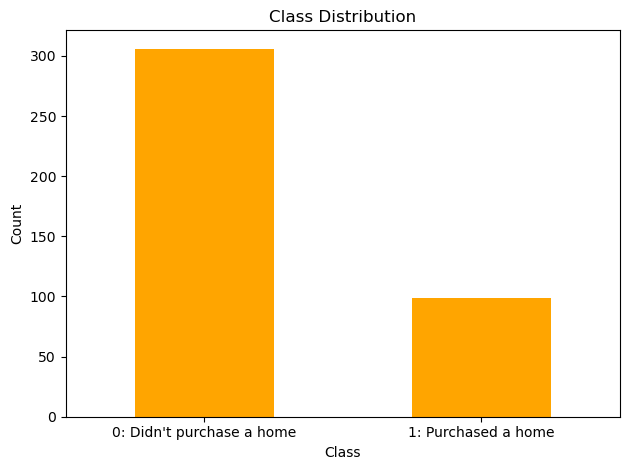

0    306
1     99
Name: home_ownership_class, dtype: int64

0    0.755556
1    0.244444
Name: home_ownership_class, dtype: float64

In [94]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

## Runs: RobustScaler()

In [95]:
scaler = RobustScaler()

In [96]:
t06_adaboost_gs, t06_adaboost_be, t06_adaboost_model_info, t06_adaboost_metrics_df = adaboost_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.27283882783882785
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8102418193382072
Std Train Score (Precision) 0.01508744680776539
GridSearchCV Runtime: 5.410043478012085 secs
Run 1 - Random State: 0
Test Precision: 0.3333333333333333
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.23529411764705882

In [97]:
t06_dt_gs, t06_dt_be, t06_dt_model_info, t06_dt_metrics_df = dt_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 5, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.41666666666666663
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=5,
                                        max_features='sqrt', random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 26.81226110458374 secs
Run 1 - Random State: 0
Test Precision: 0.6666666666666666
Run 2 - Random State: 1
Test Precision: 0.23076923076923078
Run 3 - Random State: 2
Test Precision: 0.08333333333333333
Run 4 - Random State: 3
Test Precision: 0.16666666666666666
Run 5 - Random State: 4
Test Pre


4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2171 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

In [98]:
t06_logreg_gs, t06_logreg_be, t06_logreg_model_info, t06_logreg_metrics_df = logreg_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits
Best Hyperparameters: {'classifier__C': 0.0001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.4223593073593074
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.0001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 10.265551328659058 secs
Run 1 - Random State: 0
Test Precision: 0.45454545454545453
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.4
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.45161290322580644
Ave Test Precision: 0.3678983382209189
Stdev Test Precision: 0.10598462080712294
Ave Test Accuracy: 0.7
Stde


650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

In [99]:
t06_knn_gs, t06_knn_be, t06_knn_model_info, t06_knn_metrics_df = knn_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits
Best Hyperparameters: {'classifier__metric': 'hamming', 'classifier__n_neighbors': 6, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.48484848484848486
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='hamming', n_neighbors=6))])
Mean Train Score (Precision) 0.5083808641421957
Std Train Score (Precision) 0.031985369327364635
GridSearchCV Runtime: 19.990737676620483 secs
Run 1 - Random State: 0
Test Precision: 0.3333333333333333
Run 2 - Random State: 1
Test Precision: 0.34615384615384615
Run 3 - Random State: 2
Test Precision: 0.28
Run 4 - Random State: 3
Test Precision: 0.2857142857142857
Run 5 - Random State: 4
Test Precision: 0.3181818181818182
Ave Test Precision: 0.3126766566766567
Stdev Test Precision: 0.029036445411175258
Ave 

In [100]:
t06_svm_gs, t06_svm_be, t06_svm_model_info, t06_svm_metrics_df = svm_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 0.001, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.38939792008757523
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 SVC(C=0.001, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.3655521366549431
Std Train Score (Precision) 0.08973116286261497
GridSearchCV Runtime: 15.087968111038208 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.2376237623762376
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.4642857142857143
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.23711340206185566
[LibSVM]

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


Run 4 - Random State: 3
Test Precision: 0.4
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.23
Ave Test Precision: 0.3138045757447615
Stdev Test Precision: 0.1104337851171834
Ave Test Accuracy: 0.43921568627450985
Stdev Test Accuracy: 0.27498208672564894
Ave Test Specificity: 0.36103896103896105
Ave Test Recall: 0.6799999999999999
Ave Test NPV: 0.4401448871551964
Ave Test F1-Score: 0.34998018646988643
Ave Test G-mean: 0.22273498056300575
Ave Runtime: 0.04025974273681641


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [101]:
t06_catboost_gs, t06_catboost_be, t06_catboost_model_info, t06_catboost_metrics_df = catboost_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.004557
0:	learn: 0.6925820	total: 1.74ms	remaining: 1.74s
1:	learn: 0.6919104	total: 3.22ms	remaining: 1.6s
2:	learn: 0.6911678	total: 4.44ms	remaining: 1.48s
3:	learn: 0.6902613	total: 5.56ms	remaining: 1.39s
4:	learn: 0.6889915	total: 6.65ms	remaining: 1.32s
5:	learn: 0.6887267	total: 7.84ms	remaining: 1.3s
6:	learn: 0.6882045	total: 8.94ms	remaining: 1.27s
7:	learn: 0.6873891	total: 10.3ms	remaining: 1.27s
8:	learn: 0.6865928	total: 11.6ms	remaining: 1.28s
9:	learn: 0.6854971	total: 12.9ms	remaining: 1.27s
10:	learn: 0.6845712	total: 14ms	remaining: 1.26s
11:	learn: 0.6835188	total: 15.1ms	remaining: 1.24s
12:	learn: 0.6822718	total: 16.2ms	remaining: 1.23s
13:	learn: 0.6816388	total: 17.5ms	remaining: 1.23s
14:	learn: 0.6810665	total: 18.8ms	remaining: 1.23s
15:	learn: 0.6803722	total: 20.1ms	remaining: 1.24s
16:	learn: 0.6782830	total: 21.5ms	remaining: 1.24s
17:	learn: 0.6771479	total: 22.7ms	remaining: 1.24s
18:	learn: 0.6763183	total: 23.9ms	remaining: 1.

In [102]:
t06_lgbm_gs, t06_lgbm_be, t06_lgbm_model_info, t06_lgbm_metrics_df = lgbm_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Info] Number of positive: 74, number of negative: 113
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 227
[LightGBM] [Info] Number of data points in the train set: 187, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.395722 -> initscore=-0.423323
[LightGBM] [Info] Start training from score -0.423323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

In [103]:
t06_gbm_gs, t06_gbm_be, t06_gbm_model_info, t06_gbm_metrics_df = gbm_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3282042957042957
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=2,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.7692965696222966
Std Train Score (Precision) 0.024022196728739953
GridSearchCV Runtime: 23.4899685382843 secs
Run 1 - Random State: 0
Test Precision: 0.34375
Run 2 - Random State: 1
Test Precision: 0.3076923076923077
Run 3 - Random State: 2
Test Precision: 0.23809523809523808
Run 4 - Random State: 3
Test Precision: 0.19230769230769232
Run 5 - Random 

In [104]:
t06_rf_gs, t06_rf_be, t06_rf_model_info, t06_rf_metrics_df = rf_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.3044901516612043
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=3, n_estimators=300,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.4193718083013317
Std Train Score (Precision) 0.033454739856058485
GridSearchCV Runtime: 166.14979934692383 secs
Run 1 - Random State: 0
Test Precision: 0.3695652173913043
Run 2 - Random State:

In [105]:
t06_xgb_gs, t06_xgb_be, t06_xgb_model_info, t06_xgb_metrics_df = xgb_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 3, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.3006034080298786
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importa

## Results

In [106]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm',
              'xgb',
              'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM',
        'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't06_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t06_model_summ)
t06_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t06_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
2,Logistic Regression,0.367898,0.105985,0.422359,NaN,NaN,0.700000,0.039582,0.815584,0.344,0.794387,0.352643,0.519213
4,Random Forest,0.332324,0.036280,0.304490,0.419372,0.033455,0.596078,0.050659,0.584416,0.632,0.830833,0.434059,0.604339
1,SVM Classifier,0.313805,0.110434,0.389398,0.365552,0.089731,0.439216,0.274982,0.361039,0.680,0.440145,0.349980,0.222735
0,k-Nearest Neighbors,0.312677,0.029036,0.484848,0.508381,0.031985,0.688235,0.032069,0.836364,0.232,0.771054,0.254406,0.423962
3,Decision Tree,0.302214,0.228027,0.416667,NaN,NaN,0.711765,0.044172,0.909091,0.104,0.757325,0.151350,0.295570
8,AdaBoost,0.282707,0.056454,0.272839,0.810242,0.015087,0.549020,0.066493,0.553247,0.536,0.784447,0.369482,0.543106
9,CatBoost,0.281172,0.029067,0.283835,0.796838,0.020257,0.539216,0.031768,0.529870,0.568,0.791756,0.375461,0.546066
7,Extreme Gradient Boosting (XGBoost),0.278793,0.040365,0.300603,0.714077,0.023817,0.525490,0.044713,0.503896,0.592,0.793176,0.378353,0.542971
6,LightGBM,0.262802,0.069815,0.303059,0.543779,0.026809,0.570588,0.073169,0.625974,0.400,0.760896,0.315581,0.497877
5,Gradient Boosting Machine (GBM),0.247619,0.078020,0.328204,0.769297,0.024022,0.619608,0.051131,0.732468,0.272,0.756106,0.257720,0.440133


In [107]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t06_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.711765,Decision Tree
Highest Test G-mean,0.604339,Random Forest
Highest Test Recall,0.680000,SVM Classifier
Highest Test Precision,0.367898,Logistic Regression
Highest Test Specificity,0.909091,Decision Tree
Highest Test F1-score,0.434059,Random Forest


# HO_T07: Yes - 1, 4, 30

In [162]:
t07 = dataset.copy().drop(columns=cols_with_nulls)
t07 = t07[t07['positiveMonthlyFamilyNetIncome'] != 0]
# t07_num = t07.drop(columns=['gender', 'province', 'job'])
t07 = pd.get_dummies(t07, columns=['gender'], prefix='gender', drop_first='True')
t07 = pd.get_dummies(t07, columns=['province'], prefix='province', drop_first='True')
t07 = pd.get_dummies(t07, columns=['job'], prefix='job', drop_first='True')

t07.loc[t07['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# t07.isna().sum()[t07.isna().sum() > 0]
df = t07

## EDA on Dataset

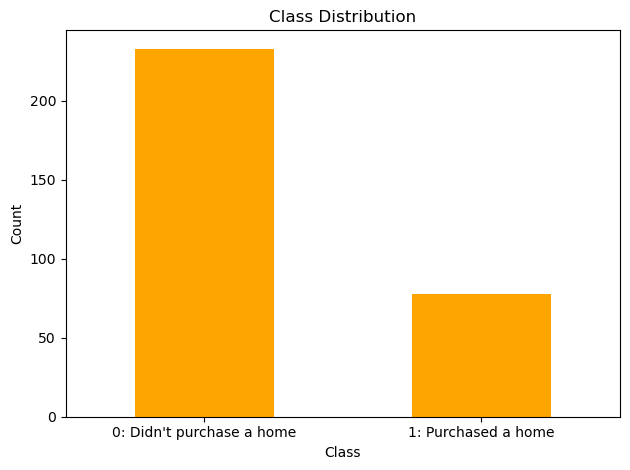

0    233
1     78
Name: home_ownership_class, dtype: int64

0    0.749196
1    0.250804
Name: home_ownership_class, dtype: float64

In [163]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

## Runs: RobustScaler()

In [164]:
scaler = RobustScaler()

In [165]:
t07_adaboost_gs, t07_adaboost_be, t07_adaboost_model_info, t07_adaboost_metrics_df = adaboost_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3466666666666667
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8299475207785825
Std Train Score (Precision) 0.011884937902997198
GridSearchCV Runtime: 7.111178159713745 secs
Run 1 - Random State: 0
Test Precision: 0.5
Run 2 - Random State: 1
Test Precision: 0.2857142857142857
Run 3 - Random State: 2
Test Precision: 0.5714285714285714
Run 4 - Random State: 3
Test Precision: 0.16666666666666666
Run 5 - Random State: 4
Test

In [166]:
t07_dt_gs, t07_dt_be, t07_dt_model_info, t07_dt_metrics_df = dt_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2134 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__max_features': None, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4440476190476191
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=2, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 122.38035869598389 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.2647058823529412
Run 3 - Random State: 2
Test Precision: 0.36363636363636365
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.23076923076923078
Ave Test Precision: 0.2518222953

In [167]:
t07_logreg_gs, t07_logreg_be, t07_logreg_model_info, t07_logreg_metrics_df = logreg_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4352380952380953
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 63.71915245056152 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.08333333333333333
Run 3 - Random State: 2
Test Precision: 0.35294117647058826
Run 4 - Random State: 3
Test Precision: 0.35294117647058826
Run 5 - Random State: 4
Test Precision: 0.2727272727272727
Ave Test Precision: 0.2623885918003565
Stdev Test Precision: 0.11036382139962794
Ave Test Accuracy: 0.6512820512820513
Stdev Test Accuracy: 0.033185074629602004
Ave Test Speci

In [168]:
t07_knn_gs, t07_knn_be, t07_knn_model_info, t07_knn_metrics_df = knn_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'chebyshev', 'classifier__n_neighbors': 4, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.41273809523809524
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='chebyshev', n_neighbors=4))])
Mean Train Score (Precision) 0.5098461362112512
Std Train Score (Precision) 0.033286255107595225
GridSearchCV Runtime: 71.43521428108215 secs
Run 1 - Random State: 0
Test Precision: 0.1111111111111111
Run 2 - Random State: 1
Test Precision: 0.2857142857142857
Run 3 - Random State: 2
Test Precision: 0.29411764705882354
Run 4 - Random State: 3
Test Precision: 0.16666666666666666
Run 5 - Random State: 4
Test Precision: 0.2857142857142857
Ave Test Precision: 0.22866479925303454
Stdev Test Precision: 0.08434453322065126
Ave Test Accuracy: 0.6205128205128205
Stdev Test Accu

In [169]:
t07_svm_gs, t07_svm_be, t07_svm_model_info, t07_svm_metrics_df = svm_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1000.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.5166666666666666
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(C=1000.0, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.3845327263321557
Std Train Score (Precision) 0.07006853464291905
GridSearchCV Runtime: 60.967138051986694 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.14285714285714285
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.3333333333333333
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.3
[LibSVM]

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


Run 4 - Random State: 3
Test Precision: 0.2727272727272727
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.2777777777777778
Ave Test Precision: 0.2653391053391053
Stdev Test Precision: 0.07251849657509753
Ave Test Accuracy: 0.6820512820512821
Stdev Test Accuracy: 0.027794209472665105
Ave Test Specificity: 0.8689655172413792
Ave Test Recall: 0.14
Ave Test NPV: 0.7457326045827202
Ave Test F1-Score: 0.17692530195076883
Ave Test G-mean: 0.33600842542160103
Ave Runtime: 0.0426640510559082


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [170]:
t07_catboost_gs, t07_catboost_be, t07_catboost_model_info, t07_catboost_metrics_df = catboost_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.00658
0:	learn: 0.6894163	total: 5.11ms	remaining: 5.1s
1:	learn: 0.6861926	total: 9.47ms	remaining: 4.72s
2:	learn: 0.6832413	total: 13.8ms	remaining: 4.59s
3:	learn: 0.6801994	total: 18ms	remaining: 4.48s
4:	learn: 0.6774379	total: 22.5ms	remaining: 4.47s
5:	learn: 0.6749080	total: 26.3ms	remaining: 4.36s
6:	learn: 0.6716108	total: 30.4ms	remaining: 4.31s
7:	learn: 0.6683448	total: 34.7ms	remaining: 4.3s
8:	learn: 0.6663988	total: 38.9ms	remaining: 4.28s
9:	learn: 0.6629464	total: 42.9ms	remaining: 4.25s
10:	learn: 0.6602426	total: 47.1ms	remaining: 4.24s
11:	learn: 0.6569635	total: 51.4ms	remaining: 4.23s
12:	learn: 0.6544203	total: 55.5ms	remaining: 4.22s
13:	learn: 0.6517635	total: 59.4ms	remaining: 4.19s
14:	learn: 0.6490322	total: 63.3ms	remaining: 4.16s
15:	learn: 0.6468080	total: 67.5ms	remaining: 4.15s
16:	learn: 0.6439848	total: 71.7ms	remaining: 4.15s
17:	learn: 0.6416128	total: 75.8ms	remai

In [171]:
t07_lgbm_gs, t07_lgbm_be, t07_lgbm_model_info, t07_lgbm_metrics_df = lgbm_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 183, number of negative: 175
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3307
[LightGBM] [Info] Number of data points in the train set: 358, number of used features: 78
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.511173 -> initscore=0.044700
[LightGBM] [Info] Start training from score 

In [172]:
t07_gbm_gs, t07_gbm_be, t07_gbm_model_info, t07_gbm_metrics_df = gbm_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.3043617167146579
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=2,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.8247414121769598
Std Train Score (Precision) 0.012013531560981608
GridSearchCV Runtime: 78.90964484214783 secs
Run 1 - Random State: 0
Test Precision: 0.26666666666666666
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.3125
Run 4 - Random State: 3
Test Precision: 0.2580645161

In [173]:
t07_rf_gs, t07_rf_be, t07_rf_model_info, t07_rf_metrics_df = rf_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4966666666666667
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=3, n_estimators=200,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.5736438438551132
Std Train Score (Precision) 0.04044292138966554
GridSearchCV Runtime: 216.09897994995117 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.42857142857142855
R

In [174]:
t07_xgb_gs, t07_xgb_be, t07_xgb_model_info, t07_xgb_metrics_df = xgb_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits


Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.37876984126984126
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, learni

## Results

In [175]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't07_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t07_model_summ)
t07_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t07_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
8,AdaBoost,0.381685,0.162368,0.346667,0.829948,0.011885,0.720513,0.027794,0.917241,0.15,0.758072,0.211033,0.358585
4,Random Forest,0.337969,0.084943,0.496667,0.573644,0.040443,0.700000,0.014618,0.865517,0.22,0.763857,0.259499,0.416471
9,CatBoost,0.313651,0.127887,0.331667,0.841790,0.015325,0.697436,0.034639,0.886207,0.15,0.751590,0.199478,0.352890
6,LightGBM,0.299435,0.082598,0.383387,0.713036,0.027010,0.656410,0.042906,0.800000,0.24,0.752928,0.264683,0.435818
5,Gradient Boosting Machine (GBM),0.276906,0.026770,0.304362,0.824741,0.012014,0.558974,0.019443,0.596552,0.45,0.759382,0.342400,0.516352
7,Extreme Gradient Boosting (XGBoost),0.273420,0.090854,0.378770,0.792572,0.017006,0.617949,0.049155,0.720690,0.32,0.756082,0.291767,0.466675
1,SVM Classifier,0.265339,0.072518,0.516667,0.384533,0.070069,0.682051,0.027794,0.868966,0.14,0.745733,0.176925,0.336008
2,Logistic Regression,0.262389,0.110364,0.435238,NaN,NaN,0.651282,0.033185,0.800000,0.22,0.749106,0.236873,0.401895
3,Decision Tree,0.251822,0.067976,0.444048,NaN,NaN,0.623077,0.063199,0.727586,0.32,0.768140,0.253316,0.412454
0,k-Nearest Neighbors,0.228665,0.084345,0.412738,0.509846,0.033286,0.620513,0.043097,0.765517,0.20,0.735030,0.212281,0.385261


In [176]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t07_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.720513,AdaBoost
Highest Test G-mean,0.516352,Gradient Boosting Machine (GBM)
Highest Test Recall,0.450000,Gradient Boosting Machine (GBM)
Highest Test Precision,0.381685,AdaBoost
Highest Test Specificity,0.917241,AdaBoost
Highest Test F1-score,0.342400,Gradient Boosting Machine (GBM)


# HO_T08: Yes - 1, 7, 30

In [177]:
t08 = dataset.copy().drop(columns=cols_with_nulls)
t08 = t08[t08['positive monthlyFamilyIncome - basicMonthlySalary'] != 0]
# t08_num = t08.drop(columns=['gender', 'province', 'job'])
t08 = pd.get_dummies(t08, columns=['gender'], prefix='gender', drop_first='True')
t08 = pd.get_dummies(t08, columns=['province'], prefix='province', drop_first='True')
t08 = pd.get_dummies(t08, columns=['job'], prefix='job', drop_first='True')

t08.loc[t08['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# t08.isna().sum()[t08.isna().sum() > 0]
df = t08

## EDA on Dataset

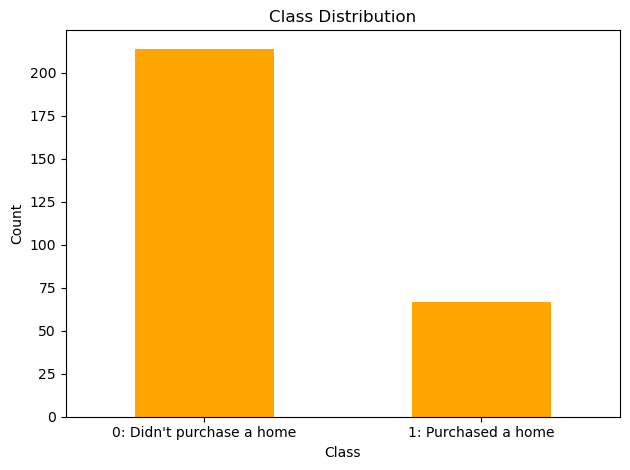

0    214
1     67
Name: home_ownership_class, dtype: int64

0    0.761566
1    0.238434
Name: home_ownership_class, dtype: float64

In [178]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

## Runs: RobustScaler()

In [179]:
scaler = RobustScaler()

In [180]:
t08_adaboost_gs, t08_adaboost_be, t08_adaboost_model_info, t08_adaboost_metrics_df = adaboost_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.315312049062049
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8152151032762983
Std Train Score (Precision) 0.014310003818687245
GridSearchCV Runtime: 8.184181451797485 secs
Run 1 - Random State: 0
Test Precision: 0.19230769230769232
Run 2 - Random State: 1
Test Precision: 0.25925925925925924
Run 3 - Random State: 2
Test Precision: 0.3
Run 4 - Random State: 3
Test Precision: 0.22857142857142856
Run

In [181]:
t08_dt_gs, t08_dt_be, t08_dt_model_info, t08_dt_metrics_df = dt_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2161 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 3, 'classifier__max_features': None, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.5333333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(max_depth=3, min_samples_leaf=3,
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 117.7270016670227 secs
Run 1 - Random State: 0
Test Precision: 0.42857142857142855
Run 2 - Random State: 1
Test Precision: 0.0
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.6
Run 5 - Random State: 4
Test Precision: 0.375
Ave Test Precision: 0.2807142857142857
Stdev Test Precision: 0.2693955819827726
Ave Test Accuracy: 0.7352112676056337
Stdev Test

In [182]:
t08_logreg_gs, t08_logreg_be, t08_logreg_model_info, t08_logreg_metrics_df = logreg_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.0001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.33476190476190476
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.0001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 60.536295890808105 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.26666666666666666
Run 3 - Random State: 2
Test Precision: 0.14285714285714285
Run 4 - Random State: 3
Test Precision: 0.42857142857142855
Run 5 - Random State: 4
Test Precision: 0.1935483870967742
Ave Test Precision: 0.24632872503840247
Stdev Test Precision: 0.11097805866105996
Ave Test Accuracy: 0.6422535211267606
Stdev Test Accuracy: 0.09106045000137811
Ave Test Specificit

In [183]:
t08_knn_gs, t08_knn_be, t08_knn_model_info, t08_knn_metrics_df = knn_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'chebyshev', 'classifier__n_neighbors': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.4733333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='chebyshev', n_neighbors=2))])
Mean Train Score (Precision) 0.500631410725864
Std Train Score (Precision) 0.04292578064706003
GridSearchCV Runtime: 54.801573753356934 secs
Run 1 - Random State: 0
Test Precision: 0.2857142857142857
Run 2 - Random State: 1
Test Precision: 0.23529411764705882
Run 3 - Random State: 2
Test Precision: 0.125
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.5714285714285714
Ave Test Precision: 0.3101540616246498
Stdev Test Precision: 0.1652914006423247
Ave Test Accuracy: 0.7014084507042253
Stdev Test Accuracy: 0.05213170

In [184]:
t08_svm_gs, t08_svm_be, t08_svm_model_info, t08_svm_metrics_df = svm_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 10.0, 'classifier__kernel': 'rbf', 'classifier__probability': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.445
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 SVC(C=10.0, max_iter=1000, probability=True, random_state=0,
                     verbose=True))])
Mean Train Score (Precision) 0.34886602508029974
Std Train Score (Precision) 0.09925690430988601
GridSearchCV Runtime: 47.181275844573975 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.14285714285714285
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.35714285714285715
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.5
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.42857142857142855
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.3636

In [185]:
t08_catboost_gs, t08_catboost_be, t08_catboost_model_info, t08_catboost_metrics_df = catboost_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.003854
0:	learn: 0.6919586	total: 2.92ms	remaining: 2.92s
1:	learn: 0.6905385	total: 6.23ms	remaining: 3.11s
2:	learn: 0.6897406	total: 8.95ms	remaining: 2.98s
3:	learn: 0.6878673	total: 11.7ms	remaining: 2.91s
4:	learn: 0.6864093	total: 14.8ms	remaining: 2.94s
5:	learn: 0.6844088	total: 17.7ms	remaining: 2.92s
6:	learn: 0.6833044	total: 20.9ms	remaining: 2.97s
7:	learn: 0.6814636	total: 24ms	remaining: 2.98s
8:	learn: 0.6797652	total: 26.8ms	remaining: 2.95s
9:	learn: 0.6783018	total: 29.6ms	remaining: 2.93s
10:	learn: 0.6769542	total: 32.8ms	remaining: 2.95s
11:	learn: 0.6754594	total: 35.9ms	remaining: 2.96s
12:	learn: 0.6742705	total: 38.9ms	remaining: 2.95s
13:	learn: 0.6725507	total: 41.5ms	remaining: 2.92s
14:	learn: 0.6713945	total: 44.3ms	remaining: 2.91s
15:	learn: 0.6697060	total: 47.2ms	remaining: 2.9s
16:	learn: 0.6682465	total: 50.4ms	remaining: 2.91s
17:	learn: 0.6671532	total: 53.2ms	remaining: 2.9s
18:	learn: 0.6658561	total: 56ms	remaining: 2.89

In [186]:
t08_lgbm_gs, t08_lgbm_be, t08_lgbm_model_info, t08_lgbm_metrics_df = lgbm_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 160, number of negative: 160
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1656
[LightGBM] [Info] Number of data points in the train set: 320, number of used features: 80
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with p

In [187]:
t08_gbm_gs, t08_gbm_be, t08_gbm_model_info, t08_gbm_metrics_df = gbm_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.44833333333333325
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8122508017532771
Std Train Score (Precision) 0.013188890264992214
GridSearchCV Runtime: 76.77233862876892 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.16666666666666666
Run 4 - Random State: 3
Test Precision: 0.625
Run 5 - R

In [188]:
t08_rf_gs, t08_rf_be, t08_rf_model_info, t08_rf_metrics_df = rf_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.3716666666666667
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=3, n_estimators=200,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.6405741185588876
Std Train Score (Precision) 0.04309086800113055
GridSearchCV Runtime: 212.4597887992859 secs
Run 1 - Random State: 0
Test Precision: 0.4
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.23529411764705882


In [189]:
t08_xgb_gs, t08_xgb_be, t08_xgb_model_info, t08_xgb_metrics_df = xgb_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits


Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.3833333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraint

## Results

In [190]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't08_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t08_model_summ)
t08_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t08_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
1,SVM Classifier,0.358442,0.133662,0.445000,0.348866,0.099257,0.723944,0.029206,0.900000,0.164706,0.774435,0.209378,0.364157
6,LightGBM,0.345103,0.126580,0.402392,0.708363,0.030628,0.690141,0.049796,0.792593,0.364706,0.799724,0.352101,0.523531
4,Random Forest,0.329837,0.080253,0.371667,0.640574,0.043091,0.673239,0.047136,0.777778,0.341176,0.790392,0.328177,0.506370
0,k-Nearest Neighbors,0.310154,0.165291,0.473333,0.500631,0.042926,0.701408,0.052132,0.866667,0.176471,0.769490,0.218231,0.378955
3,Decision Tree,0.280714,0.269396,0.533333,NaN,NaN,0.735211,0.036457,0.933333,0.105882,0.768502,0.152545,0.243324
9,CatBoost,0.278897,0.036459,0.332316,0.830662,0.019464,0.569014,0.040577,0.588889,0.505882,0.791695,0.358446,0.542380
7,Extreme Gradient Boosting (XGBoost),0.265952,0.081160,0.383333,0.782910,0.018493,0.709859,0.021360,0.896296,0.117647,0.763401,0.161894,0.320339
5,Gradient Boosting Machine (GBM),0.258333,0.236438,0.448333,0.812251,0.013189,0.723944,0.036728,0.911111,0.129412,0.769375,0.169955,0.287363
8,AdaBoost,0.253171,0.043585,0.315312,0.815215,0.014310,0.549296,0.038572,0.577778,0.458824,0.773299,0.325205,0.509810
2,Logistic Regression,0.246329,0.110978,0.334762,NaN,NaN,0.642254,0.091060,0.770370,0.235294,0.759975,0.231586,0.403137


In [191]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t08_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.735211,Decision Tree
Highest Test G-mean,0.542380,CatBoost
Highest Test Recall,0.505882,CatBoost
Highest Test Precision,0.358442,SVM Classifier
Highest Test Specificity,0.933333,Decision Tree
Highest Test F1-score,0.358446,CatBoost


# HO_T09: Yes - 20 (20k, 50k, 100k), 30

In [192]:
t09 = dataset.copy().drop(columns=cols_with_nulls)
# t09 = t09[t09['positiveMonthlyFamilyNetIncomeWithSavings'] != 0]
# t09_num = t09.drop(columns=['gender', 'province', 'job'])
t09 = pd.get_dummies(t09, columns=['gender'], prefix='gender', drop_first='True')
t09 = pd.get_dummies(t09, columns=['province'], prefix='province', drop_first='True')
t09 = pd.get_dummies(t09, columns=['job'], prefix='job', drop_first='True')

bins = [0, 20000, 50000, 100000, float('inf')]  # float('inf') represents infinity
labels = ['0-20k', '20k-50k', '50k-100k', '100k+']
t09['salary_bin'] = pd.cut(t09['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
t09['salary_bin_encoded'] = t09['salary_bin'].cat.codes
t09 = t09.drop(columns=['salary_bin'])

# t09.isna().sum()[t09.isna().sum() > 0]
df = t09

## EDA on Dataset

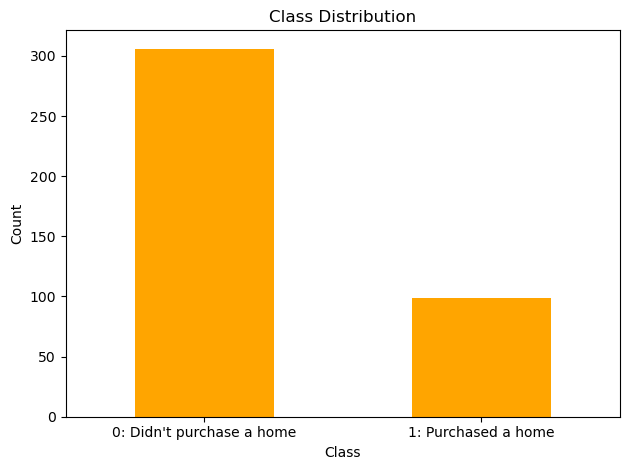

0    306
1     99
Name: home_ownership_class, dtype: int64

0    0.755556
1    0.244444
Name: home_ownership_class, dtype: float64

In [193]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

## Runs: RobustScaler()

In [194]:
scaler = RobustScaler()

In [195]:
t09_adaboost_gs, t09_adaboost_be, t09_adaboost_model_info, t09_adaboost_metrics_df = adaboost_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.454611222111222
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8228777769804173
Std Train Score (Precision) 0.011456995949662306
GridSearchCV Runtime: 9.376900434494019 secs
Run 1 - Random State: 0
Test Precision: 0.2916666666666667
Run 2 - Random State: 1
Test Precision: 0.2916666666666667
Run 3 - Random State: 2
Test Precision: 0.3076923076923077
Run 4 - Random State: 3
Test Precision: 0.25925925925925924
Run 5 - Random S

In [196]:
t09_dt_gs, t09_dt_be, t09_dt_model_info, t09_dt_metrics_df = dt_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2160 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.4852380952380952
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, max_features='sqrt',
                                        min_samples_leaf=2, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 125.65385556221008 secs
Run 1 - Random State: 0
Test Precision: 0.2631578947368421
Run 2 - Random State: 1
Test Precision: 0.30434782608695654
Run 3 - Random State: 2
Test Precision: 0.38461538461538464
Run 4 - Random State: 3
Test Precision: 0.1875
Run 5 - Random State: 4
Test Precision: 0.4074074074074074
Ave Test Precision: 0.3094057025693181
Stdev Test Precisi

In [197]:
t09_logreg_gs, t09_logreg_be, t09_logreg_model_info, t09_logreg_metrics_df = logreg_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 1e-05, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.41166666666666674
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=1e-05, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 60.46696400642395 secs
Run 1 - Random State: 0
Test Precision: 0.3888888888888889
Run 2 - Random State: 1
Test Precision: 0.2857142857142857
Run 3 - Random State: 2
Test Precision: 0.3125
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.43478260869565216
Ave Test Precision: 0.32437715665976535
Stdev Test Precision: 0.09145584860095864
Ave Test Accuracy: 0.6882352941176471
Stdev Test Accuracy: 0.03628775592808187
Ave Test Specificity: 0.8259

In [198]:
t09_knn_gs, t09_knn_be, t09_knn_model_info, t09_knn_metrics_df = knn_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'hamming', 'classifier__n_neighbors': 2, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.47000000000000003
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='hamming', n_neighbors=2))])
Mean Train Score (Precision) 0.5079120702089103
Std Train Score (Precision) 0.030438626792021937
GridSearchCV Runtime: 63.56504940986633 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.3076923076923077
Ave Test Precision: 0.16153846153846155
Stdev Test Precision: 0.14933283583320905
Ave Test Accuracy: 0.7156862745098039
Stdev Test Accuracy: 0.018341457778303642
Ave Test Specificity: 0.9272727272727271
Ave Test Recall: 0.0

In [199]:
t09_svm_gs, t09_svm_be, t09_svm_model_info, t09_svm_metrics_df = svm_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.5207142857142857
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 SVC(C=1e-06, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.3724633498384132
Std Train Score (Precision) 0.08748242781338575
GridSearchCV Runtime: 57.84999418258667 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.36363636363636365
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.3333333333333333
[LibSVM]

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


Run 3 - Random State: 2
Test Precision: 0.2857142857142857
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.3076923076923077
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.45454545454545453
Ave Test Precision: 0.348984348984349
Stdev Test Precision: 0.06578547790321111
Ave Test Accuracy: 0.7156862745098039
Stdev Test Accuracy: 0.0196078431372549
Ave Test Specificity: 0.8909090909090909
Ave Test Recall: 0.17600000000000002
Ave Test NPV: 0.7689948144326293
Ave Test F1-Score: 0.23313090418353574
Ave Test G-mean: 0.395401160149054
Ave Runtime: 0.05003986358642578


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [200]:
t09_catboost_gs, t09_catboost_be, t09_catboost_model_info, t09_catboost_metrics_df = catboost_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.007422
0:	learn: 0.6906319	total: 4.55ms	remaining: 4.54s
1:	learn: 0.6882057	total: 9.1ms	remaining: 4.54s
2:	learn: 0.6853730	total: 14.5ms	remaining: 4.82s
3:	learn: 0.6825079	total: 19.2ms	remaining: 4.77s
4:	learn: 0.6791027	total: 23.8ms	remaining: 4.73s
5:	learn: 0.6765157	total: 27.9ms	remaining: 4.62s
6:	learn: 0.6738235	total: 31.8ms	remaining: 4.51s
7:	learn: 0.6704044	total: 35.8ms	remaining: 4.44s
8:	learn: 0.6681098	total: 40.1ms	remaining: 4.42s
9:	learn: 0.6651419	total: 44.2ms	remaining: 4.37s
10:	learn: 0.6620241	total: 48.3ms	remaining: 4.34s
11:	learn: 0.6599122	total: 52.2ms	remaining: 4.3s
12:	learn: 0.6570882	total: 56ms	remaining: 4.25s
13:	learn: 0.6534182	total: 59.6ms	remaining: 4.2s
14:	learn: 0.6501215	total: 63.7ms	remaining: 4.18s
15:	learn: 0.6474970	total: 67.7ms	remaining: 4.16s
16:	learn: 0.6445032	total: 71.4ms	remaining: 4.13s
17:	learn: 0.6422094	total: 75.6ms	remai

In [201]:
t09_lgbm_gs, t09_lgbm_be, t09_lgbm_model_info, t09_lgbm_metrics_df = lgbm_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Info] Number of positive: 229, number of negative: 229
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4242
[LightGBM] [Info] Number of data points in the train set: 458, number of used features: 86
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

In [202]:
t09_gbm_gs, t09_gbm_be, t09_gbm_model_info, t09_gbm_metrics_df = gbm_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.4461904761904762
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=3,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.8177339992129138
Std Train Score (Precision) 0.01462433930847499
GridSearchCV Runtime: 94.51387214660645 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.3
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State

In [203]:
t09_rf_gs, t09_rf_be, t09_rf_model_info, t09_rf_metrics_df = rf_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.42067460317460315
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=3,
                                        min_samples_leaf=2, n_estimators=200,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.6132067520480025
Std Train Score (Precision) 0.04281284694893594
GridSearchCV Runtime: 236.42447137832642 secs
Run 1 - Random State: 0
Test Precision: 0.375
Run 2 - Random State: 1
Test Precision: 0.42857142857142855
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 

In [204]:
t09_xgb_gs, t09_xgb_be, t09_xgb_model_info, t09_xgb_metrics_df = xgb_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits


Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.5278571428571428
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constra

## Results

In [205]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't09_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t09_model_summ)
t09_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t09_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
4,Random Forest,0.361455,0.048309,0.420675,0.613207,0.042813,0.694118,0.025377,0.815584,0.320,0.787300,0.336285,0.506975
1,SVM Classifier,0.348984,0.065785,0.520714,0.372463,0.087482,0.715686,0.019608,0.890909,0.176,0.768995,0.233131,0.395401
9,CatBoost,0.335556,0.043319,0.500000,0.838330,0.016672,0.711765,0.024608,0.890909,0.160,0.765648,0.209665,0.371892
2,Logistic Regression,0.324377,0.091456,0.411667,NaN,NaN,0.688235,0.036288,0.825974,0.264,0.776136,0.287607,0.457104
3,Decision Tree,0.309406,0.089842,0.485238,NaN,NaN,0.684314,0.029737,0.825974,0.248,0.772798,0.270303,0.441011
7,Extreme Gradient Boosting (XGBoost),0.284746,0.060130,0.527857,0.790612,0.019381,0.690196,0.028245,0.859740,0.168,0.760777,0.210003,0.378359
5,Gradient Boosting Machine (GBM),0.277157,0.048578,0.446190,0.817734,0.014624,0.670588,0.030691,0.818182,0.216,0.762839,0.239507,0.414237
8,AdaBoost,0.270057,0.042939,0.454611,0.822878,0.011457,0.641176,0.022570,0.761039,0.272,0.763007,0.270877,0.453884
6,LightGBM,0.264622,0.048128,0.499524,0.725418,0.030022,0.670588,0.028245,0.825974,0.192,0.758917,0.220443,0.394438
0,k-Nearest Neighbors,0.161538,0.149333,0.470000,0.507912,0.030439,0.715686,0.018341,0.927273,0.064,0.753348,0.090590,0.183819


In [206]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t09_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.715686,k-Nearest Neighbors
Highest Test G-mean,0.506975,Random Forest
Highest Test Recall,0.320000,Random Forest
Highest Test Precision,0.361455,Random Forest
Highest Test Specificity,0.927273,k-Nearest Neighbors
Highest Test F1-score,0.336285,Random Forest


# HO_T10: Yes - 1, 20 (20k, 50k, 100k), 30

In [207]:
t10 = dataset.copy().drop(columns=cols_with_nulls)
# t10 = t10[t10['positiveMonthlySoloNetIncome'] != 0]
# t10_num = t10.drop(columns=['gender', 'province', 'job'])
t10 = pd.get_dummies(t10, columns=['gender'], prefix='gender', drop_first='True')
t10 = pd.get_dummies(t10, columns=['province'], prefix='province', drop_first='True')
t10 = pd.get_dummies(t10, columns=['job'], prefix='job', drop_first='True')

bins = [0, 20000, 50000, 100000, float('inf')]  # float('inf') represents infinity
labels = ['0-20k', '20k-50k', '50k-100k', '100k+']
t10['salary_bin'] = pd.cut(t10['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
t10['salary_bin_encoded'] = t10['salary_bin'].cat.codes
t10 = t10.drop(columns=['salary_bin'])

t10.loc[t10['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# t10.isna().sum()[t10.isna().sum() > 0]
df = t10

## EDA on Dataset

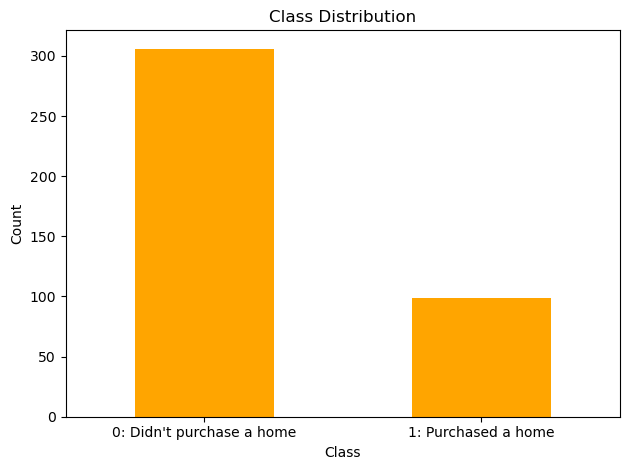

0    306
1     99
Name: home_ownership_class, dtype: int64

0    0.755556
1    0.244444
Name: home_ownership_class, dtype: float64

In [208]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

## Runs: RobustScaler()

In [209]:
scaler = RobustScaler()

In [210]:
t10_adaboost_gs, t10_adaboost_be, t10_adaboost_model_info, t10_adaboost_metrics_df = adaboost_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.44379148629148624
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8228709137997171
Std Train Score (Precision) 0.012071957908160324
GridSearchCV Runtime: 8.576135635375977 secs
Run 1 - Random State: 0
Test Precision: 0.2608695652173913
Run 2 - Random State: 1
Test Precision: 0.2916666666666667
Run 3 - Random State: 2
Test Precision: 0.3076923076923077
Run 4 - Random State: 3
Test Precision: 0.25
Run 5 - Random State: 4
Test 

In [211]:
t10_dt_gs, t10_dt_be, t10_dt_model_info, t10_dt_metrics_df = dt_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2093 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.45357142857142857
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, max_features='sqrt',
                                        min_samples_leaf=2, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 130.63144540786743 secs
Run 1 - Random State: 0
Test Precision: 0.2631578947368421
Run 2 - Random State: 1
Test Precision: 0.30434782608695654
Run 3 - Random State: 2
Test Precision: 0.38461538461538464
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.3333333333333333
Ave Test Precision: 0.2570908877545033
Stdev Test Precision

In [212]:
t10_logreg_gs, t10_logreg_be, t10_logreg_model_info, t10_logreg_metrics_df = logreg_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 1e-05, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.41166666666666674
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=1e-05, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 58.643431186676025 secs
Run 1 - Random State: 0
Test Precision: 0.3888888888888889
Run 2 - Random State: 1
Test Precision: 0.2857142857142857
Run 3 - Random State: 2
Test Precision: 0.3125
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.43478260869565216
Ave Test Precision: 0.32437715665976535
Stdev Test Precision: 0.09145584860095864
Ave Test Accuracy: 0.6882352941176471
Stdev Test Accuracy: 0.03628775592808187
Ave Test Specificity: 0.825

In [213]:
t10_knn_gs, t10_knn_be, t10_knn_model_info, t10_knn_metrics_df = knn_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits
Best Hyperparameters: {'classifier__metric': 'hamming', 'classifier__n_neighbors': 2, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.47000000000000003
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='hamming', n_neighbors=2))])
Mean Train Score (Precision) 0.5081490719479954
Std Train Score (Precision) 0.030390971126527215
GridSearchCV Runtime: 70.2236533164978 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.3076923076923077
Ave Test Precision: 0.16153846153846155
Stdev Test Precision: 0.14933283583320905
Ave Test Accuracy: 0.7156862745098039
Stdev Test Accuracy: 0.0183414577783036

In [214]:
t10_svm_gs, t10_svm_be, t10_svm_model_info, t10_svm_metrics_df = svm_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.5257142857142857
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 SVC(C=1e-06, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.37117806977336726
Std Train Score (Precision) 0.0859080859691683
GridSearchCV Runtime: 60.59780812263489 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.36363636363636365
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.3333333333333333
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.26666666666666666


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


[LibSVM]Run 4 - Random State: 3
Test Precision: 0.3076923076923077
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.45454545454545453
Ave Test Precision: 0.3451748251748252
Stdev Test Precision: 0.07073092316924742
Ave Test Accuracy: 0.7137254901960784
Stdev Test Accuracy: 0.02235638088429682
Ave Test Specificity: 0.8883116883116882
Ave Test Recall: 0.17600000000000002
Ave Test NPV: 0.7684462250909364
Ave Test F1-Score: 0.23210526315789473
Ave Test G-mean: 0.3948421664982117
Ave Runtime: 0.04736285209655762


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [215]:
t10_catboost_gs, t10_catboost_be, t10_catboost_model_info, t10_catboost_metrics_df = catboost_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.007422
0:	learn: 0.6905331	total: 4.42ms	remaining: 4.42s
1:	learn: 0.6878187	total: 8.33ms	remaining: 4.16s
2:	learn: 0.6843269	total: 12.1ms	remaining: 4.02s
3:	learn: 0.6811139	total: 15.9ms	remaining: 3.95s
4:	learn: 0.6780807	total: 19.5ms	remaining: 3.89s
5:	learn: 0.6749498	total: 23.3ms	remaining: 3.86s
6:	learn: 0.6716049	total: 26.7ms	remaining: 3.79s
7:	learn: 0.6685344	total: 30.1ms	remaining: 3.73s
8:	learn: 0.6661268	total: 33.3ms	remaining: 3.66s
9:	learn: 0.6621798	total: 36.2ms	remaining: 3.58s
10:	learn: 0.6599947	total: 39.3ms	remaining: 3.53s
11:	learn: 0.6569698	total: 42.3ms	remaining: 3.48s
12:	learn: 0.6545279	total: 45.4ms	remaining: 3.45s
13:	learn: 0.6507962	total: 48.5ms	remaining: 3.42s
14:	learn: 0.6483296	total: 51.6ms	remaining: 3.39s
15:	learn: 0.6458364	total: 55.2ms	remaining: 3.39s
16:	learn: 0.6430748	total: 58.5ms	remaining: 3.38s
17:	learn: 0.6404514	total: 61.9ms	

In [216]:
t10_lgbm_gs, t10_lgbm_be, t10_lgbm_model_info, t10_lgbm_metrics_df = lgbm_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Info] Number of positive: 229, number of negative: 229
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4239
[LightGBM] [Info] Number of data points in the train set: 458, number of used features: 86
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

In [217]:
t10_gbm_gs, t10_gbm_be, t10_gbm_model_info, t10_gbm_metrics_df = gbm_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.49333333333333335
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.8169517787671783
Std Train Score (Precision) 0.012936592285534154
GridSearchCV Runtime: 98.24584031105042 secs
Run 1 - Random State: 0
Test Precision: 0.23076923076923078
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.35294117647058826
Ru

In [218]:
t10_rf_gs, t10_rf_be, t10_rf_model_info, t10_rf_metrics_df = rf_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.4135714285714286
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=3,
                                        min_samples_leaf=3, n_estimators=300,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.6171754081979475
Std Train Score (Precision) 0.04483170719587618
GridSearchCV Runtime: 231.5800359249115 secs
Run 1 - Random State: 0
Test Precision: 0.35294117647058826
Run 2 - Random State: 1
Test Precision: 0.4
Run 3 - Random State: 2
Test Precision: 0.32142857142857145
Run 4 - R

In [219]:
t10_xgb_gs, t10_xgb_be, t10_xgb_model_info, t10_xgb_metrics_df = xgb_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.54
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                      

## Results

In [220]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't10_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t10_model_summ)
t10_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t10_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
4,Random Forest,0.352844,0.033317,0.413571,0.617175,0.044832,0.688235,0.028917,0.810390,0.312,0.783971,0.327739,0.500189
9,CatBoost,0.348523,0.151695,0.483333,0.837407,0.016376,0.711765,0.032956,0.893506,0.152,0.764375,0.202756,0.362702
1,SVM Classifier,0.345175,0.070731,0.525714,0.371178,0.085908,0.713725,0.022356,0.888312,0.176,0.768446,0.232105,0.394842
7,Extreme Gradient Boosting (XGBoost),0.339715,0.063762,0.540000,0.791590,0.019226,0.705882,0.015501,0.862338,0.224,0.774276,0.267365,0.433079
2,Logistic Regression,0.324377,0.091456,0.411667,NaN,NaN,0.688235,0.036288,0.825974,0.264,0.776136,0.287607,0.457104
5,Gradient Boosting Machine (GBM),0.298075,0.057878,0.493333,0.816952,0.012937,0.678431,0.029737,0.823377,0.232,0.767616,0.258461,0.431828
6,LightGBM,0.284127,0.047751,0.541667,0.725619,0.030907,0.678431,0.033535,0.836364,0.192,0.761066,0.224576,0.397312
8,AdaBoost,0.262046,0.041705,0.443791,0.822871,0.012072,0.641176,0.020330,0.766234,0.256,0.760342,0.258868,0.441665
3,Decision Tree,0.257091,0.150367,0.453571,NaN,NaN,0.696078,0.027730,0.864935,0.176,0.764296,0.206419,0.343201
0,k-Nearest Neighbors,0.161538,0.149333,0.470000,0.508149,0.030391,0.715686,0.018341,0.927273,0.064,0.753348,0.090590,0.183819


In [221]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t10_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.715686,k-Nearest Neighbors
Highest Test G-mean,0.500189,Random Forest
Highest Test Recall,0.312000,Random Forest
Highest Test Precision,0.352844,Random Forest
Highest Test Specificity,0.927273,k-Nearest Neighbors
Highest Test F1-score,0.327739,Random Forest


# HO_T11: Yes - 4, 20 (20k, 50k, 75k, 100k), 30

In [222]:
t11 = dataset.copy().drop(columns=cols_with_nulls)
t11 = t11[t11['positiveMonthlyFamilyNetIncome'] != 0]
# t11_num = t11.drop(columns=['gender', 'province', 'job'])
t11 = pd.get_dummies(t11, columns=['gender'], prefix='gender', drop_first='True')
t11 = pd.get_dummies(t11, columns=['province'], prefix='province', drop_first='True')
t11 = pd.get_dummies(t11, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']
t11['salary_bin'] = pd.cut(t11['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
t11['salary_bin_encoded'] = t11['salary_bin'].cat.codes
t11 = t11.drop(columns=['salary_bin'])

# t11.isna().sum()[t11.isna().sum() > 0]
df = t11

## EDA on Dataset

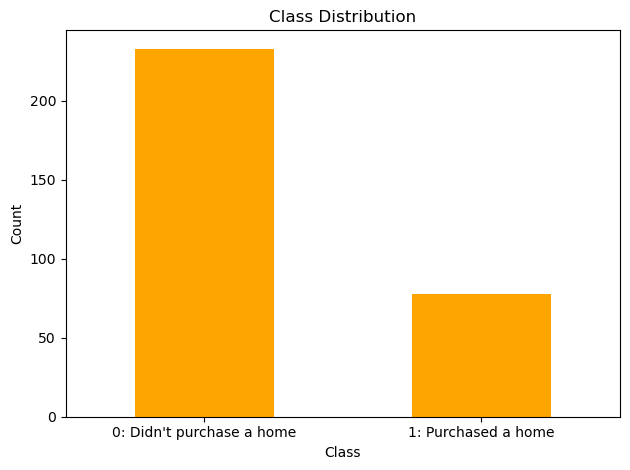

0    233
1     78
Name: home_ownership_class, dtype: int64

0    0.749196
1    0.250804
Name: home_ownership_class, dtype: float64

In [223]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

## Runs: RobustScaler()

In [224]:
scaler = RobustScaler()

In [225]:
t11_adaboost_gs, t11_adaboost_be, t11_adaboost_model_info, t11_adaboost_metrics_df = adaboost_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3416666666666667
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8308122326499163
Std Train Score (Precision) 0.013278976542280538
GridSearchCV Runtime: 25.025787353515625 secs
Run 1 - Random State: 0
Test Precision: 0.2222222222222222
Run 2 - Random State: 1
Test Precision: 0.375
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 

In [226]:
t11_dt_gs, t11_dt_be, t11_dt_model_info, t11_dt_metrics_df = dt_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1808 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 5, 'classifier__max_features': 'log2', 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3973917748917749
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=5,
                                        max_features='log2', min_samples_leaf=2,
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 93.16027665138245 secs
Run 1 - Random State: 0
Test Precision: 0.23333333333333334
Run 2 - Random State: 1
Test Precision: 0.2903225806451613
Run 3 - Random State: 2
Test Precision: 0.32
Run 4 - Random State: 3
Test Precision: 0.21428571428571427
Run 5 - Random Stat

In [227]:
t11_logreg_gs, t11_logreg_be, t11_logreg_model_info, t11_logreg_metrics_df = logreg_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4352380952380953
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 81.68340134620667 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.08333333333333333
Run 3 - Random State: 2
Test Precision: 0.35294117647058826
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.2727272727272727
Ave Test Precision: 0.2584670231729055
Stdev Test Precision: 0.10662690157030995
Ave Test Accuracy: 0.6487179487179487
Stdev Test Accuracy: 0.03087588353536484
Ave Test Specifi

In [228]:
t11_knn_gs, t11_knn_be, t11_knn_model_info, t11_knn_metrics_df = knn_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits
Best Hyperparameters: {'classifier__metric': 'canberra', 'classifier__n_neighbors': 15, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4184523809523809
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 KNeighborsClassifier(metric='canberra', n_neighbors=15))])
Mean Train Score (Precision) 0.5091761085718846
Std Train Score (Precision) 0.03319810013466686
GridSearchCV Runtime: 51.15581250190735 secs
Run 1 - Random State: 0
Test Precision: 0.3157894736842105
Run 2 - Random State: 1
Test Precision: 0.08333333333333333
Run 3 - Random State: 2
Test Precision: 0.43478260869565216
Run 4 - Random State: 3
Test Precision: 0.43333333333333335
Run 5 - Random State: 4
Test Precision: 0.47368421052631576
Ave Test Precision: 0.348184591914569
Stdev Test Precision: 0.15944851191257142
Ave Te

In [229]:
t11_svm_gs, t11_svm_be, t11_svm_model_info, t11_svm_metrics_df = svm_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 10000.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.5138095238095237
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(C=10000.0, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.38396488414102453
Std Train Score (Precision) 0.06757688766936748
GridSearchCV Runtime: 56.87662196159363 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.2857142857142857
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.42857142857142855


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


[LibSVM]Run 3 - Random State: 2
Test Precision: 0.45454545454545453
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.25
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.2777777777777778
Ave Test Precision: 0.33932178932178936
Stdev Test Precision: 0.09471246351638478
Ave Test Accuracy: 0.6128205128205128
Stdev Test Accuracy: 0.20258844384746905
Ave Test Specificity: 0.7068965517241379
Ave Test Recall: 0.33999999999999997
Ave Test NPV: 0.7066323313012403
Ave Test F1-Score: 0.2703884487203672
Ave Test G-mean: 0.3435647379493808
Ave Runtime: 0.05944418907165527


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [230]:
t11_catboost_gs, t11_catboost_be, t11_catboost_model_info, t11_catboost_metrics_df = catboost_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.00658
0:	learn: 0.6895590	total: 12.5ms	remaining: 12.4s
1:	learn: 0.6866397	total: 24.5ms	remaining: 12.2s
2:	learn: 0.6828479	total: 36.5ms	remaining: 12.1s
3:	learn: 0.6801841	total: 47.8ms	remaining: 11.9s
4:	learn: 0.6773414	total: 58.9ms	remaining: 11.7s
5:	learn: 0.6741829	total: 69.4ms	remaining: 11.5s
6:	learn: 0.6712446	total: 81ms	remaining: 11.5s
7:	learn: 0.6685637	total: 92.1ms	remaining: 11.4s
8:	learn: 0.6663407	total: 103ms	remaining: 11.3s
9:	learn: 0.6633535	total: 114ms	remaining: 11.3s
10:	learn: 0.6607155	total: 125ms	remaining: 11.2s
11:	learn: 0.6586848	total: 136ms	remaining: 11.2s
12:	learn: 0.6566603	total: 147ms	remaining: 11.2s
13:	learn: 0.6539184	total: 159ms	remaining: 11.2s
14:	learn: 0.6511092	total: 170ms	remaining: 11.2s
15:	learn: 0.6481442	total: 182ms	remaining: 11.2s
16:	learn: 0.6448998	total: 194ms	remaining: 11.2s
17:	learn: 0.6425868	total: 206ms	remaining: 11

In [232]:
t11_lgbm_gs, t11_lgbm_be, t11_lgbm_model_info, t11_lgbm_metrics_df = lgbm_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 58, number of negative: 86
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1078
[LightGBM] [Info] Number of data points in the train set: 144, number of used features: 66
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.402778 -> i

In [233]:
t11_gbm_gs, t11_gbm_be, t11_gbm_model_info, t11_gbm_metrics_df = gbm_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.2852380952380952
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=3,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.8231588055567285
Std Train Score (Precision) 0.009634254876077915
GridSearchCV Runtime: 169.25146484375 secs
Run 1 - Random State: 0
Test Precision: 0.125
Run 2 - Random State: 1
Test Precision: 0.1111111111111111
Run 3 - Random State: 2
Test Precision: 0.2
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4


In [234]:
t11_rf_gs, t11_rf_be, t11_rf_model_info, t11_rf_metrics_df = rf_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.44071428571428567
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=2, n_estimators=200,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.5609004134537909
Std Train Score (Precision) 0.039504894980957904
GridSearchCV Runtime: 511.69627690315247 secs
Run 1 - Random State: 0
Test Precision: 0.375
Run 2 - Random State: 1
Test Precision: 0.42857142857142855
Run 3 - Random State: 2
Test Precision: 0.42857142857142

In [235]:
t11_xgb_gs, t11_xgb_be, t11_xgb_model_info, t11_xgb_metrics_df = xgb_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 1, 'classifier__max_depth': 3, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.4008333333333334
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
              

## Results

In [236]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't11_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t11_model_summ)
t11_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t11_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
4,Random Forest,0.385777,0.046638,0.440714,0.560900,0.039505,0.697436,0.029515,0.837931,0.29,0.774366,0.323621,0.485372
0,k-Nearest Neighbors,0.348185,0.159449,0.418452,0.509176,0.033198,0.679487,0.045327,0.779310,0.39,0.792148,0.363369,0.518938
1,SVM Classifier,0.339322,0.094712,0.513810,0.383965,0.067577,0.612821,0.202588,0.706897,0.34,0.706632,0.270388,0.343565
8,AdaBoost,0.325505,0.060609,0.341667,0.830812,0.013279,0.707692,0.016716,0.906897,0.13,0.751493,0.183595,0.339275
6,LightGBM,0.318616,0.023902,0.396667,0.708492,0.027407,0.607692,0.024992,0.655172,0.47,0.783415,0.377240,0.549708
9,CatBoost,0.290519,0.076375,0.359524,0.841319,0.013950,0.687179,0.019443,0.868966,0.16,0.750204,0.204814,0.366438
2,Logistic Regression,0.258467,0.106627,0.435238,NaN,NaN,0.648718,0.030876,0.796552,0.22,0.748341,0.235166,0.400840
7,Extreme Gradient Boosting (XGBoost),0.257143,0.131320,0.400833,0.790155,0.015983,0.666667,0.040542,0.841379,0.16,0.743934,0.196078,0.355402
3,Decision Tree,0.256750,0.045926,0.397392,NaN,NaN,0.561538,0.041937,0.627586,0.37,0.742423,0.302601,0.480860
5,Gradient Boosting Machine (GBM),0.209444,0.096057,0.285238,0.823159,0.009634,0.669231,0.029235,0.862069,0.11,0.737701,0.138146,0.291289


In [237]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t11_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.707692,AdaBoost
Highest Test G-mean,0.549708,LightGBM
Highest Test Recall,0.470000,LightGBM
Highest Test Precision,0.385777,Random Forest
Highest Test Specificity,0.906897,AdaBoost
Highest Test F1-score,0.377240,LightGBM


# HO_T12: Yes - 1, 20 (20k, 50k, 75k, 100k), 30

In [238]:
df = dataset.copy().drop(columns=cols_with_nulls)
df = df[df['positiveMonthlyFamilyNetIncome'] != 0]
# df_num = df.drop(columns=['gender', 'province', 'job'])
df = pd.get_dummies(df, columns=['gender'], prefix='gender', drop_first='True')
df = pd.get_dummies(df, columns=['province'], prefix='province', drop_first='True')
df = pd.get_dummies(df, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']
df['salary_bin'] = pd.cut(df['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
df['salary_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

df.loc[df['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# df.isna().sum()[df.isna().sum() > 0]
# df = t11

## EDA on Dataset

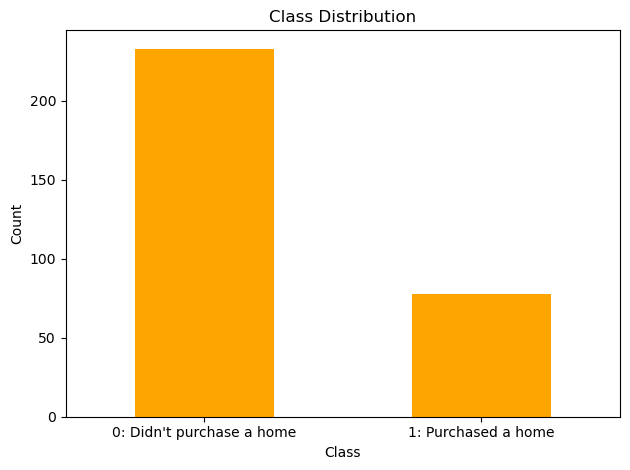

0    233
1     78
Name: home_ownership_class, dtype: int64

0    0.749196
1    0.250804
Name: home_ownership_class, dtype: float64

In [239]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

In [240]:
t12 = df.copy()

## Runs: RobustScaler()

In [241]:
scaler = RobustScaler()

In [242]:
t12_adaboost_gs, t12_adaboost_be, t12_adaboost_model_info, t12_adaboost_metrics_df = adaboost_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3566666666666667
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8319856569702058
Std Train Score (Precision) 0.01345237322275274
GridSearchCV Runtime: 14.642007112503052 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.2
Run 4 - Random State: 3
Test Precision: 0.2857142857142857
Run 5 - Random State: 4
Test Precision: 0.4

In [243]:
t12_dt_gs, t12_dt_be, t12_dt_model_info, t12_dt_metrics_df = dt_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2129 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 5, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.45746753246753247
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=5,
                                        max_features='sqrt', min_samples_leaf=3,
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 253.4252574443817 secs
Run 1 - Random State: 0
Test Precision: 0.5
Run 2 - Random State: 1
Test Precision: 0.14285714285714285
Run 3 - Random State: 2
Test Precision: 0.5
Run 4 - Random State: 3
Test Precision: 0.3076923076923077
Run 5 - Random State: 4
Test Precision: 0.75
Ave Test Precision: 0.4401

In [245]:
t12_logreg_gs, t12_logreg_be, t12_logreg_model_info, t12_logreg_metrics_df = logreg_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4352380952380953
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 88.27078795433044 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.08333333333333333
Run 3 - Random State: 2
Test Precision: 0.35294117647058826
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.2727272727272727
Ave Test Precision: 0.2584670231729055
Stdev Test Precision: 0.10662690157030995
Ave Test Accuracy: 0.6487179487179487
Stdev Test Accuracy: 0.03087588353536484
Ave Test Specifi

In [246]:
t12_knn_gs, t12_knn_be, t12_knn_model_info, t12_knn_metrics_df = knn_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits
Best Hyperparameters: {'classifier__metric': 'canberra', 'classifier__n_neighbors': 15, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4184523809523809
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 KNeighborsClassifier(metric='canberra', n_neighbors=15))])
Mean Train Score (Precision) 0.5088247305192428
Std Train Score (Precision) 0.03317093640461084
GridSearchCV Runtime: 47.76673078536987 secs
Run 1 - Random State: 0
Test Precision: 0.3157894736842105
Run 2 - Random State: 1
Test Precision: 0.08333333333333333
Run 3 - Random State: 2
Test Precision: 0.44
Run 4 - Random State: 3
Test Precision: 0.41379310344827586
Run 5 - Random State: 4
Test Precision: 0.47368421052631576
Ave Test Precision: 0.34532002419842706
Stdev Test Precision: 0.15782847044772874
Ave Test Accuracy: 

In [247]:
t12_svm_gs, t12_svm_be, t12_svm_model_info, t12_svm_metrics_df = svm_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1000.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.49333333333333335
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(C=1000.0, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.38366678337507415
Std Train Score (Precision) 0.06995794313666727
GridSearchCV Runtime: 47.24063229560852 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.14285714285714285
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.3333333333333333


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


[LibSVM]Run 3 - Random State: 2
Test Precision: 0.4
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.2727272727272727
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.29411764705882354
Ave Test Precision: 0.2886070791953145
Stdev Test Precision: 0.09478185370739417
Ave Test Accuracy: 0.6897435897435897
Stdev Test Accuracy: 0.02779420947266512
Ave Test Specificity: 0.8758620689655172
Ave Test Recall: 0.15
Ave Test NPV: 0.7494934531844559
Ave Test F1-Score: 0.19168111039078778
Ave Test G-mean: 0.3490367228918217
Ave Runtime: 0.05658025741577148


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [248]:
t12_catboost_gs, t12_catboost_be, t12_catboost_model_info, t12_catboost_metrics_df = catboost_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.00658
0:	learn: 0.6903026	total: 7.29ms	remaining: 7.28s
1:	learn: 0.6873770	total: 15.7ms	remaining: 7.83s
2:	learn: 0.6838138	total: 22.9ms	remaining: 7.61s
3:	learn: 0.6811430	total: 30ms	remaining: 7.47s
4:	learn: 0.6782949	total: 37.4ms	remaining: 7.44s
5:	learn: 0.6751256	total: 45.1ms	remaining: 7.47s
6:	learn: 0.6721862	total: 53ms	remaining: 7.52s
7:	learn: 0.6694964	total: 59.9ms	remaining: 7.43s
8:	learn: 0.6673629	total: 67.4ms	remaining: 7.42s
9:	learn: 0.6638682	total: 74.8ms	remaining: 7.41s
10:	learn: 0.6612232	total: 82.8ms	remaining: 7.44s
11:	learn: 0.6587727	total: 90ms	remaining: 7.41s
12:	learn: 0.6565115	total: 97.4ms	remaining: 7.39s
13:	learn: 0.6537805	total: 105ms	remaining: 7.38s
14:	learn: 0.6511953	total: 112ms	remaining: 7.38s
15:	learn: 0.6487697	total: 119ms	remaining: 7.32s
16:	learn: 0.6455062	total: 126ms	remaining: 7.29s
17:	learn: 0.6431926	total: 133ms	remaining: 7.26s
18:	learn: 0.6394147	total: 140ms	remaining: 7.24s
19:	l

In [249]:
t12_lgbm_gs, t12_lgbm_be, t12_lgbm_model_info, t12_lgbm_metrics_df = lgbm_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 184, number of negative: 175
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3357
[LightGBM] [Info] Number of data points in the train set: 359, number of used features: 78
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.512535 -> initscore=0.050150
[LightGBM] [Info] Start training from score 0.050150
[LightGBM] [Warning] No further splits with positive gai

In [250]:
t12_gbm_gs, t12_gbm_be, t12_gbm_model_info, t12_gbm_metrics_df = gbm_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.29877317127317127
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=2,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.8238105920420559
Std Train Score (Precision) 0.010572966048493096
GridSearchCV Runtime: 141.56226873397827 secs
Run 1 - Random State: 0
Test Precision: 0.26666666666666666
Run 2 - Random State: 1
Test Precision: 0.20689655172413793
Run 3 - Random State: 2
Test Precision: 0.3125
Run 4 - Random State: 3
Test Precis

In [251]:
t12_rf_gs, t12_rf_be, t12_rf_model_info, t12_rf_metrics_df = rf_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4435714285714286
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=3, n_estimators=200,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.5638149892397107
Std Train Score (Precision) 0.03950900871446437
GridSearchCV Runtime: 397.7444381713867 secs
Run 1 - Random State: 0
Test Precision: 0.42857142857142855
Run 2 - Random State: 1
Test Precision: 

In [252]:
t12_xgb_gs, t12_xgb_be, t12_xgb_model_info, t12_xgb_metrics_df = xgb_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.36150793650793644
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
  

## Results

In [253]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't12_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t12_model_summ)
t12_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t12_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
3,Decision Tree,0.440110,0.228637,0.457468,NaN,NaN,0.715385,0.069278,0.882759,0.23,0.769204,0.285799,0.431636
4,Random Forest,0.399405,0.042737,0.443571,0.563815,0.039509,0.702564,0.027794,0.844828,0.29,0.775951,0.325929,0.486241
0,k-Nearest Neighbors,0.345320,0.157828,0.418452,0.508825,0.033171,0.676923,0.044780,0.775862,0.39,0.791063,0.362083,0.518240
6,LightGBM,0.322711,0.096796,0.432222,0.710200,0.027119,0.682051,0.031923,0.841379,0.22,0.757814,0.261421,0.426541
8,AdaBoost,0.297143,0.082743,0.356667,0.831986,0.013452,0.705128,0.009065,0.903448,0.13,0.751083,0.178080,0.330610
9,CatBoost,0.291642,0.118210,0.358333,0.843713,0.016003,0.689744,0.034401,0.875862,0.15,0.749389,0.196131,0.351205
7,Extreme Gradient Boosting (XGBoost),0.291538,0.079401,0.361508,0.790717,0.016129,0.612821,0.043853,0.693103,0.38,0.766929,0.326251,0.500930
1,SVM Classifier,0.288607,0.094782,0.493333,0.383667,0.069958,0.689744,0.027794,0.875862,0.15,0.749493,0.191681,0.349037
2,Logistic Regression,0.258467,0.106627,0.435238,NaN,NaN,0.648718,0.030876,0.796552,0.22,0.748341,0.235166,0.400840
5,Gradient Boosting Machine (GBM),0.258427,0.039465,0.298773,0.823811,0.010573,0.551282,0.044412,0.603448,0.40,0.744379,0.312841,0.488061


In [254]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t12_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.715385,Decision Tree
Highest Test G-mean,0.518240,k-Nearest Neighbors
Highest Test Recall,0.400000,Gradient Boosting Machine (GBM)
Highest Test Precision,0.440110,Decision Tree
Highest Test Specificity,0.903448,AdaBoost
Highest Test F1-score,0.362083,k-Nearest Neighbors


# HO_T13: Yes - 4, 20 (20k, 50k, 75k, 100k), 30, 31 (0.15)

In [ ]:
df = dataset.copy().drop(columns=cols_with_nulls)
df = df[df['positiveMonthlyFamilyNetIncome'] != 0]
# df_num = df.drop(columns=['gender', 'province', 'job'])
df = pd.get_dummies(df, columns=['gender'], prefix='gender', drop_first='True')
df = pd.get_dummies(df, columns=['province'], prefix='province', drop_first='True')
df = pd.get_dummies(df, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']
df['salary_bin'] = pd.cut(df['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
df['salary_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# df.loc[df['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# df.isna().sum()[df.isna().sum() > 0]
# df = t11

## EDA on Dataset

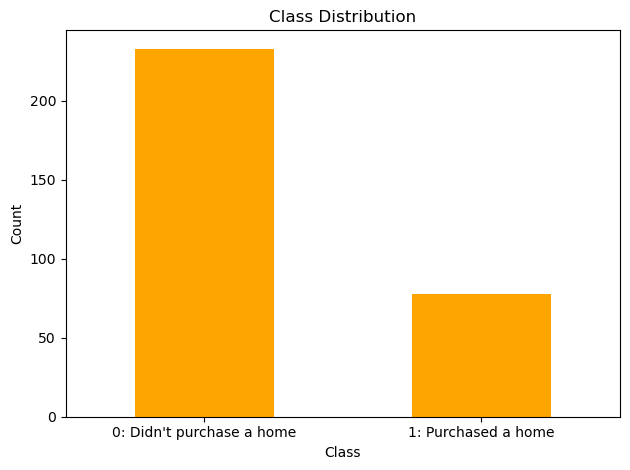

0    233
1     78
Name: home_ownership_class, dtype: int64

0    0.749196
1    0.250804
Name: home_ownership_class, dtype: float64

In [256]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))
t13 = df.copy()

In [257]:
df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
df_y = df.copy()[['home_ownership_class']]

selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(df_X)

df_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

# display(df_mod)
retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

t13 = df.copy().drop(columns=filtered_out_columns)

Number of columns: 41
Removed columns: ['gambling', 'loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'positiveMonthlyFamilyNetIncome', 'positiveMonthlyFamilyNetIncomeWithSavings', 'positive monthlyFamilyIncome - monthlyExpenses', 'monthlyExpenses / monthlyFamilyIncome', 'monthlyVices / monthlyFamilyIncome', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_BULACAN', 'province_CEBU', 'province_COTABATO', 'province_FOREIGN COUNTRY', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_PANGASINAN', 'province_RIZAL', 'province_UNKNOWN', 'province_ZAMBOANGA DEL NORTE', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_MACHINE OPERATOR', 'job_MANAGER', 'job_NONE', 'job_PROFESIONAL', 'job_UNKNOWN']


## Runs: RobustScaler()

In [258]:
scaler = RobustScaler()

In [259]:
t13_adaboost_gs, t13_adaboost_be, t13_adaboost_model_info, t13_adaboost_metrics_df = adaboost_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.32333333333333336
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8359857703871612
Std Train Score (Precision) 0.01278773588639936
GridSearchCV Runtime: 7.784127950668335 secs
Run 1 - Random State: 0
Test Precision: 0.18181818181818182
Run 2 - Random State: 1
Test Precision: 0.2857142857142857
Run 3 - Random State: 2
Test Precision: 0.40625
Run 4 - Random State: 3
Test Precision: 0.3225806451612903
Run 5 - Random Sta

In [260]:
t13_dt_gs, t13_dt_be, t13_dt_model_info, t13_dt_metrics_df = dt_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2007 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.417987012987013
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, max_features='sqrt',
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 104.00667905807495 secs
Run 1 - Random State: 0
Test Precision: 0.3333333333333333
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.2692307692307692
Run 5 - Random State: 4
Test Precision: 0.24324324324324326
Ave Test Precision: 0.27

In [261]:
t13_logreg_gs, t13_logreg_be, t13_logreg_model_info, t13_logreg_metrics_df = logreg_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4502380952380953
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 57.047136545181274 secs
Run 1 - Random State: 0
Test Precision: 0.18181818181818182
Run 2 - Random State: 1
Test Precision: 0.08333333333333333
Run 3 - Random State: 2
Test Precision: 0.35294117647058826
Run 4 - Random State: 3
Test Precision: 0.35294117647058826
Run 5 - Random State: 4
Test Precision: 0.2727272727272727
Ave Test Precision: 0.2487522281639929
Stdev Test Precision: 0.11632825751671437
Ave Test Accuracy: 0.6487179487179487
Stdev Test Accuracy: 0.03217923178977213

In [262]:
t13_knn_gs, t13_knn_be, t13_knn_model_info, t13_knn_metrics_df = knn_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits
Best Hyperparameters: {'classifier__metric': 'chebyshev', 'classifier__n_neighbors': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.4083333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='chebyshev', n_neighbors=2))])
Mean Train Score (Precision) 0.5131323001119864
Std Train Score (Precision) 0.03377694662363974
GridSearchCV Runtime: 56.18148612976074 secs
Run 1 - Random State: 0
Test Precision: 0.09090909090909091
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.3888888888888889
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.23076923076923078
Ave Test Precision: 0.19211344211344214
Stdev Test Precision: 0.15059514880765587
Ave Test Accuracy

In [263]:
t13_svm_gs, t13_svm_be, t13_svm_model_info, t13_svm_metrics_df = svm_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1000.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.5433333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(C=1000.0, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.37938351902532386
Std Train Score (Precision) 0.06596169685683263
GridSearchCV Runtime: 47.89508557319641 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.125
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.3333333333333333
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.3
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.18181818181818182
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.375
Ave Test Precision: 0.26303030303030306
Stdev Test Precision: 0.10

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [264]:
t13_catboost_gs, t13_catboost_be, t13_catboost_model_info, t13_catboost_metrics_df = catboost_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.00658
0:	learn: 0.6906139	total: 3.5ms	remaining: 3.5s
1:	learn: 0.6877864	total: 6.36ms	remaining: 3.17s
2:	learn: 0.6853906	total: 9.55ms	remaining: 3.17s
3:	learn: 0.6826148	total: 12.8ms	remaining: 3.18s
4:	learn: 0.6806096	total: 15.6ms	remaining: 3.1s
5:	learn: 0.6784193	total: 18.7ms	remaining: 3.1s
6:	learn: 0.6767748	total: 21.6ms	remaining: 3.06s
7:	learn: 0.6732311	total: 24.5ms	remaining: 3.04s
8:	learn: 0.6696939	total: 27.5ms	remaining: 3.02s
9:	learn: 0.6676034	total: 29.8ms	remaining: 2.95s
10:	learn: 0.6654516	total: 32.3ms	remaining: 2.9s
11:	learn: 0.6621397	total: 34.7ms	remaining: 2.85s
12:	learn: 0.6595460	total: 37ms	remaining: 2.81s
13:	learn: 0.6569880	total: 39.3ms	remaining: 2.77s
14:	learn: 0.6548572	total: 41.6ms	remaining: 2.73s
15:	learn: 0.6527425	total: 43.9ms	remaining: 2.7s
16:	learn: 0.6496986	total: 46.5ms	remaining: 2.69s
17:	learn: 0.6459056	total: 48.9ms	remaining: 2.67s
18:	learn: 0.6437034	total: 51.3ms	remaining: 2.65s
1

In [265]:
t13_lgbm_gs, t13_lgbm_be, t13_lgbm_model_info, t13_lgbm_metrics_df = lgbm_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 175, number of negative: 175
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3022
[LightGBM] [Info] Number of data points in the train set: 350, number of used features: 64
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

In [266]:
t13_gbm_gs, t13_gbm_be, t13_gbm_model_info, t13_gbm_metrics_df = gbm_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.3067857142857143
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8277140216314424
Std Train Score (Precision) 0.010183098698030652
GridSearchCV Runtime: 81.57122874259949 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.26666666666666666
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.3
Run 5 - Random State: 4
Test Precisi

In [267]:
t13_rf_gs, t13_rf_be, t13_rf_model_info, t13_rf_metrics_df = rf_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4638095238095238
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=3, n_estimators=300,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.5567264471934301
Std Train Score (Precision) 0.03600477413579644
GridSearchCV Runtime: 240.8467400074005 secs
Run 1 - Random State: 0
Test Precision: 0.5
Run 2 - Random State: 1
Test Precision: 0.2857142857142857
Run 3 - Random State: 2
Test Precision: 0.375
Run 4 - Random S

In [268]:
t13_xgb_gs, t13_xgb_be, t13_xgb_model_info, t13_xgb_metrics_df = xgb_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.3922619047619048
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
           

## Results

In [269]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't13_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t13_model_summ)
t13_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t13_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
4,Random Forest,0.375779,0.082836,0.463810,0.556726,0.036005,0.689744,0.038887,0.834483,0.27,0.768251,0.306106,0.469892
9,CatBoost,0.302381,0.153751,0.365000,0.846095,0.013917,0.715385,0.022934,0.927586,0.10,0.749491,0.149023,0.290094
8,AdaBoost,0.294445,0.081238,0.323333,0.835986,0.012788,0.625641,0.036712,0.706897,0.39,0.775178,0.328081,0.498659
5,Gradient Boosting Machine (GBM),0.286667,0.055777,0.306786,0.827714,0.010183,0.682051,0.021066,0.862069,0.16,0.748505,0.203760,0.368262
3,Decision Tree,0.275828,0.058028,0.417987,NaN,NaN,0.569231,0.078823,0.631034,0.39,0.747125,0.319825,0.493085
1,SVM Classifier,0.263030,0.105468,0.543333,0.379384,0.065962,0.684615,0.024992,0.872414,0.14,0.746822,0.177528,0.333383
7,Extreme Gradient Boosting (XGBoost),0.255000,0.085716,0.392262,0.793091,0.016912,0.646154,0.032179,0.800000,0.20,0.743676,0.224127,0.395188
2,Logistic Regression,0.248752,0.116328,0.450238,NaN,NaN,0.648718,0.032179,0.800000,0.21,0.746890,0.225179,0.388830
6,LightGBM,0.235777,0.084317,0.416667,0.712004,0.027223,0.648718,0.033432,0.810345,0.18,0.741590,0.201521,0.367857
0,k-Nearest Neighbors,0.192113,0.150595,0.408333,0.513132,0.033777,0.653846,0.023985,0.827586,0.15,0.739692,0.167396,0.297317


In [270]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t13_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.715385,CatBoost
Highest Test G-mean,0.498659,AdaBoost
Highest Test Recall,0.390000,Decision Tree
Highest Test Precision,0.375779,Random Forest
Highest Test Specificity,0.927586,CatBoost
Highest Test F1-score,0.328081,AdaBoost


# HO_T14: Yes - 1, 4, 20 (20k, 50k, 75k, 100k), 30, 31 (0.15)

In [271]:
df = dataset.copy().drop(columns=cols_with_nulls)
df = df[df['positiveMonthlyFamilyNetIncome'] != 0]
# df_num = df.drop(columns=['gender', 'province', 'job'])
df = pd.get_dummies(df, columns=['gender'], prefix='gender', drop_first='True')
df = pd.get_dummies(df, columns=['province'], prefix='province', drop_first='True')
df = pd.get_dummies(df, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']
df['salary_bin'] = pd.cut(df['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
df['salary_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

df.loc[df['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# df.isna().sum()[df.isna().sum() > 0]
# df = t11

## EDA on Dataset

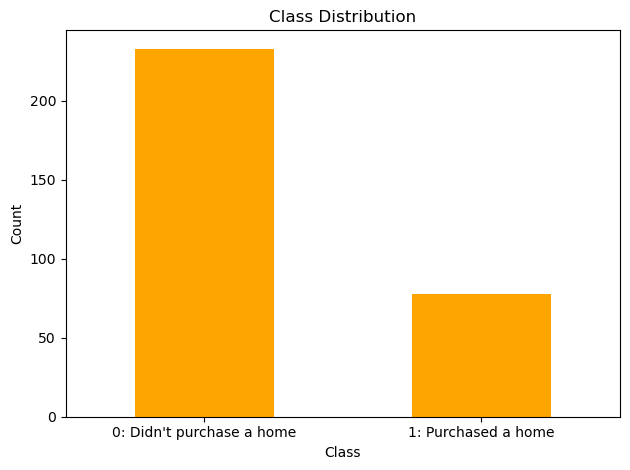

0    233
1     78
Name: home_ownership_class, dtype: int64

0    0.749196
1    0.250804
Name: home_ownership_class, dtype: float64

In [272]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))
t14 = df.copy()

In [273]:
df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
df_y = df.copy()[['home_ownership_class']]

selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(df_X)

df_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

# display(df_mod)
retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

t14 = df.copy().drop(columns=filtered_out_columns)

Number of columns: 41
Removed columns: ['gambling', 'loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'positiveMonthlyFamilyNetIncome', 'positiveMonthlyFamilyNetIncomeWithSavings', 'positive monthlyFamilyIncome - monthlyExpenses', 'monthlyExpenses / monthlyFamilyIncome', 'monthlyVices / monthlyFamilyIncome', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_BULACAN', 'province_CEBU', 'province_COTABATO', 'province_FOREIGN COUNTRY', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_PANGASINAN', 'province_RIZAL', 'province_UNKNOWN', 'province_ZAMBOANGA DEL NORTE', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_MACHINE OPERATOR', 'job_MANAGER', 'job_NONE', 'job_PROFESIONAL', 'job_UNKNOWN']


## Runs: RobustScaler()

In [274]:
scaler = RobustScaler()

In [275]:
t14_adaboost_gs, t14_adaboost_be, t14_adaboost_model_info, t14_adaboost_metrics_df = adaboost_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.32611111111111113
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8352743338457372
Std Train Score (Precision) 0.01251993133706691
GridSearchCV Runtime: 7.543023586273193 secs
Run 1 - Random State: 0
Test Precision: 0.3333333333333333
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.3225806451612903
Run 5 - Random State: 

In [276]:
t14_dt_gs, t14_dt_be, t14_dt_model_info, t14_dt_metrics_df = dt_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.43753968253968256
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, max_features='sqrt',
                                        min_samples_leaf=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 90.62357950210571 secs
Run 1 - Random State: 0
Test Precision: 0.3333333333333333
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.3103448275862069
Run 4 - Random State: 3
Test Precision: 0.25925925925925924
Run 5 - Random State: 4
Test Precision: 0.24242424242424243
Av


4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2463 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

In [277]:
t14_logreg_gs, t14_logreg_be, t14_logreg_model_info, t14_logreg_metrics_df = logreg_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4502380952380953
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 51.68298053741455 secs
Run 1 - Random State: 0
Test Precision: 0.18181818181818182
Run 2 - Random State: 1
Test Precision: 0.08333333333333333
Run 3 - Random State: 2
Test Precision: 0.35294117647058826
Run 4 - Random State: 3
Test Precision: 0.35294117647058826
Run 5 - Random State: 4
Test Precision: 0.2727272727272727
Ave Test Precision: 0.2487522281639929
Stdev Test Precision: 0.11632825751671437
Ave Test Accuracy: 0.6487179487179487
Stdev Test Accuracy: 0.03217923178977213


In [278]:
t14_knn_gs, t14_knn_be, t14_knn_model_info, t14_knn_metrics_df = knn_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'chebyshev', 'classifier__n_neighbors': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.4083333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='chebyshev', n_neighbors=2))])
Mean Train Score (Precision) 0.5127912286417011
Std Train Score (Precision) 0.033639813022077865
GridSearchCV Runtime: 43.60504174232483 secs
Run 1 - Random State: 0
Test Precision: 0.09090909090909091
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.3888888888888889
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.23076923076923078
Ave Test Precision: 0.19211344211344214
Stdev Test Precision: 0.15059514880765587
Ave Test Accuracy: 0.6538461538461539
Stdev Test Accuracy: 0.023984983248550893
A

In [279]:
t14_svm_gs, t14_svm_be, t14_svm_model_info, t14_svm_metrics_df = svm_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1.0, 'classifier__kernel': 'rbf', 'classifier__probability': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.485
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(max_iter=1000, probability=True, random_state=0,
                     verbose=True))])
Mean Train Score (Precision) 0.38032157884292583
Std Train Score (Precision) 0.06680461683884564
GridSearchCV Runtime: 37.64329743385315 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.2
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.2
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.35714285714285715
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.14285714285714285
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.3333333333333333
Ave Test Precision: 0.24666666666666665
Stdev Test Precision: 0.09333819229334564
Ave Test Accur

In [280]:
t14_catboost_gs, t14_catboost_be, t14_catboost_model_info, t14_catboost_metrics_df = catboost_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.00658
0:	learn: 0.6894622	total: 3.29ms	remaining: 3.28s
1:	learn: 0.6867574	total: 5.88ms	remaining: 2.94s
2:	learn: 0.6841523	total: 8.57ms	remaining: 2.85s
3:	learn: 0.6809856	total: 11.6ms	remaining: 2.9s
4:	learn: 0.6777905	total: 14.3ms	remaining: 2.85s
5:	learn: 0.6749072	total: 17.3ms	remaining: 2.86s
6:	learn: 0.6714127	total: 20.1ms	remaining: 2.85s
7:	learn: 0.6680625	total: 22.6ms	remaining: 2.8s
8:	learn: 0.6649806	total: 25.5ms	remaining: 2.81s
9:	learn: 0.6625332	total: 28.1ms	remaining: 2.78s
10:	learn: 0.6599094	total: 30.5ms	remaining: 2.74s
11:	learn: 0.6570142	total: 32.8ms	remaining: 2.7s
12:	learn: 0.6537779	total: 35.2ms	remaining: 2.67s
13:	learn: 0.6505748	total: 37.6ms	remaining: 2.65s
14:	learn: 0.6477789	total: 39.9ms	remaining: 2.62s
15:	learn: 0.6451534	total: 42.4ms	remaining: 2.61s
16:	learn: 0.6425899	total: 44.9ms	remaining: 2.59s
17:	learn: 0.6398201	total: 47.3ms	remaining: 2.58s
18:	learn: 0.6372158	total: 50ms	remaining: 2.58

In [281]:
t14_lgbm_gs, t14_lgbm_be, t14_lgbm_model_info, t14_lgbm_metrics_df = lgbm_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 187, number of negative: 175
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3149
[LightGBM] [Info] Number of data points in the train set: 362, number of used features: 64
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.516575 -> initscore=0.066323
[LightGBM] [Info] Start training from score 0.066323
[LightGBM] [Warning] No further splits with positive gai

In [282]:
t14_gbm_gs, t14_gbm_be, t14_gbm_model_info, t14_gbm_metrics_df = gbm_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.2816666666666667
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8281710441759277
Std Train Score (Precision) 0.010485462786730872
GridSearchCV Runtime: 64.00922513008118 secs
Run 1 - Random State: 0
Test Precision: 0.3
Run 2 - Random State: 1
Test Precision: 0.18181818181818182
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random 

In [283]:
t14_rf_gs, t14_rf_be, t14_rf_model_info, t14_rf_metrics_df = rf_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4383333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=3, n_estimators=300,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.5608709457287687
Std Train Score (Precision) 0.036822499197382855
GridSearchCV Runtime: 223.90178966522217 secs
Run 1 - Random State: 0
Test Precision: 0.5
Run 2 - Random State: 1
Test Precision: 0.3076923076923077
Run 3 - Random State: 2
Test Precision: 0.3888888888888889
R

In [284]:
t14_xgb_gs, t14_xgb_be, t14_xgb_model_info, t14_xgb_metrics_df = xgb_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.42333333333333334
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
          

## Results

In [285]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't14_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t14_model_summ)
t14_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t14_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
4,Random Forest,0.385983,0.074341,0.438333,0.560871,0.036822,0.694872,0.033185,0.837931,0.28,0.771663,0.316176,0.478770
9,CatBoost,0.374583,0.051051,0.349167,0.846955,0.014317,0.705128,0.020271,0.875862,0.21,0.762697,0.267427,0.428188
5,Gradient Boosting Machine (GBM),0.320173,0.115377,0.281667,0.828171,0.010485,0.689744,0.034401,0.872414,0.16,0.750562,0.209019,0.370610
8,AdaBoost,0.303849,0.037276,0.326111,0.835274,0.012520,0.628205,0.037378,0.724138,0.35,0.765044,0.317249,0.491781
6,LightGBM,0.292341,0.036401,0.404524,0.712746,0.027601,0.656410,0.035575,0.803448,0.23,0.751362,0.254110,0.426805
3,Decision Tree,0.269072,0.053410,0.437540,NaN,NaN,0.566667,0.069278,0.631034,0.38,0.744709,0.312623,0.487934
2,Logistic Regression,0.248752,0.116328,0.450238,NaN,NaN,0.648718,0.032179,0.800000,0.21,0.746890,0.225179,0.388830
1,SVM Classifier,0.246667,0.093338,0.485000,0.380322,0.066805,0.689744,0.016716,0.879310,0.14,0.748828,0.168796,0.318119
7,Extreme Gradient Boosting (XGBoost),0.241194,0.015728,0.423333,0.793176,0.016482,0.628205,0.009065,0.772414,0.21,0.739288,0.224318,0.402225
0,k-Nearest Neighbors,0.192113,0.150595,0.408333,0.512791,0.033640,0.653846,0.023985,0.827586,0.15,0.739692,0.167396,0.297317


In [286]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t14_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.705128,CatBoost
Highest Test G-mean,0.491781,AdaBoost
Highest Test Recall,0.380000,Decision Tree
Highest Test Precision,0.385983,Random Forest
Highest Test Specificity,0.879310,SVM Classifier
Highest Test F1-score,0.317249,AdaBoost


# HO_T15: Yes - 1, 4, 20 (20k, 50k, 75k, 100k), 30, 31 (0.05)

In [40]:
df = dataset.copy().drop(columns=cols_with_nulls)
df = df[df['positiveMonthlyFamilyNetIncome'] != 0]
# df_num = df.drop(columns=['gender', 'province', 'job'])
df = pd.get_dummies(df, columns=['gender'], prefix='gender', drop_first='True')
df = pd.get_dummies(df, columns=['province'], prefix='province', drop_first='True')
df = pd.get_dummies(df, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']
df['salary_bin'] = pd.cut(df['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
df['salary_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

df.loc[df['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# df.isna().sum()[df.isna().sum() > 0]
# df = t11

## EDA on Dataset

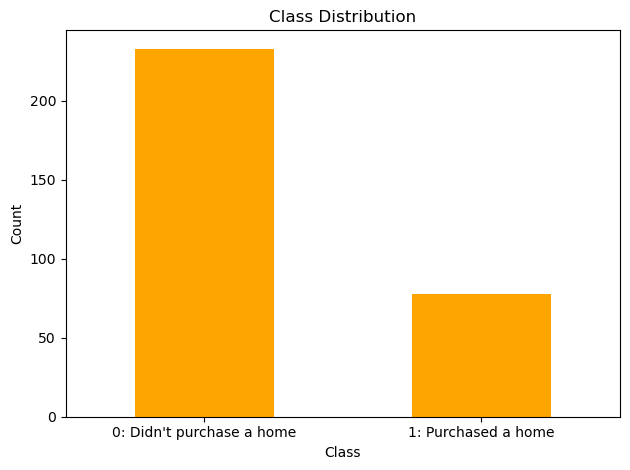

0    233
1     78
Name: home_ownership_class, dtype: int64

0    0.749196
1    0.250804
Name: home_ownership_class, dtype: float64

In [41]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))
# t15 = df.copy()

In [42]:
df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
df_y = df.copy()[['home_ownership_class']]

selector = VarianceThreshold(threshold=0.05)
filtered_data = selector.fit_transform(df_X)

df_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

# display(df_mod)
retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

df_trial = df.copy().drop(columns=filtered_out_columns)

Number of columns: 29
Removed columns: ['gambling', 'loanGSIS', 'houseHasPensioner', 'positiveMonthlyFamilyNetIncome', 'positiveMonthlyFamilyNetIncomeWithSavings', 'positive monthlyFamilyIncome - monthlyExpenses', 'monthlyExpenses / monthlyFamilyIncome', 'monthlyVices / monthlyFamilyIncome', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_CEBU', 'province_COTABATO', 'province_FOREIGN COUNTRY', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_PANGASINAN', 'province_RIZAL', 'province_ZAMBOANGA DEL NORTE', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_NONE', 'job_UNKNOWN']


## Runs: RobustScaler()

In [43]:
scaler = RobustScaler()

In [295]:
t14_adaboost_gs, t14_adaboost_be, t14_adaboost_model_info, t14_adaboost_metrics_df = adaboost_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.36166666666666664
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8301567818561321
Std Train Score (Precision) 0.01292781260829796
GridSearchCV Runtime: 7.421969890594482 secs
Run 1 - Random State: 0
Test Precision: 0.2857142857142857
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.6
Run 4 - Random State: 3
Test Precision: 

In [44]:
t14_dt_gs, t14_dt_be, t14_dt_model_info, t14_dt_metrics_df = dt_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2046 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 3, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.4935714285714286
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(max_depth=3, max_features='sqrt',
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 100.80086016654968 secs
Run 1 - Random State: 0
Test Precision: 1.0
Run 2 - Random State: 1
Test Precision: 0.375
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.42857142857142855
Ave Test Precision: 0.47738095238095235
Stdev Test Precision: 0.2993520970438242
Ave Test Accuracy: 0.728205

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


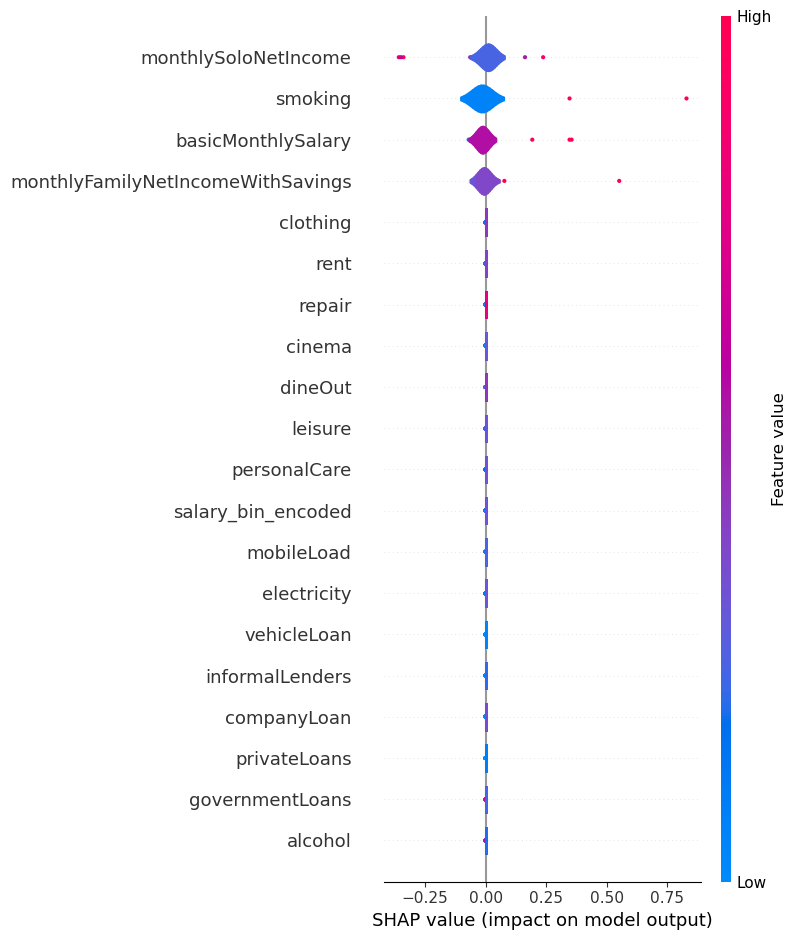

In [45]:
df = df_trial.copy()
# model = ho_t02_xgb_be.named_steps['classifier']
model = t14_dt_be
label_col = 'home_ownership_class'
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(model.predict, X_test)
# explainer = shap.TreeExplainer(model=model,
#                                data=X_test,
#                                model_output='raw',
# #                                feature_perturbation='tree_path_dependent'
#                               )

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)
# shap_values = explainer.shap_values(X_test)

feature_names = X.columns

# shap.summary_plot(shap_values, feature_names=feature_names, plot_type='dot')
shap.summary_plot(shap_values, feature_names=feature_names, plot_type='violin')

In [297]:
t14_logreg_gs, t14_logreg_be, t14_logreg_model_info, t14_logreg_metrics_df = logreg_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4352380952380953
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 24.678620100021362 secs
Run 1 - Random State: 0
Test Precision: 0.18181818181818182
Run 2 - Random State: 1
Test Precision: 0.08333333333333333
Run 3 - Random State: 2
Test Precision: 0.35294117647058826
Run 4 - Random State: 3
Test Precision: 0.35294117647058826
Run 5 - Random State: 4
Test Precision: 0.2727272727272727
Ave Test Precision: 0.2487522281639929
Stdev Test Precision: 0.11632825751671437
Ave Test Accuracy: 0.6487179487179487
Stdev Test Accuracy: 0.03217923178977213

In [299]:
t14_knn_gs, t14_knn_be, t14_knn_model_info, t14_knn_metrics_df = knn_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'canberra', 'classifier__n_neighbors': 13, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4529337329337329
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 KNeighborsClassifier(metric='canberra', n_neighbors=13))])
Mean Train Score (Precision) 0.5072884306550943
Std Train Score (Precision) 0.035051718729786074
GridSearchCV Runtime: 15.645521879196167 secs
Run 1 - Random State: 0
Test Precision: 0.23529411764705882
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.4
Run 4 - Random State: 3
Test Precision: 0.391304347826087
Run 5 - Random State: 4
Test Precision: 0.2916666666666667
Ave Test Precision: 0.30365302642796255
Stdev Test Precision: 0.09017490861798423
Ave Test Accuracy: 0.6461538461538462
Stdev Test Accuracy: 0.030875883535364874
Ave Test Specificity:

In [300]:
t14_svm_gs, t14_svm_be, t14_svm_model_info, t14_svm_metrics_df = svm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1000.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.5233333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(C=1000.0, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.38102727327700314
Std Train Score (Precision) 0.06780052710167053
GridSearchCV Runtime: 15.198040008544922 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.14285714285714285
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.3333333333333333
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.3
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.2727272727272727
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.29411764705882354
Ave Test Precision: 0.2686070791953144

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [302]:
t14_catboost_gs, t14_catboost_be, t14_catboost_model_info, t14_catboost_metrics_df = catboost_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.00658
0:	learn: 0.6912913	total: 3.48ms	remaining: 3.48s
1:	learn: 0.6890940	total: 6.53ms	remaining: 3.26s
2:	learn: 0.6865764	total: 9.16ms	remaining: 3.04s
3:	learn: 0.6834270	total: 12.1ms	remaining: 3s
4:	learn: 0.6798490	total: 14.7ms	remaining: 2.93s
5:	learn: 0.6766130	total: 17.5ms	remaining: 2.89s
6:	learn: 0.6739073	total: 20.4ms	remaining: 2.89s
7:	learn: 0.6717013	total: 23.6ms	remaining: 2.92s
8:	learn: 0.6685252	total: 26.3ms	remaining: 2.9s
9:	learn: 0.6658788	total: 29.2ms	remaining: 2.89s
10:	learn: 0.6635237	total: 31.9ms	remaining: 2.87s
11:	learn: 0.6607197	total: 34.8ms	remaining: 2.87s
12:	learn: 0.6583861	total: 37.3ms	remaining: 2.83s
13:	learn: 0.6565539	total: 40.2ms	remaining: 2.83s
14:	learn: 0.6541700	total: 43ms	remaining: 2.82s
15:	learn: 0.6519191	total: 45.8ms	remaining: 2.82s
16:	learn: 0.6493527	total: 48.5ms	remaining: 2.8s
17:	learn: 0.6475423	total: 51.3ms	remainin

In [303]:
t14_lgbm_gs, t14_lgbm_be, t14_lgbm_model_info, t14_lgbm_metrics_df = lgbm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 186, number of negative: 175
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3243
[LightGBM] [Info] Number of data points in the train set: 361, number of used features: 76
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.515235 -> initscore=0.060961
[LightGBM] [Info] Start training from score 0.060961
[LightGBM] [Warning] No further splits with positive gai

In [304]:
t14_gbm_gs, t14_gbm_be, t14_gbm_model_info, t14_gbm_metrics_df = gbm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.2788081363081363
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8242228850105636
Std Train Score (Precision) 0.009949118134863936
GridSearchCV Runtime: 74.81921601295471 secs
Run 1 - Random State: 0
Test Precision: 0.17391304347826086
Run 2 - Random State: 1
Test Precision: 0.26666666666666666
Run 3 - Random State: 2
Test Precision: 0.32558139534883723
Run 4 - Random State: 3
Test Precision: 0.2727272727272

In [306]:
t14_rf_gs, t14_rf_be, t14_rf_model_info, t14_rf_metrics_df = rf_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4357142857142858
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=2, n_estimators=300,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.5545066549712201
Std Train Score (Precision) 0.0352682894099367
GridSearchCV Runtime: 195.01008129119873 secs
Run 1 - Random State: 0
Test Precision: 0.5714285714285714
Run 2 - Random State: 1
Test Precision: 0

In [307]:
t14_xgb_gs, t14_xgb_be, t14_xgb_model_info, t14_xgb_metrics_df = xgb_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.365
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                      

## Results

In [308]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't14_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t14_model_summ)
t14_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t14_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
3,Decision Tree,0.477381,0.299352,0.493571,NaN,NaN,0.728205,0.024661,0.937931,0.12,0.755546,0.181711,0.328925
4,Random Forest,0.403452,0.110774,0.435714,0.554507,0.035268,0.694872,0.044780,0.831034,0.30,0.774933,0.332710,0.494113
8,AdaBoost,0.351688,0.156197,0.361667,0.830157,0.012928,0.705128,0.035110,0.900000,0.14,0.751974,0.196339,0.351902
9,CatBoost,0.325000,0.156125,0.390000,0.843689,0.013135,0.712821,0.029515,0.917241,0.12,0.751571,0.172762,0.317669
0,k-Nearest Neighbors,0.303653,0.090175,0.452934,0.507288,0.035052,0.646154,0.030876,0.755172,0.33,0.767689,0.313775,0.485872
7,Extreme Gradient Boosting (XGBoost),0.278539,0.088042,0.365000,0.790633,0.016120,0.674359,0.036936,0.848276,0.17,0.747637,0.208577,0.372651
1,SVM Classifier,0.268607,0.073580,0.523333,0.381027,0.067801,0.684615,0.023290,0.872414,0.14,0.746552,0.178348,0.336982
5,Gradient Boosting Machine (GBM),0.252939,0.056653,0.278808,0.824223,0.009949,0.566667,0.049984,0.631034,0.38,0.752531,0.294639,0.465494
2,Logistic Regression,0.248752,0.116328,0.435238,NaN,NaN,0.648718,0.032179,0.800000,0.21,0.746890,0.225179,0.388830
6,LightGBM,0.229202,0.084916,0.406905,0.711249,0.027234,0.658974,0.024992,0.834483,0.15,0.740225,0.179588,0.342668


In [309]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t14_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.728205,Decision Tree
Highest Test G-mean,0.494113,Random Forest
Highest Test Recall,0.380000,Gradient Boosting Machine (GBM)
Highest Test Precision,0.477381,Decision Tree
Highest Test Specificity,0.937931,Decision Tree
Highest Test F1-score,0.332710,Random Forest


# HO_T16: Yes - 1, 4, 20-21 (20k, 50k, 75k, 100k), 30, 31 (0.05)

In [310]:
df = dataset.copy().drop(columns=cols_with_nulls)
df = df[df['positiveMonthlyFamilyNetIncome'] != 0]
# df_num = df.drop(columns=['gender', 'province', 'job'])
df = pd.get_dummies(df, columns=['gender'], prefix='gender', drop_first='True')
df = pd.get_dummies(df, columns=['province'], prefix='province', drop_first='True')
df = pd.get_dummies(df, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']
df['salary_bin'] = pd.cut(df['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
df['basicMonthlySalary_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

df['salary_bin'] = pd.cut(df['monthlyFamilyIncome'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyFamilyIncome_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

df.loc[df['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# df.isna().sum()[df.isna().sum() > 0]
# df = t11

## EDA on Dataset

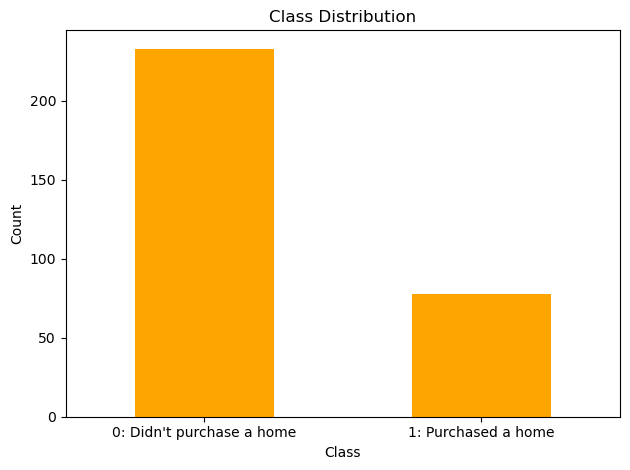

0    233
1     78
Name: home_ownership_class, dtype: int64

0    0.749196
1    0.250804
Name: home_ownership_class, dtype: float64

In [311]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))
# t15 = df.copy()

In [312]:
df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
df_y = df.copy()[['home_ownership_class']]

selector = VarianceThreshold(threshold=0.05)
filtered_data = selector.fit_transform(df_X)

df_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

# display(df_mod)
retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

df_trial = df.copy().drop(columns=filtered_out_columns)

Number of columns: 29
Removed columns: ['gambling', 'loanGSIS', 'houseHasPensioner', 'positiveMonthlyFamilyNetIncome', 'positiveMonthlyFamilyNetIncomeWithSavings', 'positive monthlyFamilyIncome - monthlyExpenses', 'monthlyExpenses / monthlyFamilyIncome', 'monthlyVices / monthlyFamilyIncome', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_CEBU', 'province_COTABATO', 'province_FOREIGN COUNTRY', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_PANGASINAN', 'province_RIZAL', 'province_ZAMBOANGA DEL NORTE', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_NONE', 'job_UNKNOWN']


## Runs: RobustScaler()

In [313]:
scaler = RobustScaler()

In [314]:
t14_adaboost_gs, t14_adaboost_be, t14_adaboost_model_info, t14_adaboost_metrics_df = adaboost_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.37666666666666665
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8335857898316149
Std Train Score (Precision) 0.014338763814710245
GridSearchCV Runtime: 5.853627443313599 secs
Run 1 - Random State: 0
Test Precision: 0.14285714285714285
Run 2 - Random State: 1
Test Precision: 0.4
Run 3 - Random State: 2
Test Precision: 0.5
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precis

In [315]:
t14_dt_gs, t14_dt_be, t14_dt_model_info, t14_dt_metrics_df = dt_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2479 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__max_features': 'log2', 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.4078571428571428
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, max_features='log2',
                                        min_samples_leaf=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 40.251301765441895 secs
Run 1 - Random State: 0
Test Precision: 0.21428571428571427
Run 2 - Random State: 1
Test Precision: 0.4375
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.36363636363636365
Run 5 - Random State: 4
Test Precision: 0.4
Ave Test Precision: 0.3497510822510822
Stdev Test Precision: 0.085202751

In [316]:
t14_logreg_gs, t14_logreg_be, t14_logreg_model_info, t14_logreg_metrics_df = logreg_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4502380952380953
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 30.131038188934326 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.08333333333333333
Run 3 - Random State: 2
Test Precision: 0.35294117647058826
Run 4 - Random State: 3
Test Precision: 0.35294117647058826
Run 5 - Random State: 4
Test Precision: 0.2727272727272727
Ave Test Precision: 0.2623885918003565
Stdev Test Precision: 0.11036382139962794
Ave Test Accuracy: 0.6512820512820513
Stdev Test Accuracy: 0.033185074629602004
Ave Test Spec

In [317]:
t14_knn_gs, t14_knn_be, t14_knn_model_info, t14_knn_metrics_df = knn_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'euclidean', 'classifier__n_neighbors': 14, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.4089393939393939
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='euclidean', n_neighbors=14))])
Mean Train Score (Precision) 0.5048623416427137
Std Train Score (Precision) 0.03423722908682302
GridSearchCV Runtime: 18.63440489768982 secs
Run 1 - Random State: 0
Test Precision: 0.28
Run 2 - Random State: 1
Test Precision: 0.18181818181818182
Run 3 - Random State: 2
Test Precision: 0.3023255813953488
Run 4 - Random State: 3
Test Precision: 0.13333333333333333
Run 5 - Random State: 4
Test Precision: 0.3076923076923077
Ave Test Precision: 0.24103388084783434
Stdev Test Precision: 0.07877861990042198
Ave Test Accuracy: 0.5948717948717949
Stdev Test Accuracy: 0.0570

In [318]:
t14_svm_gs, t14_svm_be, t14_svm_model_info, t14_svm_metrics_df = svm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1.0, 'classifier__kernel': 'rbf', 'classifier__probability': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.485
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(max_iter=1000, probability=True, random_state=0,
                     verbose=True))])
Mean Train Score (Precision) 0.3822515162585949
Std Train Score (Precision) 0.06865009722398586
GridSearchCV Runtime: 21.02470636367798 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.2
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.2
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.4166666666666667
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.14285714285714285
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.3333333333333333
Ave Test Precision: 0.25857142857142856
Stdev Test Precision: 0.11273250099259463
Ave Test Accurac

In [319]:
t14_catboost_gs, t14_catboost_be, t14_catboost_model_info, t14_catboost_metrics_df = catboost_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.00658
0:	learn: 0.6904296	total: 4.1ms	remaining: 4.1s
1:	learn: 0.6875096	total: 7.35ms	remaining: 3.67s
2:	learn: 0.6846705	total: 10.6ms	remaining: 3.51s
3:	learn: 0.6817734	total: 13.7ms	remaining: 3.4s
4:	learn: 0.6801091	total: 17ms	remaining: 3.38s
5:	learn: 0.6761239	total: 20.2ms	remaining: 3.34s
6:	learn: 0.6728354	total: 23.2ms	remaining: 3.29s
7:	learn: 0.6704682	total: 26.5ms	remaining: 3.28s
8:	learn: 0.6682496	total: 31ms	remaining: 3.41s
9:	learn: 0.6658267	total: 34.2ms	remaining: 3.38s
10:	learn: 0.6633543	total: 37.3ms	remaining: 3.36s
11:	learn: 0.6608610	total: 40.9ms	remaining: 3.37s
12:	learn: 0.6589853	total: 44.2ms	remaining: 3.35s
13:	learn: 0.6571081	total: 47.3ms	remaining: 3.33s
14:	learn: 0.6544352	total: 50.4ms	remaining: 3.31s
15:	learn: 0.6518261	total: 53.5ms	remaining: 3.29s
16:	learn: 0.6493535	total: 57.1ms	remaining: 3.3s
17:	learn: 0.6466491	total: 60.1ms	remaining: 3.28s
18:	learn: 0.6447320	total: 63.2ms	remaining: 3.26s
1

In [320]:
t14_lgbm_gs, t14_lgbm_be, t14_lgbm_model_info, t14_lgbm_metrics_df = lgbm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Info] Number of positive: 185, number of negative: 175
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3247
[LightGBM] [Info] Number of data points in the train set: 360, number of used features: 77
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.513889 -> initscore=0.055570
[LightGBM] [Info] Start training from score 0.055570
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [321]:
t14_gbm_gs, t14_gbm_be, t14_gbm_model_info, t14_gbm_metrics_df = gbm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.2799084249084249
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.8251579925250944
Std Train Score (Precision) 0.012373786096080402
GridSearchCV Runtime: 80.40605354309082 secs
Run 1 - Random State: 0
Test Precision: 0.17647058823529413
Run 2 - Random State: 1
Test Precision: 0.23809523809523808
Run 3 - Random State: 2
Test Precision: 0.2558139534

In [322]:
t14_rf_gs, t14_rf_be, t14_rf_model_info, t14_rf_metrics_df = rf_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.46690476190476193
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=2, n_estimators=200,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.562355056684097
Std Train Score (Precision) 0.039125279631558214
GridSearchCV Runtime: 247.85180139541626 secs
Run 1 - Random State: 0
Test Precision: 0.5
Run 2 - Random State: 1
Test Precision: 0.35714285714285715
Run 3 - Random State: 2
Test Precision: 0.35294117647058826

In [323]:
t14_xgb_gs, t14_xgb_be, t14_xgb_model_info, t14_xgb_metrics_df = xgb_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 1, 'classifier__max_depth': 3, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.4066666666666666
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
              

## Results

In [324]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't14_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t14_model_summ)
t14_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t14_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
4,Random Forest,0.375175,0.071696,0.466905,0.562355,0.039125,0.687179,0.034639,0.831034,0.27,0.767716,0.301381,0.466667
3,Decision Tree,0.349751,0.085203,0.407857,NaN,NaN,0.689744,0.029235,0.837931,0.26,0.767314,0.294685,0.458049
6,LightGBM,0.315427,0.087912,0.385952,0.711110,0.027347,0.641026,0.051282,0.748276,0.33,0.763859,0.320570,0.493267
9,CatBoost,0.302448,0.125163,0.342857,0.844231,0.016151,0.697436,0.026585,0.886207,0.15,0.751707,0.198715,0.352764
8,AdaBoost,0.298571,0.147634,0.376667,0.833586,0.014339,0.715385,0.024661,0.941379,0.06,0.743758,0.097663,0.234968
7,Extreme Gradient Boosting (XGBoost),0.294872,0.097979,0.406667,0.790173,0.016957,0.669231,0.045689,0.831034,0.20,0.750649,0.235896,0.401267
2,Logistic Regression,0.262389,0.110364,0.450238,NaN,NaN,0.651282,0.033185,0.800000,0.22,0.749106,0.236873,0.401895
1,SVM Classifier,0.258571,0.112733,0.485000,0.382252,0.068650,0.694872,0.021066,0.886207,0.14,0.750248,0.172473,0.319976
0,k-Nearest Neighbors,0.241034,0.078779,0.408939,0.504862,0.034237,0.594872,0.057048,0.696552,0.30,0.747427,0.254199,0.422493
5,Gradient Boosting Machine (GBM),0.239248,0.037660,0.279908,0.825158,0.012374,0.558974,0.054090,0.631034,0.35,0.739049,0.277899,0.449747


In [325]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t14_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.715385,AdaBoost
Highest Test G-mean,0.493267,LightGBM
Highest Test Recall,0.350000,Gradient Boosting Machine (GBM)
Highest Test Precision,0.375175,Random Forest
Highest Test Specificity,0.941379,AdaBoost
Highest Test F1-score,0.320570,LightGBM


# HO_T17: Yes - 1, 4, 20-23 (20k, 50k, 75k, 100k), 30, 31 (0.15)

In [335]:
df = dataset.copy().drop(columns=cols_with_nulls)
df = df[df['positiveMonthlyFamilyNetIncome'] != 0]
# df_num = df.drop(columns=['gender', 'province', 'job'])
df = pd.get_dummies(df, columns=['gender'], prefix='gender', drop_first='True')
df = pd.get_dummies(df, columns=['province'], prefix='province', drop_first='True')
df = pd.get_dummies(df, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']

# Binning basicMonthlySalary
df['salary_bin'] = pd.cut(df['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
df['basicMonthlySalary_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlyFamilyIncome
df['salary_bin'] = pd.cut(df['monthlyFamilyIncome'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyFamilyIncome_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlySoloNetIncome
df['salary_bin'] = pd.cut(df['monthlySoloNetIncome'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlySoloNetIncome_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlyFamilyNetIncome
df['salary_bin'] = pd.cut(df['monthlyFamilyNetIncome'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyFamilyNetIncome_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

df.loc[df['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# df.isna().sum()[df.isna().sum() > 0]
# df = t11

## EDA on Dataset

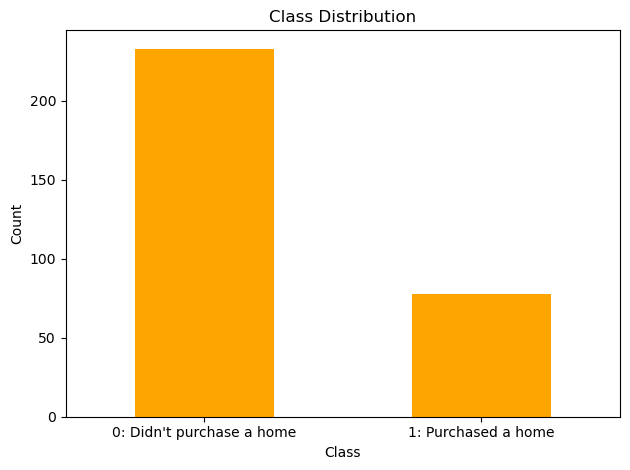

0    233
1     78
Name: home_ownership_class, dtype: int64

0    0.749196
1    0.250804
Name: home_ownership_class, dtype: float64

In [336]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))
# t15 = df.copy()

In [337]:
df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
df_y = df.copy()[['home_ownership_class']]

selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(df_X)

df_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

# display(df_mod)
retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

df_trial = df.copy().drop(columns=filtered_out_columns)

Number of columns: 41
Removed columns: ['gambling', 'loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'positiveMonthlyFamilyNetIncome', 'positiveMonthlyFamilyNetIncomeWithSavings', 'positive monthlyFamilyIncome - monthlyExpenses', 'monthlyExpenses / monthlyFamilyIncome', 'monthlyVices / monthlyFamilyIncome', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_BULACAN', 'province_CEBU', 'province_COTABATO', 'province_FOREIGN COUNTRY', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_PANGASINAN', 'province_RIZAL', 'province_UNKNOWN', 'province_ZAMBOANGA DEL NORTE', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_MACHINE OPERATOR', 'job_MANAGER', 'job_NONE', 'job_PROFESIONAL', 'job_UNKNOWN']


## Runs: RobustScaler()

In [338]:
scaler = RobustScaler()

In [339]:
t14_adaboost_gs, t14_adaboost_be, t14_adaboost_model_info, t14_adaboost_metrics_df = adaboost_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.45
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8376859718077105
Std Train Score (Precision) 0.01231624168131484
GridSearchCV Runtime: 6.459640741348267 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.5
Run 4 - Random State: 3
Test Prec

In [340]:
t14_dt_gs, t14_dt_be, t14_dt_model_info, t14_dt_metrics_df = dt_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2370 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__max_features': 'log2', 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.4333333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, max_features='log2',
                                        min_samples_leaf=2, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 29.019835710525513 secs
Run 1 - Random State: 0
Test Precision: 0.42857142857142855
Run 2 - Random State: 1
Test Precision: 0.2631578947368421
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.25
Run 5 - Random State: 4
Test Precision: 0.14285714285714285
Ave Test Precision: 0.2835839598997493
Stdev Test Precision

In [341]:
t14_logreg_gs, t14_logreg_be, t14_logreg_model_info, t14_logreg_metrics_df = logreg_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4502380952380953
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 23.25379490852356 secs
Run 1 - Random State: 0
Test Precision: 0.18181818181818182
Run 2 - Random State: 1
Test Precision: 0.07692307692307693
Run 3 - Random State: 2
Test Precision: 0.35294117647058826
Run 4 - Random State: 3
Test Precision: 0.35294117647058826
Run 5 - Random State: 4
Test Precision: 0.2727272727272727
Ave Test Precision: 0.24747017688194162
Stdev Test Precision: 0.11861985727443336
Ave Test Accuracy: 0.6461538461538462
Stdev Test Accuracy: 0.03580574370197166

In [342]:
t14_knn_gs, t14_knn_be, t14_knn_model_info, t14_knn_metrics_df = knn_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'chebyshev', 'classifier__n_neighbors': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.4083333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='chebyshev', n_neighbors=2))])
Mean Train Score (Precision) 0.5120186283478366
Std Train Score (Precision) 0.034839450332617795
GridSearchCV Runtime: 14.97712516784668 secs
Run 1 - Random State: 0
Test Precision: 0.1
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.4117647058823529
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.23076923076923078
Ave Test Precision: 0.19850678733031674
Stdev Test Precision: 0.1567481162559738
Ave Test Accuracy: 0.658974358974359
Stdev Test Accuracy: 0.02658518122221503
Ave Test Specificity

In [343]:
t14_svm_gs, t14_svm_be, t14_svm_model_info, t14_svm_metrics_df = svm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1000.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4866666666666667
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(C=1000.0, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.3807684107497512
Std Train Score (Precision) 0.06558753730199235
GridSearchCV Runtime: 13.942491054534912 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.16666666666666666
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.3333333333333333
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.375
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.2727272727272727
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.35294117647058826
Ave Test Precision: 0.300133689839572

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [344]:
t14_catboost_gs, t14_catboost_be, t14_catboost_model_info, t14_catboost_metrics_df = catboost_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.00658
0:	learn: 0.6901372	total: 2.44ms	remaining: 2.44s
1:	learn: 0.6878908	total: 4.46ms	remaining: 2.22s
2:	learn: 0.6843203	total: 6.7ms	remaining: 2.23s
3:	learn: 0.6812107	total: 8.83ms	remaining: 2.2s
4:	learn: 0.6785649	total: 11.3ms	remaining: 2.24s
5:	learn: 0.6762793	total: 13.3ms	remaining: 2.2s
6:	learn: 0.6737955	total: 15.6ms	remaining: 2.22s
7:	learn: 0.6703516	total: 18.1ms	remaining: 2.24s
8:	learn: 0.6676816	total: 20.4ms	remaining: 2.24s
9:	learn: 0.6647993	total: 22.7ms	remaining: 2.24s
10:	learn: 0.6619947	total: 25.4ms	remaining: 2.29s
11:	learn: 0.6585354	total: 27.8ms	remaining: 2.29s
12:	learn: 0.6558235	total: 30.1ms	remaining: 2.28s
13:	learn: 0.6523729	total: 32.2ms	remaining: 2.27s
14:	learn: 0.6496675	total: 34.5ms	remaining: 2.27s
15:	learn: 0.6472710	total: 36.9ms	remaining: 2.27s
16:	learn: 0.6450633	total: 39.2ms	remaining: 2.27s
17:	learn: 0.6422311	total: 41.7ms	remaining: 2.27s
18:	learn: 0.6400718	total: 43.9ms	remaining: 2.

In [345]:
t14_lgbm_gs, t14_lgbm_be, t14_lgbm_model_info, t14_lgbm_metrics_df = lgbm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 58, number of negative: 94
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001705 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1054
[LightGBM] [Info] Number of data points in the train set: 152, number of used features: 65
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.381579 -> initscore=-0.482852
[LightGBM] [Info] Start training from score -0

In [346]:
t14_gbm_gs, t14_gbm_be, t14_gbm_model_info, t14_gbm_metrics_df = gbm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.27976190476190477
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.8290336837343428
Std Train Score (Precision) 0.012071171004446971
GridSearchCV Runtime: 70.07115817070007 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.14285714285714285
Run 3 - Random State: 2
Test Precision: 0.16666666666666666
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random St

In [347]:
t14_rf_gs, t14_rf_be, t14_rf_model_info, t14_rf_metrics_df = rf_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4502380952380952
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.5629844050969114
Std Train Score (Precision) 0.04107736544499146
GridSearchCV Runtime: 198.99936366081238 secs
Run 1 - Random State: 0
Test Precision: 0.4
Run 2 - Random State: 1
Test Precision: 0.375
Run 3 - Random State: 2
Test Precision: 0.38095238095238093
Run 4 - Random State: 3
Test Precision

In [348]:
t14_xgb_gs, t14_xgb_be, t14_xgb_model_info, t14_xgb_metrics_df = xgb_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.3785714285714285
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
   

## Results

In [349]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't14_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t14_model_summ)
t14_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t14_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
4,Random Forest,0.363256,0.033969,0.450238,0.562984,0.041077,0.684615,0.029515,0.820690,0.29,0.771395,0.306690,0.471592
6,LightGBM,0.341169,0.062848,0.401667,0.713202,0.029064,0.651282,0.036712,0.737931,0.40,0.782361,0.364991,0.536049
8,AdaBoost,0.340000,0.158815,0.450000,0.837686,0.012316,0.717949,0.023985,0.934483,0.09,0.748670,0.137100,0.279010
9,CatBoost,0.329687,0.113302,0.320833,0.848688,0.015107,0.697436,0.040135,0.882759,0.16,0.752808,0.212429,0.369775
1,SVM Classifier,0.300134,0.083756,0.486667,0.380768,0.065588,0.697436,0.019443,0.886207,0.15,0.752003,0.192586,0.348352
3,Decision Tree,0.283584,0.105884,0.433333,NaN,NaN,0.679487,0.053632,0.865517,0.14,0.744389,0.177302,0.335057
7,Extreme Gradient Boosting (XGBoost),0.260612,0.075254,0.378571,0.794332,0.017475,0.602564,0.054393,0.693103,0.34,0.756865,0.284311,0.456531
2,Logistic Regression,0.247470,0.118620,0.450238,NaN,NaN,0.646154,0.035806,0.796552,0.21,0.746004,0.224800,0.388399
5,Gradient Boosting Machine (GBM),0.225714,0.080924,0.279762,0.829034,0.012071,0.656410,0.029235,0.834483,0.14,0.737779,0.172255,0.336995
0,k-Nearest Neighbors,0.198507,0.156748,0.408333,0.512019,0.034839,0.658974,0.026585,0.834483,0.15,0.741236,0.169817,0.298866


In [350]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t14_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.717949,AdaBoost
Highest Test G-mean,0.536049,LightGBM
Highest Test Recall,0.400000,LightGBM
Highest Test Precision,0.363256,Random Forest
Highest Test Specificity,0.934483,AdaBoost
Highest Test F1-score,0.364991,LightGBM


# HO_T18: Yes - 1, 4, 20-27 (20k, 50k, 75k, 100k), 30, 31 (0.15)

In [351]:
df = dataset.copy().drop(columns=cols_with_nulls)
df = df[df['positiveMonthlyFamilyNetIncome'] != 0]
# df_num = df.drop(columns=['gender', 'province', 'job'])
df = pd.get_dummies(df, columns=['gender'], prefix='gender', drop_first='True')
df = pd.get_dummies(df, columns=['province'], prefix='province', drop_first='True')
df = pd.get_dummies(df, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']

# Binning basicMonthlySalary
df['salary_bin'] = pd.cut(df['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
df['basicMonthlySalary_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlyFamilyIncome
df['salary_bin'] = pd.cut(df['monthlyFamilyIncome'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyFamilyIncome_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlySoloNetIncome
df['salary_bin'] = pd.cut(df['monthlySoloNetIncome'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlySoloNetIncome_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlyFamilyNetIncome
df['salary_bin'] = pd.cut(df['monthlyFamilyNetIncome'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyFamilyNetIncome_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlySoloNetIncomeWithSavings
df['salary_bin'] = pd.cut(df['monthlySoloNetIncomeWithSavings'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlySoloNetIncomeWithSavings_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlyFamilyNetIncomeWithSavings
df['salary_bin'] = pd.cut(df['monthlyFamilyNetIncomeWithSavings'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyFamilyNetIncomeWithSavings_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlyExpenses
df['salary_bin'] = pd.cut(df['monthlyExpenses'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyExpenses_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlyVices
df['salary_bin'] = pd.cut(df['monthlyVices'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyVices_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])


df.loc[df['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# df.isna().sum()[df.isna().sum() > 0]
# df = t11

## EDA on Dataset

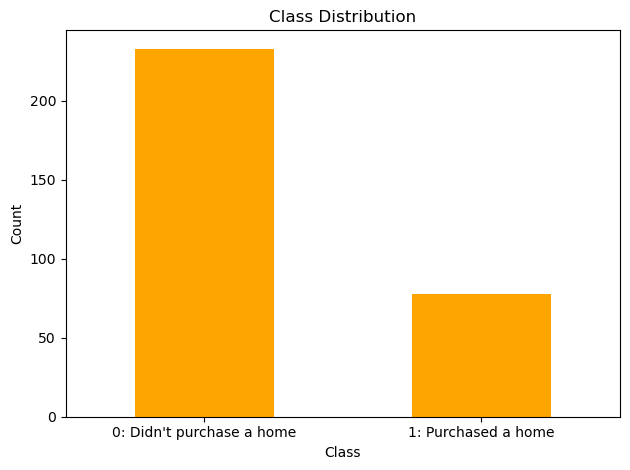

0    233
1     78
Name: home_ownership_class, dtype: int64

0    0.749196
1    0.250804
Name: home_ownership_class, dtype: float64

In [352]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))
# t15 = df.copy()

In [353]:
df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
df_y = df.copy()[['home_ownership_class']]

selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(df_X)

df_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

# display(df_mod)
retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

df_trial = df.copy().drop(columns=filtered_out_columns)

Number of columns: 42
Removed columns: ['gambling', 'loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'positiveMonthlyFamilyNetIncome', 'positiveMonthlyFamilyNetIncomeWithSavings', 'positive monthlyFamilyIncome - monthlyExpenses', 'monthlyExpenses / monthlyFamilyIncome', 'monthlyVices / monthlyFamilyIncome', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_BULACAN', 'province_CEBU', 'province_COTABATO', 'province_FOREIGN COUNTRY', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_PANGASINAN', 'province_RIZAL', 'province_UNKNOWN', 'province_ZAMBOANGA DEL NORTE', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_MACHINE OPERATOR', 'job_MANAGER', 'job_NONE', 'job_PROFESIONAL', 'job_UNKNOWN', 'monthlyVices_bin_encoded'

## Runs: RobustScaler()

In [354]:
scaler = RobustScaler()

In [355]:
t14_adaboost_gs, t14_adaboost_be, t14_adaboost_model_info, t14_adaboost_metrics_df = adaboost_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.4
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8357531054079097
Std Train Score (Precision) 0.01244916875593538
GridSearchCV Runtime: 8.219112634658813 secs
Run 1 - Random State: 0
Test Precision: 0.18181818181818182
Run 2 - Random State: 1
Test Precision: 0.18181818181818182
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 3
Test Precision: 0.25
Run 5 - Random State: 4
Test Precision: 0.5714285714285714

In [356]:
t14_dt_gs, t14_dt_be, t14_dt_model_info, t14_dt_metrics_df = dt_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2004 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__max_features': 'log2', 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.45999999999999996
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, max_features='log2',
                                        min_samples_leaf=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 90.82394552230835 secs
Run 1 - Random State: 0
Test Precision: 0.09090909090909091
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.36363636363636365
Run 4 - Random State: 3
Test Precision: 0.16666666666666666
Run 5 - Random State: 4
Test Precision: 0.375
Ave Test Precision: 0.26590909090909093
Stdev Test Precis

In [357]:
t14_logreg_gs, t14_logreg_be, t14_logreg_model_info, t14_logreg_metrics_df = logreg_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.0001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4619047619047619
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.0001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 51.61289572715759 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.07142857142857142
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.4117647058823529
Run 5 - Random State: 4
Test Precision: 0.23809523809523808
Ave Test Precision: 0.2609243697478991
Stdev Test Precision: 0.1270285732618398
Ave Test Accuracy: 0.6461538461538462
Stdev Test Accuracy: 0.048481206156894975
Ave Test Speci

In [358]:
t14_knn_gs, t14_knn_be, t14_knn_model_info, t14_knn_metrics_df = knn_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'canberra', 'classifier__n_neighbors': 14, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4261904761904762
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 KNeighborsClassifier(metric='canberra', n_neighbors=14))])
Mean Train Score (Precision) 0.5122528662363366
Std Train Score (Precision) 0.033348039254223444
GridSearchCV Runtime: 46.8005166053772 secs
Run 1 - Random State: 0
Test Precision: 0.3333333333333333
Run 2 - Random State: 1
Test Precision: 0.3
Run 3 - Random State: 2
Test Precision: 0.4166666666666667
Run 4 - Random State: 3
Test Precision: 0.42105263157894735
Run 5 - Random State: 4
Test Precision: 0.5
Ave Test Precision: 0.39421052631578946
Stdev Test Precision: 0.0790535348528456
Ave Test Accuracy: 0.7128205128205128
Stdev Test Accuracy: 0.019443270369362955
Ave Test Specificity: 0

In [359]:
t14_svm_gs, t14_svm_be, t14_svm_model_info, t14_svm_metrics_df = svm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1e-05, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.49857142857142855
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(C=1e-05, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.38135580390591106
Std Train Score (Precision) 0.06745698250139444
GridSearchCV Runtime: 39.025861501693726 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.25
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.09090909090909091
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.4
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.2727272727272727
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.3
Ave Test Precision: 0.26272727272727275
Stdev Test Precision: 0.1

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [360]:
t14_catboost_gs, t14_catboost_be, t14_catboost_model_info, t14_catboost_metrics_df = catboost_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.006684
0:	learn: 0.6908074	total: 4.12ms	remaining: 4.12s
1:	learn: 0.6872521	total: 6.95ms	remaining: 3.47s
2:	learn: 0.6840834	total: 10ms	remaining: 3.33s
3:	learn: 0.6812065	total: 12.7ms	remaining: 3.16s
4:	learn: 0.6776325	total: 15.5ms	remaining: 3.09s
5:	learn: 0.6751265	total: 18.2ms	remaining: 3.01s
6:	learn: 0.6719139	total: 21ms	remaining: 2.98s
7:	learn: 0.6697128	total: 23.8ms	remaining: 2.95s
8:	learn: 0.6664759	total: 26.6ms	remaining: 2.92s
9:	learn: 0.6631993	total: 29.1ms	remaining: 2.88s
10:	learn: 0.6606481	total: 31.4ms	remaining: 2.83s
11:	learn: 0.6578663	total: 34.1ms	remaining: 2.81s
12:	learn: 0.6545243	total: 36.5ms	remaining: 2.77s
13:	learn: 0.6515825	total: 38.9ms	remaining: 2.74s
14:	learn: 0.6492477	total: 41.4ms	remaining: 2.72s
15:	learn: 0.6468650	total: 43.8ms	remaining: 2.69s
16:	learn: 0.6442979	total: 46.2ms	remaining: 2.67s
17:	learn: 0.6417469	total: 48.7ms	remaining: 2.66s
18:	learn: 0.6386470	total: 51.2ms	remaining: 2.

In [361]:
t14_lgbm_gs, t14_lgbm_be, t14_lgbm_model_info, t14_lgbm_metrics_df = lgbm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 188, number of negative: 175
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3340
[LightGBM] [Info] Number of data points in the train set: 363, number of used features: 70
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.517906 -> initscore=0.071656
[LightGBM] [Info] Start training from score 0.071656
[LightGBM] [Warning] No further splits with positive gai

In [362]:
t14_gbm_gs, t14_gbm_be, t14_gbm_model_info, t14_gbm_metrics_df = gbm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.2869047619047619
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=2,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.8305434277977668
Std Train Score (Precision) 0.011343175057969725
GridSearchCV Runtime: 65.77399492263794 secs
Run 1 - Random State: 0
Test Precision: 0.23076923076923078
Run 2 - Random State: 1
Test Precision: 0.3
Run 3 - Random State: 2
Test Precision: 0.375
Run 4 - Random State: 3
Test Precision: 0.25
Run 5 - Random State: 4
Test Precision: 0.307692

In [363]:
t14_rf_gs, t14_rf_be, t14_rf_model_info, t14_rf_metrics_df = rf_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.45999999999999996
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=300, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.5590617578899036
Std Train Score (Precision) 0.036605408961728286
GridSearchCV Runtime: 200.77506756782532 secs
Run 1 - Random State: 0
Test Precision: 0.42857142857142855
Run 2 - Random State: 1
Test Precision: 0.3
Run 3 - Random State: 2
Test Precision: 0.4375
Run 4 - Random State: 3
Test Precis

In [364]:
t14_xgb_gs, t14_xgb_be, t14_xgb_model_info, t14_xgb_metrics_df = xgb_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits


Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.38690476190476186
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, learni

## Results

In [365]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't14_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t14_model_summ)
t14_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t14_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
9,CatBoost,0.396154,0.115420,0.371667,0.848551,0.013619,0.710256,0.038032,0.882759,0.21,0.763921,0.272673,0.429179
0,k-Nearest Neighbors,0.394211,0.079054,0.426190,0.512253,0.033348,0.712821,0.019443,0.875862,0.24,0.770474,0.292597,0.449209
4,Random Forest,0.379881,0.060504,0.460000,0.559062,0.036605,0.700000,0.029515,0.851724,0.26,0.770119,0.299086,0.459875
6,LightGBM,0.341694,0.064028,0.398373,0.714606,0.029222,0.661538,0.038032,0.775862,0.33,0.770557,0.332569,0.503066
5,Gradient Boosting Machine (GBM),0.292692,0.056369,0.286905,0.830543,0.011343,0.687179,0.023290,0.872414,0.15,0.748462,0.196277,0.359243
8,AdaBoost,0.287013,0.162607,0.400000,0.835753,0.012449,0.700000,0.044963,0.906897,0.10,0.744764,0.144205,0.290461
3,Decision Tree,0.265909,0.128910,0.460000,NaN,NaN,0.669231,0.056903,0.851724,0.14,0.741009,0.180332,0.338640
7,Extreme Gradient Boosting (XGBoost),0.265440,0.118961,0.386905,0.795279,0.016373,0.623077,0.054090,0.720690,0.34,0.764018,0.291682,0.458023
1,SVM Classifier,0.262727,0.111822,0.498571,0.381356,0.067457,0.669231,0.033185,0.837931,0.18,0.748388,0.208756,0.368588
2,Logistic Regression,0.260924,0.127029,0.461905,NaN,NaN,0.646154,0.048481,0.793103,0.22,0.747189,0.236879,0.400880


In [366]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t14_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.712821,k-Nearest Neighbors
Highest Test G-mean,0.503066,LightGBM
Highest Test Recall,0.340000,Extreme Gradient Boosting (XGBoost)
Highest Test Precision,0.396154,CatBoost
Highest Test Specificity,0.906897,AdaBoost
Highest Test F1-score,0.332569,LightGBM


# HO_T19: Yes - 1, 4, 20-23 (20k, 50k, 75k, 100k), 30, 31 (0.05)

In [368]:
df = dataset.copy().drop(columns=cols_with_nulls)
df = df[df['positiveMonthlyFamilyNetIncome'] != 0]
# df_num = df.drop(columns=['gender', 'province', 'job'])
df = pd.get_dummies(df, columns=['gender'], prefix='gender', drop_first='True')
df = pd.get_dummies(df, columns=['province'], prefix='province', drop_first='True')
df = pd.get_dummies(df, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']

# Binning basicMonthlySalary
df['salary_bin'] = pd.cut(df['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
df['basicMonthlySalary_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlyFamilyIncome
df['salary_bin'] = pd.cut(df['monthlyFamilyIncome'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyFamilyIncome_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlySoloNetIncome
df['salary_bin'] = pd.cut(df['monthlySoloNetIncome'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlySoloNetIncome_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlyFamilyNetIncome
df['salary_bin'] = pd.cut(df['monthlyFamilyNetIncome'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyFamilyNetIncome_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

df.loc[df['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# df.isna().sum()[df.isna().sum() > 0]
# df = t11

## EDA on Dataset

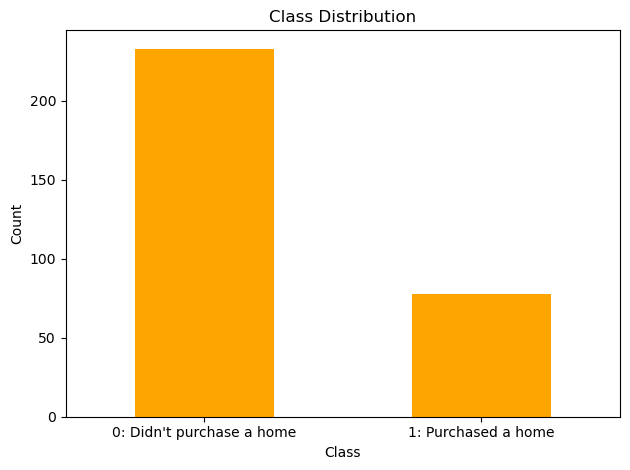

0    233
1     78
Name: home_ownership_class, dtype: int64

0    0.749196
1    0.250804
Name: home_ownership_class, dtype: float64

In [369]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))
# t15 = df.copy()

In [370]:
df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
df_y = df.copy()[['home_ownership_class']]

selector = VarianceThreshold(threshold=0.05)
filtered_data = selector.fit_transform(df_X)

df_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

# display(df_mod)
retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

df_trial = df.copy().drop(columns=filtered_out_columns)

Number of columns: 29
Removed columns: ['gambling', 'loanGSIS', 'houseHasPensioner', 'positiveMonthlyFamilyNetIncome', 'positiveMonthlyFamilyNetIncomeWithSavings', 'positive monthlyFamilyIncome - monthlyExpenses', 'monthlyExpenses / monthlyFamilyIncome', 'monthlyVices / monthlyFamilyIncome', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_CEBU', 'province_COTABATO', 'province_FOREIGN COUNTRY', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_PANGASINAN', 'province_RIZAL', 'province_ZAMBOANGA DEL NORTE', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_NONE', 'job_UNKNOWN']


## Runs: RobustScaler()

In [371]:
scaler = RobustScaler()

In [372]:
t14_adaboost_gs, t14_adaboost_be, t14_adaboost_model_info, t14_adaboost_metrics_df = adaboost_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.36666666666666664
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8324290800048987
Std Train Score (Precision) 0.011768615484772317
GridSearchCV Runtime: 7.575450897216797 secs
Run 1 - Random State: 0
Test Precision: 0.1111111111111111
Run 2 - Random State: 1
Test Precision: 0.3
Run 3 - Random State: 2
Test Precision: 0.42857142857142855
Run 4 - Random State: 3
T

In [373]:
t14_dt_gs, t14_dt_be, t14_dt_model_info, t14_dt_metrics_df = dt_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2365 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__max_features': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4046153846153846
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=2,
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 32.22062540054321 secs
Run 1 - Random State: 0
Test Precision: 1.0
Run 2 - Random State: 1
Test Precision: 0.24390243902439024
Run 3 - Random State: 2
Test Precision: 0.2647058823529412
Run 4 - Random State: 3
Test Precision: 0.23529411764705882
Run 5 - Random State: 4
Test Precision: 0.5
Ave Test Precision: 0.4487804878048781
Stdev Test Pre

In [374]:
t14_logreg_gs, t14_logreg_be, t14_logreg_model_info, t14_logreg_metrics_df = logreg_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4502380952380953
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 25.064600229263306 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.08333333333333333
Run 3 - Random State: 2
Test Precision: 0.35294117647058826
Run 4 - Random State: 3
Test Precision: 0.35294117647058826
Run 5 - Random State: 4
Test Precision: 0.2727272727272727
Ave Test Precision: 0.2623885918003565
Stdev Test Precision: 0.11036382139962794
Ave Test Accuracy: 0.6512820512820513
Stdev Test Accuracy: 0.033185074629602004
Ave Test Spec

In [375]:
t14_knn_gs, t14_knn_be, t14_knn_model_info, t14_knn_metrics_df = knn_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'hamming', 'classifier__n_neighbors': 14, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.4242757242757243
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='hamming', n_neighbors=14))])
Mean Train Score (Precision) 0.5040583120847697
Std Train Score (Precision) 0.034312459844120825
GridSearchCV Runtime: 17.482007026672363 secs
Run 1 - Random State: 0
Test Precision: 0.29545454545454547
Run 2 - Random State: 1
Test Precision: 0.19230769230769232
Run 3 - Random State: 2
Test Precision: 0.3548387096774194
Run 4 - Random State: 3
Test Precision: 0.4375
Run 5 - Random State: 4
Test Precision: 0.32142857142857145
Ave Test Precision: 0.3203059037736457
Stdev Test Precision: 0.08934394692052498
Ave Test Accuracy: 0.6025641025641025
Stdev Test Accuracy: 0.0810

In [376]:
t14_svm_gs, t14_svm_be, t14_svm_model_info, t14_svm_metrics_df = svm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1.0, 'classifier__kernel': 'rbf', 'classifier__probability': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.485
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(max_iter=1000, probability=True, random_state=0,
                     verbose=True))])
Mean Train Score (Precision) 0.38558538031625755
Std Train Score (Precision) 0.07121199425455575
GridSearchCV Runtime: 16.76275658607483 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.2
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.2
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.4166666666666667
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.14285714285714285
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.3333333333333333
Ave Test Precision: 0.25857142857142856
Stdev Test Precision: 0.11273250099259463
Ave Test Accura

In [377]:
t14_catboost_gs, t14_catboost_be, t14_catboost_model_info, t14_catboost_metrics_df = catboost_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.00658
0:	learn: 0.6896331	total: 3.23ms	remaining: 3.23s
1:	learn: 0.6872597	total: 5.59ms	remaining: 2.79s
2:	learn: 0.6837895	total: 8.54ms	remaining: 2.84s
3:	learn: 0.6813633	total: 10.9ms	remaining: 2.71s
4:	learn: 0.6787990	total: 13.4ms	remaining: 2.66s
5:	learn: 0.6764514	total: 16ms	remaining: 2.66s
6:	learn: 0.6737395	total: 18.6ms	remaining: 2.64s
7:	learn: 0.6712649	total: 20.3ms	remaining: 2.52s
8:	learn: 0.6685972	total: 22.5ms	remaining: 2.48s
9:	learn: 0.6660374	total: 24.4ms	remaining: 2.42s
10:	learn: 0.6639114	total: 26.4ms	remaining: 2.38s
11:	learn: 0.6615975	total: 28.9ms	remaining: 2.38s
12:	learn: 0.6594391	total: 30.9ms	remaining: 2.35s
13:	learn: 0.6574251	total: 33ms	remaining: 2.33s
14:	learn: 0.6558384	total: 34.9ms	remaining: 2.29s
15:	learn: 0.6534969	total: 36.8ms	remaining: 2.26s
16:	learn: 0.6510928	total: 38.9ms	remaining: 2.25s
17:	learn: 0.6494400	total: 41.1ms	remai

In [378]:
t14_lgbm_gs, t14_lgbm_be, t14_lgbm_model_info, t14_lgbm_metrics_df = lgbm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Info] Number of positive: 58, number of negative: 88
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1031
[LightGBM] [Info] Number of data points in the train set: 146, number of used features: 67
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.397260 -> initscore=-0.416894
[LightGBM] [Info] Start training from score -0.416894
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

In [379]:
t14_gbm_gs, t14_gbm_be, t14_gbm_model_info, t14_gbm_metrics_df = gbm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.276969696969697
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8250767482865262
Std Train Score (Precision) 0.010746909977159843
GridSearchCV Runtime: 64.45045495033264 secs
Run 1 - Random State: 0
Test Precision: 0.23333333333333334
Run 2 - Random State: 1
Test Precision: 0.16129032258064516
Run 3 - Random State: 2
Test Precision: 0.3157894736842105
Run 4 - Random State: 3
Test Precision:

In [380]:
t14_rf_gs, t14_rf_be, t14_rf_model_info, t14_rf_metrics_df = rf_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.45714285714285713
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=2, n_estimators=200,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.563080684323261
Std Train Score (Precision) 0.042321488479577014
GridSearchCV Runtime: 218.26327252388 secs
Run 1 - Random State: 0
Test Precision: 0.375
Run 2 - Random State: 1
Test Precision: 0.4
Run 3 - Random State: 2
Test Precision: 0.3684210526315789
Run 4 - Random St

In [381]:
t14_xgb_gs, t14_xgb_be, t14_xgb_model_info, t14_xgb_metrics_df = xgb_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.385
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                      

## Results

In [382]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't14_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t14_model_summ)
t14_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t14_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
3,Decision Tree,0.448780,0.327071,0.404615,NaN,NaN,0.587179,0.181626,0.658621,0.38,0.760019,0.276349,0.386054
4,Random Forest,0.372957,0.017156,0.457143,0.563081,0.042321,0.692308,0.018131,0.831034,0.29,0.772947,0.319883,0.484090
0,k-Nearest Neighbors,0.320306,0.089344,0.424276,0.504058,0.034312,0.602564,0.081084,0.655172,0.45,0.776898,0.363781,0.528714
7,Extreme Gradient Boosting (XGBoost),0.317659,0.085589,0.385000,0.790532,0.016689,0.692308,0.030067,0.875862,0.16,0.751465,0.207943,0.369309
6,LightGBM,0.290121,0.079868,0.397143,0.710816,0.026418,0.607692,0.067597,0.682759,0.39,0.766846,0.324775,0.496742
8,AdaBoost,0.284603,0.116871,0.366667,0.832429,0.011769,0.692308,0.032686,0.889655,0.12,0.745525,0.166507,0.321121
9,CatBoost,0.263333,0.103010,0.400000,0.842619,0.014166,0.705128,0.012821,0.913793,0.10,0.746759,0.142149,0.287084
2,Logistic Regression,0.262389,0.110364,0.450238,NaN,NaN,0.651282,0.033185,0.800000,0.22,0.749106,0.236873,0.401895
1,SVM Classifier,0.258571,0.112733,0.485000,0.385585,0.071212,0.694872,0.021066,0.886207,0.14,0.750248,0.172473,0.319976
5,Gradient Boosting Machine (GBM),0.253194,0.062271,0.276970,0.825077,0.010747,0.546154,0.044040,0.593103,0.41,0.747295,0.311091,0.484116


In [383]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t14_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.705128,CatBoost
Highest Test G-mean,0.528714,k-Nearest Neighbors
Highest Test Recall,0.450000,k-Nearest Neighbors
Highest Test Precision,0.448780,Decision Tree
Highest Test Specificity,0.913793,CatBoost
Highest Test F1-score,0.363781,k-Nearest Neighbors


# HO_T20: Yes - 1, 4, 20-27 (20k, 50k, 75k, 100k), 30, 31 (0.05)

In [384]:
df = dataset.copy().drop(columns=cols_with_nulls)
df = df[df['positiveMonthlyFamilyNetIncome'] != 0]
# df_num = df.drop(columns=['gender', 'province', 'job'])
df = pd.get_dummies(df, columns=['gender'], prefix='gender', drop_first='True')
df = pd.get_dummies(df, columns=['province'], prefix='province', drop_first='True')
df = pd.get_dummies(df, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']

# Binning basicMonthlySalary
df['salary_bin'] = pd.cut(df['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
df['basicMonthlySalary_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlyFamilyIncome
df['salary_bin'] = pd.cut(df['monthlyFamilyIncome'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyFamilyIncome_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlySoloNetIncome
df['salary_bin'] = pd.cut(df['monthlySoloNetIncome'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlySoloNetIncome_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlyFamilyNetIncome
df['salary_bin'] = pd.cut(df['monthlyFamilyNetIncome'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyFamilyNetIncome_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlySoloNetIncomeWithSavings
df['salary_bin'] = pd.cut(df['monthlySoloNetIncomeWithSavings'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlySoloNetIncomeWithSavings_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlyFamilyNetIncomeWithSavings
df['salary_bin'] = pd.cut(df['monthlyFamilyNetIncomeWithSavings'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyFamilyNetIncomeWithSavings_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlyExpenses
df['salary_bin'] = pd.cut(df['monthlyExpenses'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyExpenses_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# Binning monthlyVices
df['salary_bin'] = pd.cut(df['monthlyVices'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyVices_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])


df.loc[df['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# df.isna().sum()[df.isna().sum() > 0]
# df = t11

## EDA on Dataset

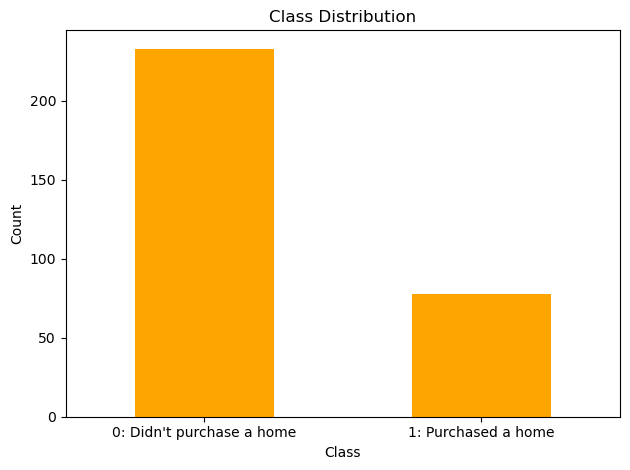

0    233
1     78
Name: home_ownership_class, dtype: int64

0    0.749196
1    0.250804
Name: home_ownership_class, dtype: float64

In [385]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))
# t15 = df.copy()

In [386]:
df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
df_y = df.copy()[['home_ownership_class']]

selector = VarianceThreshold(threshold=0.05)
filtered_data = selector.fit_transform(df_X)

df_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

# display(df_mod)
retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

df_trial = df.copy().drop(columns=filtered_out_columns)

Number of columns: 30
Removed columns: ['gambling', 'loanGSIS', 'houseHasPensioner', 'positiveMonthlyFamilyNetIncome', 'positiveMonthlyFamilyNetIncomeWithSavings', 'positive monthlyFamilyIncome - monthlyExpenses', 'monthlyExpenses / monthlyFamilyIncome', 'monthlyVices / monthlyFamilyIncome', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_CEBU', 'province_COTABATO', 'province_FOREIGN COUNTRY', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_PANGASINAN', 'province_RIZAL', 'province_ZAMBOANGA DEL NORTE', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_NONE', 'job_UNKNOWN', 'monthlyVices_bin_encoded']


## Runs: RobustScaler()

In [387]:
scaler = RobustScaler()

In [388]:
t14_adaboost_gs, t14_adaboost_be, t14_adaboost_model_info, t14_adaboost_metrics_df = adaboost_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.30798476033770145
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8326551732392827
Std Train Score (Precision) 0.013511462818468028
GridSearchCV Runtime: 8.017586469650269 secs
Run 1 - Random State: 0
Test Precision: 0.2413793103448276
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.41379310344827586
Run 4 - Random State: 3
Test Precision: 0.22580

In [389]:
t14_dt_gs, t14_dt_be, t14_dt_model_info, t14_dt_metrics_df = dt_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2449 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__max_features': 'log2', 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 3, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.4019047619047619
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, max_features='log2',
                                        min_samples_split=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 106.06822800636292 secs
Run 1 - Random State: 0
Test Precision: 0.20588235294117646
Run 2 - Random State: 1
Test Precision: 0.25806451612903225
Run 3 - Random State: 2
Test Precision: 0.21212121212121213
Run 4 - Random State: 3
Test Precision: 0.3888888888888889
Run 5 - Random State: 4
Test Precision: 0.29411764705882354
Ave Te

In [391]:
t14_logreg_gs, t14_logreg_be, t14_logreg_model_info, t14_logreg_metrics_df = logreg_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4502380952380953
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 29.74031925201416 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.08333333333333333
Run 3 - Random State: 2
Test Precision: 0.3888888888888889
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.2727272727272727
Ave Test Precision: 0.26565656565656565
Stdev Test Precision: 0.11543746614925375
Ave Test Accuracy: 0.6512820512820513
Stdev Test Accuracy: 0.03440104580768904
Ave Test Specifi

In [392]:
t14_knn_gs, t14_knn_be, t14_knn_model_info, t14_knn_metrics_df = knn_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'chebyshev', 'classifier__n_neighbors': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.4083333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='chebyshev', n_neighbors=2))])
Mean Train Score (Precision) 0.5034646079052902
Std Train Score (Precision) 0.033814125163962115
GridSearchCV Runtime: 21.192158222198486 secs
Run 1 - Random State: 0
Test Precision: 0.1
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.4117647058823529
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.23076923076923078
Ave Test Precision: 0.19850678733031674
Stdev Test Precision: 0.1567481162559738
Ave Test Accuracy: 0.658974358974359
Stdev Test Accuracy: 0.02658518122221503
Ave Test Specificit

In [393]:
t14_svm_gs, t14_svm_be, t14_svm_model_info, t14_svm_metrics_df = svm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1e-05, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.49190476190476196
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(C=1e-05, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.38247629661097504
Std Train Score (Precision) 0.06925847364693509
GridSearchCV Runtime: 21.535282135009766 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.3
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.07142857142857142
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.3333333333333333
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.2727272727272727
[LibSVM]

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


Run 5 - Random State: 4
Test Precision: 0.23529411764705882
Ave Test Precision: 0.24255665902724727
Stdev Test Precision: 0.10221053617864004
Ave Test Accuracy: 0.6538461538461539
Stdev Test Accuracy: 0.043476474250803004
Ave Test Specificity: 0.8241379310344827
Ave Test Recall: 0.16
Ave Test NPV: 0.7398006673307933
Ave Test F1-Score: 0.19086048368780817
Ave Test G-mean: 0.3537021797427517
Ave Runtime: 0.03393788337707519


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [394]:
t14_catboost_gs, t14_catboost_be, t14_catboost_model_info, t14_catboost_metrics_df = catboost_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.00658
0:	learn: 0.6905143	total: 3.24ms	remaining: 3.23s
1:	learn: 0.6873377	total: 5.68ms	remaining: 2.84s
2:	learn: 0.6843609	total: 8.8ms	remaining: 2.92s
3:	learn: 0.6813880	total: 11.3ms	remaining: 2.82s
4:	learn: 0.6789225	total: 13.7ms	remaining: 2.72s
5:	learn: 0.6770241	total: 16.4ms	remaining: 2.72s
6:	learn: 0.6740392	total: 19ms	remaining: 2.69s
7:	learn: 0.6710656	total: 21.5ms	remaining: 2.67s
8:	learn: 0.6683382	total: 23.9ms	remaining: 2.63s
9:	learn: 0.6657496	total: 26.4ms	remaining: 2.61s
10:	learn: 0.6641268	total: 28.5ms	remaining: 2.56s
11:	learn: 0.6618611	total: 30.7ms	remaining: 2.53s
12:	learn: 0.6589994	total: 32.9ms	remaining: 2.5s
13:	learn: 0.6559695	total: 35ms	remaining: 2.46s
14:	learn: 0.6533989	total: 37ms	remaining: 2.43s
15:	learn: 0.6511930	total: 39.2ms	remaining: 2.41s
16:	learn: 0.6486345	total: 41.5ms	remaining: 2.4s
17:	learn: 0.6457198	total: 43.7ms	remaining: 2.38s
18:	learn: 0.6426518	total: 45.8ms	remaining: 2.36s
19

In [395]:
t14_lgbm_gs, t14_lgbm_be, t14_lgbm_model_info, t14_lgbm_metrics_df = lgbm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 58, number of negative: 87
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 145, number of used features: 70
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.400000 -> i

In [396]:
t14_gbm_gs, t14_gbm_be, t14_gbm_model_info, t14_gbm_metrics_df = gbm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.2794039294039294
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8258063728108054
Std Train Score (Precision) 0.010579692232080048
GridSearchCV Runtime: 74.54892802238464 secs
Run 1 - Random State: 0
Test Precision: 0.26666666666666666
Run 2 - Random State: 1
Test Precision: 0.20689655172413793
Run 3 - Random State: 2
Test Precision: 0.3055555555555556
Run 4 - Random State: 3
Test Precision

In [397]:
t14_rf_gs, t14_rf_be, t14_rf_model_info, t14_rf_metrics_df = rf_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.44000000000000006
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.556755356665723
Std Train Score (Precision) 0.036339934813772436
GridSearchCV Runtime: 209.21605730056763 secs
Run 1 - Random State: 0
Test Precision: 0.36363636363636365
Run 2 - Random State: 1
Test Precision: 0.36363636363636365
Run 3 - Random State: 2
Test Precision: 0.3888888888888889
Run 4 - 

In [398]:
t14_xgb_gs, t14_xgb_be, t14_xgb_model_info, t14_xgb_metrics_df = xgb_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.36996031746031743
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
  

## Results

In [399]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't14_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t14_model_summ)
t14_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t14_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
4,Random Forest,0.366822,0.022053,0.440000,0.556755,0.036340,0.692308,0.022206,0.837931,0.27,0.769376,0.305809,0.470160
6,LightGBM,0.342961,0.036750,0.403333,0.713214,0.026146,0.656410,0.024661,0.751724,0.38,0.779777,0.356875,0.528200
8,AdaBoost,0.294144,0.078628,0.307985,0.832655,0.013511,0.574359,0.072750,0.613793,0.46,0.766018,0.357801,0.528532
7,Extreme Gradient Boosting (XGBoost),0.275603,0.084624,0.369960,0.791383,0.015534,0.612821,0.039929,0.706897,0.34,0.758265,0.302351,0.478139
3,Decision Tree,0.271815,0.074671,0.401905,NaN,NaN,0.558974,0.081388,0.617241,0.39,0.743280,0.315185,0.487441
5,Gradient Boosting Machine (GBM),0.271416,0.040829,0.279404,0.825806,0.010580,0.558974,0.036936,0.603448,0.43,0.755066,0.331292,0.505067
2,Logistic Regression,0.265657,0.115437,0.450238,NaN,NaN,0.651282,0.034401,0.796552,0.23,0.750909,0.243985,0.408741
9,CatBoost,0.251190,0.118031,0.370000,0.842983,0.013609,0.702564,0.024661,0.917241,0.08,0.742994,0.120411,0.263435
1,SVM Classifier,0.242557,0.102211,0.491905,0.382476,0.069258,0.653846,0.043476,0.824138,0.16,0.739801,0.190860,0.353702
0,k-Nearest Neighbors,0.198507,0.156748,0.408333,0.503465,0.033814,0.658974,0.026585,0.834483,0.15,0.741236,0.169817,0.298866


In [400]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t14_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.702564,CatBoost
Highest Test G-mean,0.528532,AdaBoost
Highest Test Recall,0.460000,AdaBoost
Highest Test Precision,0.366822,Random Forest
Highest Test Specificity,0.917241,CatBoost
Highest Test F1-score,0.357801,AdaBoost


# HO_T21: Yes - 20 (20k, 50k, 75k, 100k), 30, 31 (0.15)

In [401]:
df = dataset.copy().drop(columns=cols_with_nulls)
# df = df[df['positiveMonthlyFamilyNetIncome'] != 0]
# df_num = df.drop(columns=['gender', 'province', 'job'])
df = pd.get_dummies(df, columns=['gender'], prefix='gender', drop_first='True')
df = pd.get_dummies(df, columns=['province'], prefix='province', drop_first='True')
df = pd.get_dummies(df, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']
df['salary_bin'] = pd.cut(df['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
df['salary_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

# df.loc[df['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# df.isna().sum()[df.isna().sum() > 0]
# df = t11

## EDA on Dataset

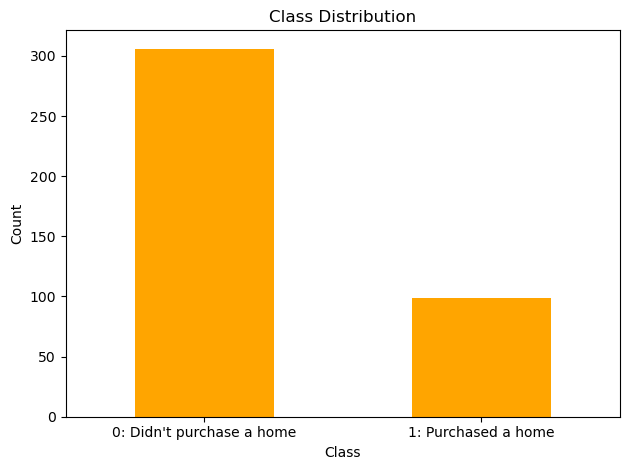

0    306
1     99
Name: home_ownership_class, dtype: int64

0    0.755556
1    0.244444
Name: home_ownership_class, dtype: float64

In [402]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))
t13 = df.copy()

In [403]:
df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
df_y = df.copy()[['home_ownership_class']]

selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(df_X)

df_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

# display(df_mod)
retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

t13 = df.copy().drop(columns=filtered_out_columns)

Number of columns: 38
Removed columns: ['gambling', 'loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'positiveMonthlyFamilyNetIncomeWithSavings', 'monthlyVices / monthlyFamilyIncome', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_BULACAN', 'province_CEBU', 'province_COTABATO', 'province_FOREIGN COUNTRY', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_PANGASINAN', 'province_RIZAL', 'province_UNKNOWN', 'province_ZAMBOANGA DEL NORTE', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_MACHINE OPERATOR', 'job_MANAGER', 'job_NONE', 'job_PROFESIONAL', 'job_UNKNOWN']


## Runs: RobustScaler()

In [436]:
scaler = RobustScaler()

In [437]:
t13_adaboost_gs, t13_adaboost_be, t13_adaboost_model_info, t13_adaboost_metrics_df = adaboost_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.42857142857142855
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8240607095773653
Std Train Score (Precision) 0.011774167313040058
GridSearchCV Runtime: 9.489985466003418 secs
Run 1 - Random State: 0
Test Precision: 0.4444444444444444
Run 2 - Random State: 1
Test Precision: 0.16666666666666666
Run 3 - Random State: 2
Test Precision: 0.3
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Tes

In [438]:
t13_dt_gs, t13_dt_be, t13_dt_model_info, t13_dt_metrics_df = dt_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3439 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__max_features': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.47595238095238096
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=2,
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 101.66037368774414 secs
Run 1 - Random State: 0
Test Precision: 0.5714285714285714
Run 2 - Random State: 1
Test Precision: 0.3076923076923077
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 3
Test Precision: 0.4
Run 5 - Random State: 4
Test Precision: 0.24193548387096775
Ave Test Precision: 0.3542112725983694
Stdev Test P

In [439]:
t13_logreg_gs, t13_logreg_be, t13_logreg_model_info, t13_logreg_metrics_df = logreg_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.3759126984126985
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=1e-06, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 53.88673114776611 secs
Run 1 - Random State: 0
Test Precision: 0.3103448275862069
Run 2 - Random State: 1
Test Precision: 0.3
Run 3 - Random State: 2
Test Precision: 0.32
Run 4 - Random State: 3
Test Precision: 0.21052631578947367
Run 5 - Random State: 4
Test Precision: 0.3225806451612903
Ave Test Precision: 0.29269035770739416
Stdev Test Precision: 0.04678484478884209
Ave Test Accuracy: 0.6568627450980392
Stdev Test Accuracy: 0.01386483884679504
Ave Test Specif

In [440]:
t13_knn_gs, t13_knn_be, t13_knn_model_info, t13_knn_metrics_df = knn_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'chebyshev', 'classifier__n_neighbors': 14, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.5016666666666667
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 KNeighborsClassifier(metric='chebyshev', n_neighbors=14))])
Mean Train Score (Precision) 0.5171591965811588
Std Train Score (Precision) 0.03029593703718404
GridSearchCV Runtime: 77.57894015312195 secs
Run 1 - Random State: 0
Test Precision: 0.2727272727272727
Run 2 - Random State: 1
Test Precision: 0.16666666666666666
Run 3 - Random State: 2
Test Precision: 0.4
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.5625
Ave Test Precision: 0.3203787878787879
Stdev Test Precision: 0.16228936691418447
Ave Test Accuracy: 0.7254901960784315
Stdev Test Accuracy: 0.031002722158513536
Ave Test Specificity: 0.911688311

In [441]:
t13_svm_gs, t13_svm_be, t13_svm_model_info, t13_svm_metrics_df = svm_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.514047619047619
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 SVC(C=1e-06, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.3680030125581748
Std Train Score (Precision) 0.08176630883390593
GridSearchCV Runtime: 51.18410778045654 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.36363636363636365
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.3333333333333333


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


[LibSVM]Run 3 - Random State: 2
Test Precision: 0.35714285714285715
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.3076923076923077
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.45454545454545453
Ave Test Precision: 0.3632700632700633
Stdev Test Precision: 0.05557420399278076
Ave Test Accuracy: 0.7196078431372549
Stdev Test Accuracy: 0.01640509855949166
Ave Test Specificity: 0.8935064935064935
Ave Test Recall: 0.18400000000000002
Ave Test NPV: 0.7712675417053565
Ave Test F1-Score: 0.24338731443994605
Ave Test G-mean: 0.40482972660027616
Ave Runtime: 0.05302858352661133


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [442]:
t13_catboost_gs, t13_catboost_be, t13_catboost_model_info, t13_catboost_metrics_df = catboost_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.007429
0:	learn: 0.6902447	total: 6.93ms	remaining: 6.92s
1:	learn: 0.6877641	total: 12.3ms	remaining: 6.11s
2:	learn: 0.6851253	total: 16.2ms	remaining: 5.39s
3:	learn: 0.6820846	total: 20.8ms	remaining: 5.17s
4:	learn: 0.6799824	total: 26.5ms	remaining: 5.26s
5:	learn: 0.6773433	total: 30.4ms	remaining: 5.04s
6:	learn: 0.6737873	total: 36.4ms	remaining: 5.17s
7:	learn: 0.6708939	total: 41.5ms	remaining: 5.15s
8:	learn: 0.6691286	total: 45.8ms	remaining: 5.04s
9:	learn: 0.6662932	total: 49.8ms	remaining: 4.93s
10:	learn: 0.6641630	total: 54.7ms	remaining: 4.92s
11:	learn: 0.6609930	total: 60.9ms	remaining: 5.01s
12:	learn: 0.6583862	total: 66.6ms	remaining: 5.05s
13:	learn: 0.6559206	total: 71.5ms	remaining: 5.04s
14:	learn: 0.6534297	total: 76.9ms	remaining: 5.05s
15:	learn: 0.6509691	total: 82ms	remaining: 5.04s
16:	learn: 0.6471770	total: 86.6ms	remaining: 5.01s
17:	learn: 0.6440477	total: 93.4ms	remaining: 5.09s
18:	learn: 0.6417324	total: 98.4ms	remaining: 

In [443]:
t13_lgbm_gs, t13_lgbm_be, t13_lgbm_model_info, t13_lgbm_metrics_df = lgbm_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Info] Number of positive: 229, number of negative: 229
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4063
[LightGBM] [Info] Number of data points in the train set: 458, number of used features: 70
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

In [444]:
t13_gbm_gs, t13_gbm_be, t13_gbm_model_info, t13_gbm_metrics_df = gbm_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.43166666666666664
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=3,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8170768482706261
Std Train Score (Precision) 0.01535024113598853
GridSearchCV Runtime: 121.88655805587769 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.36363636363636365
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.23529411764705882
Run 5

In [445]:
t13_rf_gs, t13_rf_be, t13_rf_model_info, t13_rf_metrics_df = rf_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.41318542568542577
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=3,
                                        min_samples_leaf=2, n_estimators=200,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.5893270352314711
Std Train Score (Precision) 0.04419718388528568
GridSearchCV Runtime: 287.0802776813507 secs
Run 1 - Random State: 0
Test Precision: 0.4
Run 2 - Random State: 1
Test Precision: 0.3448275862068966
Run 3 - Random State: 2
Test Precision: 0.3
Run 4 - Random State: 3
T

In [446]:
t13_xgb_gs, t13_xgb_be, t13_xgb_model_info, t13_xgb_metrics_df = xgb_class2(t13, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.5345238095238095
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
       

## Results

In [447]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't13_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t13_model_summ)
t13_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t13_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
1,SVM Classifier,0.363270,0.055574,0.514048,0.368003,0.081766,0.719608,0.016405,0.893506,0.184,0.771268,0.243387,0.404830
3,Decision Tree,0.354211,0.136848,0.475952,NaN,NaN,0.649020,0.143151,0.745455,0.352,0.780732,0.293641,0.438124
8,AdaBoost,0.331242,0.108817,0.428571,0.824061,0.011774,0.717647,0.025377,0.901299,0.152,0.766237,0.204927,0.361431
4,Random Forest,0.329835,0.043525,0.413185,0.589327,0.044197,0.664706,0.032069,0.768831,0.344,0.782982,0.334428,0.512597
9,CatBoost,0.329310,0.073802,0.388571,0.840320,0.015066,0.703922,0.035619,0.877922,0.168,0.764538,0.215457,0.380320
0,k-Nearest Neighbors,0.320379,0.162289,0.501667,0.517159,0.030296,0.725490,0.031003,0.911688,0.152,0.768787,0.202613,0.349049
7,Extreme Gradient Boosting (XGBoost),0.314362,0.067092,0.534524,0.791429,0.020592,0.696078,0.021922,0.857143,0.200,0.767425,0.243703,0.412386
2,Logistic Regression,0.292690,0.046785,0.375913,NaN,NaN,0.656863,0.013865,0.774026,0.296,0.772811,0.291792,0.471400
5,Gradient Boosting Machine (GBM),0.284453,0.059664,0.431667,0.817077,0.015350,0.672549,0.028245,0.815584,0.232,0.766259,0.251919,0.426114
6,LightGBM,0.235034,0.059978,0.501667,0.723485,0.029556,0.666667,0.031768,0.831169,0.160,0.752876,0.187460,0.358214


In [448]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t13_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.725490,k-Nearest Neighbors
Highest Test G-mean,0.512597,Random Forest
Highest Test Recall,0.352000,Decision Tree
Highest Test Precision,0.363270,SVM Classifier
Highest Test Specificity,0.911688,k-Nearest Neighbors
Highest Test F1-score,0.334428,Random Forest


# HO_T22: Yes - 1, 20 (20k, 50k, 75k, 100k), 30, 31 (0.15)

In [404]:
df = dataset.copy().drop(columns=cols_with_nulls)
# df = df[df['positiveMonthlyFamilyNetIncome'] != 0]
# df_num = df.drop(columns=['gender', 'province', 'job'])
df = pd.get_dummies(df, columns=['gender'], prefix='gender', drop_first='True')
df = pd.get_dummies(df, columns=['province'], prefix='province', drop_first='True')
df = pd.get_dummies(df, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']
df['salary_bin'] = pd.cut(df['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
df['salary_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

df.loc[df['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# df.isna().sum()[df.isna().sum() > 0]
# df = t11

## EDA on Dataset

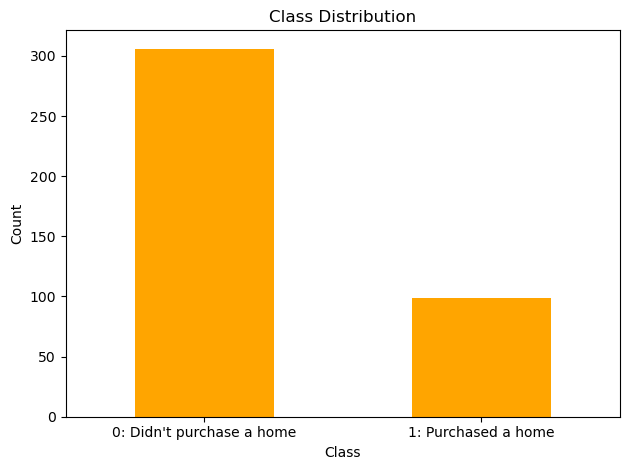

0    306
1     99
Name: home_ownership_class, dtype: int64

0    0.755556
1    0.244444
Name: home_ownership_class, dtype: float64

In [405]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))
t14 = df.copy()

In [406]:
df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
df_y = df.copy()[['home_ownership_class']]

selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(df_X)

df_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

# display(df_mod)
retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

t14 = df.copy().drop(columns=filtered_out_columns)

Number of columns: 38
Removed columns: ['gambling', 'loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'positiveMonthlyFamilyNetIncomeWithSavings', 'monthlyVices / monthlyFamilyIncome', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_BULACAN', 'province_CEBU', 'province_COTABATO', 'province_FOREIGN COUNTRY', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_PANGASINAN', 'province_RIZAL', 'province_UNKNOWN', 'province_ZAMBOANGA DEL NORTE', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_MACHINE OPERATOR', 'job_MANAGER', 'job_NONE', 'job_PROFESIONAL', 'job_UNKNOWN']


## Runs: RobustScaler()

In [407]:
scaler = RobustScaler()

In [408]:
t14_adaboost_gs, t14_adaboost_be, t14_adaboost_model_info, t14_adaboost_metrics_df = adaboost_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.32451617010440537
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8242538046328981
Std Train Score (Precision) 0.013163790989577207
GridSearchCV Runtime: 10.286066770553589 secs
Run 1 - Random State: 0
Test Precision: 0.3409090909090909
Run 2 - Random State: 1
Test Precision: 0.2631578947368421
Run 3 - Random State: 2
Test Precision: 0.26785714285714285
Run 4 - Random State: 3
Test Precision: 0.3589

In [409]:
t14_dt_gs, t14_dt_be, t14_dt_model_info, t14_dt_metrics_df = dt_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3377 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__max_features': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.47595238095238096
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=2,
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 93.76020455360413 secs
Run 1 - Random State: 0
Test Precision: 0.5714285714285714
Run 2 - Random State: 1
Test Precision: 0.26666666666666666
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 3
Test Precision: 0.4
Run 5 - Random State: 4
Test Precision: 0.24193548387096775
Ave Test Precision: 0.3460061443932412
Stdev Test P

In [410]:
t14_logreg_gs, t14_logreg_be, t14_logreg_model_info, t14_logreg_metrics_df = logreg_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.3759126984126985
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=1e-06, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 59.004169940948486 secs
Run 1 - Random State: 0
Test Precision: 0.3103448275862069
Run 2 - Random State: 1
Test Precision: 0.3
Run 3 - Random State: 2
Test Precision: 0.32
Run 4 - Random State: 3
Test Precision: 0.21052631578947367
Run 5 - Random State: 4
Test Precision: 0.3225806451612903
Ave Test Precision: 0.29269035770739416
Stdev Test Precision: 0.04678484478884209
Ave Test Accuracy: 0.6568627450980392
Stdev Test Accuracy: 0.01386483884679504
Ave Test Speci

In [411]:
t14_knn_gs, t14_knn_be, t14_knn_model_info, t14_knn_metrics_df = knn_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'chebyshev', 'classifier__n_neighbors': 14, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.5016666666666667
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 KNeighborsClassifier(metric='chebyshev', n_neighbors=14))])
Mean Train Score (Precision) 0.5170322863110096
Std Train Score (Precision) 0.030281301924524016
GridSearchCV Runtime: 65.41178321838379 secs
Run 1 - Random State: 0
Test Precision: 0.2727272727272727
Run 2 - Random State: 1
Test Precision: 0.16666666666666666
Run 3 - Random State: 2
Test Precision: 0.4
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.5625
Ave Test Precision: 0.3203787878787879
Stdev Test Precision: 0.16228936691418447
Ave Test Accuracy: 0.7254901960784315
Stdev Test Accuracy: 0.031002722158513536
Ave Test Specificity: 0.91168831

In [412]:
t14_svm_gs, t14_svm_be, t14_svm_model_info, t14_svm_metrics_df = svm_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1000.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.49523809523809514
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 SVC(C=1000.0, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.3645967805837526
Std Train Score (Precision) 0.0805682809164564
GridSearchCV Runtime: 45.346168994903564 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.24210526315789474
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.16666666666666666
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.2857142857142857
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.23958333333333334
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.23655913978494625
Ave 

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [413]:
t14_catboost_gs, t14_catboost_be, t14_catboost_model_info, t14_catboost_metrics_df = catboost_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.007381
0:	learn: 0.6902378	total: 4.61ms	remaining: 4.61s
1:	learn: 0.6883747	total: 10.5ms	remaining: 5.26s
2:	learn: 0.6857321	total: 14.7ms	remaining: 4.9s
3:	learn: 0.6833414	total: 20.7ms	remaining: 5.15s
4:	learn: 0.6808034	total: 26.9ms	remaining: 5.36s
5:	learn: 0.6787698	total: 38.7ms	remaining: 6.41s
6:	learn: 0.6756910	total: 43.3ms	remaining: 6.15s
7:	learn: 0.6723059	total: 54.4ms	remaining: 6.75s
8:	learn: 0.6698293	total: 59ms	remaining: 6.5s
9:	learn: 0.6670176	total: 63.7ms	remaining: 6.31s
10:	learn: 0.6645886	total: 68.7ms	remaining: 6.18s
11:	learn: 0.6626412	total: 73.4ms	remaining: 6.04s
12:	learn: 0.6593139	total: 77.6ms	remaining: 5.89s
13:	learn: 0.6556373	total: 83ms	remaining: 5.84s
14:	learn: 0.6523819	total: 87.7ms	remaining: 5.76s
15:	learn: 0.6493783	total: 91.8ms	remaining: 5.65s
16:	learn: 0.6467301	total: 96.1ms	remaining: 5.55s
17:	learn: 0.6434677	total: 102ms	remaining: 5.58s
18:	learn: 0.6420195	total: 108ms	remaining: 5.59s


In [414]:
t14_lgbm_gs, t14_lgbm_be, t14_lgbm_model_info, t14_lgbm_metrics_df = lgbm_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Info] Number of positive: 229, number of negative: 229
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4061
[LightGBM] [Info] Number of data points in the train set: 458, number of used features: 70
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

In [415]:
t14_gbm_gs, t14_gbm_be, t14_gbm_model_info, t14_gbm_metrics_df = gbm_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.48452380952380947
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=3,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.8161404152020907
Std Train Score (Precision) 0.01538408443101651
GridSearchCV Runtime: 105.51432991027832 secs
Run 1 - Random State: 0
Test Precision: 0.14285714285714285
Run 2 - Random State: 1
Test Precision: 0.3684210526315789
Run 3 - Random State: 2
Test Precision: 0.34782608695652173
Run 4 - Random State: 3
Test Precision: 0.25
Run 5

In [416]:
t14_rf_gs, t14_rf_be, t14_rf_model_info, t14_rf_metrics_df = rf_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.4247366522366522
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.5939569745204262
Std Train Score (Precision) 0.044182381196393505
GridSearchCV Runtime: 275.6985139846802 secs
Run 1 - Random State: 0
Test Precision: 0.40540540540540543
Run 2 - Random State: 1
Test Precision: 0.375
Run 3 - Random State: 2
Test Precision: 0.32432432432432434
Run 4 - Random State: 3
Test P

In [417]:
t14_xgb_gs, t14_xgb_be, t14_xgb_model_info, t14_xgb_metrics_df = xgb_class2(t14, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits


Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.4619047619047619
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, learning_rate=0.

## Results

In [418]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't14_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t14_model_summ)
t14_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t14_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
4,Random Forest,0.350771,0.038076,0.424737,0.593957,0.044182,0.652941,0.029898,0.706494,0.488,0.809796,0.407322,0.585618
3,Decision Tree,0.346006,0.141486,0.475952,NaN,NaN,0.674510,0.134138,0.810390,0.256,0.768456,0.250524,0.395437
9,CatBoost,0.335278,0.057000,0.408333,0.839941,0.015065,0.719608,0.013153,0.903896,0.152,0.766654,0.206679,0.365207
0,k-Nearest Neighbors,0.320379,0.162289,0.501667,0.517032,0.030281,0.725490,0.031003,0.911688,0.152,0.768787,0.202613,0.349049
8,AdaBoost,0.314180,0.045102,0.324516,0.824254,0.013164,0.588235,0.055459,0.594805,0.568,0.809474,0.402689,0.576812
2,Logistic Regression,0.292690,0.046785,0.375913,NaN,NaN,0.656863,0.013865,0.774026,0.296,0.772811,0.291792,0.471400
6,LightGBM,0.291845,0.071049,0.459524,0.722458,0.028884,0.678431,0.030534,0.828571,0.216,0.765279,0.243084,0.415242
5,Gradient Boosting Machine (GBM),0.275667,0.089651,0.484524,0.816140,0.015384,0.668627,0.027205,0.810390,0.232,0.765167,0.250162,0.422838
7,Extreme Gradient Boosting (XGBoost),0.266047,0.024778,0.461905,0.791056,0.020444,0.660784,0.030691,0.805195,0.216,0.759817,0.234101,0.411486
1,SVM Classifier,0.234126,0.042754,0.495238,0.364597,0.080568,0.445098,0.238197,0.400000,0.584,0.711797,0.281205,0.258283


In [419]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t14_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.725490,k-Nearest Neighbors
Highest Test G-mean,0.585618,Random Forest
Highest Test Recall,0.584000,SVM Classifier
Highest Test Precision,0.350771,Random Forest
Highest Test Specificity,0.911688,k-Nearest Neighbors
Highest Test F1-score,0.407322,Random Forest


# HO_T23: Yes - 1, 20-21 (20k, 50k, 75k, 100k), 30, 31 (0.05)

In [420]:
df = dataset.copy().drop(columns=cols_with_nulls)
# df = df[df['positiveMonthlyFamilyNetIncome'] != 0]
# df_num = df.drop(columns=['gender', 'province', 'job'])
df = pd.get_dummies(df, columns=['gender'], prefix='gender', drop_first='True')
df = pd.get_dummies(df, columns=['province'], prefix='province', drop_first='True')
df = pd.get_dummies(df, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']
df['salary_bin'] = pd.cut(df['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
df['basicMonthlySalary_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

df['salary_bin'] = pd.cut(df['monthlyFamilyIncome'], bins=bins, labels=labels, right=False, ordered=True)
df['monthlyFamilyIncome_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

df.loc[df['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# df.isna().sum()[df.isna().sum() > 0]
# df = t11

## EDA on Dataset

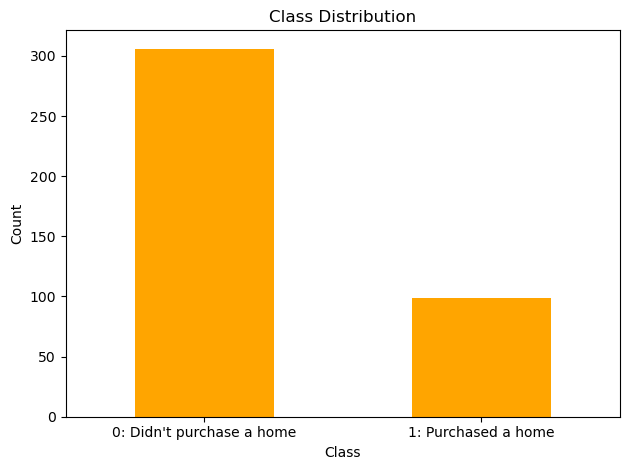

0    306
1     99
Name: home_ownership_class, dtype: int64

0    0.755556
1    0.244444
Name: home_ownership_class, dtype: float64

In [421]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))
# t15 = df.copy()

In [422]:
df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
df_y = df.copy()[['home_ownership_class']]

selector = VarianceThreshold(threshold=0.05)
filtered_data = selector.fit_transform(df_X)

df_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

# display(df_mod)
retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

df_trial = df.copy().drop(columns=filtered_out_columns)

Number of columns: 25
Removed columns: ['gambling', 'loanGSIS', 'houseHasPensioner', 'monthlyVices / monthlyFamilyIncome', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_CEBU', 'province_COTABATO', 'province_FOREIGN COUNTRY', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_PANGASINAN', 'province_RIZAL', 'province_ZAMBOANGA DEL NORTE', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_NONE', 'job_UNKNOWN']


## Runs: RobustScaler()

In [423]:
scaler = RobustScaler()

In [424]:
t14_adaboost_gs, t14_adaboost_be, t14_adaboost_model_info, t14_adaboost_metrics_df = adaboost_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.33999999999999997
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8208101808962411
Std Train Score (Precision) 0.011787135549543285
GridSearchCV Runtime: 11.899779081344604 secs
Run 1 - Random State: 0
Test Precision: 0.2727272727272727
Run 2 - Random State: 1
Test Precision: 0.42857142857142855
Run 3 - Random State: 2
Test Precision: 0.1
Run 4 - Random State: 3
Test Precision: 0.16666666666666666
Run

In [425]:
t14_dt_gs, t14_dt_be, t14_dt_model_info, t14_dt_metrics_df = dt_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3403 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__max_features': 'log2', 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.4113888888888889
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=2, max_features='log2',
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 142.6939356327057 secs
Run 1 - Random State: 0
Test Precision: 0.24324324324324326
Run 2 - Random State: 1
Test Precision: 0.21052631578947367
Run 3 - Random State: 2
Test Precision: 0.14285714285714285
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.18181818181818182
Ave Test Precision: 0.19568897674160834
Stdev

In [426]:
t14_logreg_gs, t14_logreg_be, t14_logreg_model_info, t14_logreg_metrics_df = logreg_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 1000.0, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.38053127428127426
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 LogisticRegression(C=1000.0, max_iter=1000, random_state=0,
                                    solver='liblinear'))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 69.73793935775757 secs
Run 1 - Random State: 0
Test Precision: 0.22857142857142856
Run 2 - Random State: 1
Test Precision: 0.23076923076923078
Run 3 - Random State: 2
Test Precision: 0.34210526315789475
Run 4 - Random State: 3
Test Precision: 0.3235294117647059
Run 5 - Random State: 4
Test Precision: 0.30434782608695654
Ave Test Precision: 0.2858646320700433
Stdev Test Precision: 0.05301246807899389
Ave Test Accuracy: 0.607

In [427]:
t14_knn_gs, t14_knn_be, t14_knn_model_info, t14_knn_metrics_df = knn_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'chebyshev', 'classifier__n_neighbors': 14, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4658333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 KNeighborsClassifier(metric='chebyshev', n_neighbors=14))])
Mean Train Score (Precision) 0.5099747014359928
Std Train Score (Precision) 0.03132508715711369
GridSearchCV Runtime: 74.87173366546631 secs
Run 1 - Random State: 0
Test Precision: 0.35714285714285715
Run 2 - Random State: 1
Test Precision: 0.16666666666666666
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.5
Ave Test Precision: 0.31142857142857144
Stdev Test Precision: 0.13369847959760806
Ave Test Accuracy: 0.7117647058823529
Stdev Test Accuracy: 0.02908313132194376
Ave Test Specificity

In [428]:
t14_svm_gs, t14_svm_be, t14_svm_model_info, t14_svm_metrics_df = svm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.4807142857142856
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 SVC(C=1e-06, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.3673202967288956
Std Train Score (Precision) 0.08381689441751873
GridSearchCV Runtime: 49.1884765625 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.36363636363636365
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.3333333333333333
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.35714285714285715


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


[LibSVM]Run 4 - Random State: 3
Test Precision: 0.3076923076923077
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.45454545454545453
Ave Test Precision: 0.3632700632700633
Stdev Test Precision: 0.05557420399278076
Ave Test Accuracy: 0.7196078431372549
Stdev Test Accuracy: 0.01640509855949166
Ave Test Specificity: 0.8935064935064935
Ave Test Recall: 0.18400000000000002
Ave Test NPV: 0.7712675417053565
Ave Test F1-Score: 0.24338731443994605
Ave Test G-mean: 0.40482972660027616
Ave Runtime: 0.04150094985961914


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [429]:
t14_catboost_gs, t14_catboost_be, t14_catboost_model_info, t14_catboost_metrics_df = catboost_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.007436
0:	learn: 0.6905123	total: 6.68ms	remaining: 6.67s
1:	learn: 0.6868909	total: 11.6ms	remaining: 5.79s
2:	learn: 0.6833098	total: 16.9ms	remaining: 5.61s
3:	learn: 0.6805220	total: 20.8ms	remaining: 5.18s
4:	learn: 0.6774186	total: 25.6ms	remaining: 5.09s
5:	learn: 0.6749917	total: 32.5ms	remaining: 5.39s
6:	learn: 0.6724965	total: 37ms	remaining: 5.25s
7:	learn: 0.6690479	total: 42ms	remaining: 5.2s
8:	learn: 0.6663191	total: 48ms	remaining: 5.28s
9:	learn: 0.6633210	total: 53ms	remaining: 5.25s
10:	learn: 0.6601992	total: 59.2ms	remaining: 5.32s
11:	learn: 0.6575306	total: 62.6ms	remaining: 5.15s
12:	learn: 0.6550032	total: 66.9ms	remaining: 5.08s
13:	learn: 0.6522580	total: 73.7ms	remaining: 5.19s
14:	learn: 0.6493468	total: 77.8ms	remaining: 5.11s
15:	learn: 0.6468072	total: 82.7ms	remaining: 5.09s
16:	learn: 0.6447186	total: 89.7ms	remaining: 5.19s
17:	learn: 0.6429359	total: 94.5ms	remaining: 5.15s
18:	learn: 0.6395578	total: 99.3ms	remaining: 5.13s
1

In [430]:
t14_lgbm_gs, t14_lgbm_be, t14_lgbm_model_info, t14_lgbm_metrics_df = lgbm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Info] Number of positive: 229, number of negative: 229
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4236
[LightGBM] [Info] Number of data points in the train set: 458, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

In [431]:
t14_gbm_gs, t14_gbm_be, t14_gbm_model_info, t14_gbm_metrics_df = gbm_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.48166666666666663
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.816718644333022
Std Train Score (Precision) 0.013415786358189241
GridSearchCV Runtime: 116.90134453773499 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.2631578947368421
Run 3 - Random State: 2
Test Precision: 0.5454545454545454
Run 4 - Random State: 3
Test Precision: 0.3
Run 5 - Random State: 4
Test Precis

In [432]:
t14_rf_gs, t14_rf_be, t14_rf_model_info, t14_rf_metrics_df = rf_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.41349206349206347
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=3, n_estimators=300,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.6086383991896253
Std Train Score (Precision) 0.04540355130930065
GridSearchCV Runtime: 269.339067697525 secs
Run 1 - Random State: 0
Test Precision: 0.3333333333333333
Run 2 - Random State: 1
Test Precision: 0.38235294117647056
Run 3 - Random State: 2
Test Precision: 0.3142857142

In [433]:
t14_xgb_gs, t14_xgb_be, t14_xgb_model_info, t14_xgb_metrics_df = xgb_class2(df_trial, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits


Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.5933333333333334
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, learning_rate

## Results

In [434]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't14_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t14_model_summ)
t14_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t14_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
9,CatBoost,0.363651,0.070189,0.456667,0.836770,0.016397,0.713725,0.027205,0.880519,0.200,0.772219,0.253264,0.416485
1,SVM Classifier,0.363270,0.055574,0.480714,0.367320,0.083817,0.719608,0.016405,0.893506,0.184,0.771268,0.243387,0.404830
4,Random Forest,0.354176,0.035691,0.413492,0.608638,0.045404,0.656863,0.033247,0.714286,0.480,0.809654,0.404929,0.581707
6,LightGBM,0.337462,0.087538,0.600000,0.722996,0.029193,0.701961,0.028245,0.851948,0.240,0.776101,0.275837,0.441639
5,Gradient Boosting Machine (GBM),0.328865,0.122621,0.481667,0.816719,0.013416,0.696078,0.045459,0.838961,0.256,0.777163,0.285522,0.451810
0,k-Nearest Neighbors,0.311429,0.133698,0.465833,0.509975,0.031325,0.711765,0.029083,0.885714,0.176,0.768672,0.222725,0.378869
7,Extreme Gradient Boosting (XGBoost),0.306506,0.028190,0.593333,0.789792,0.019755,0.690196,0.014868,0.846753,0.208,0.767084,0.246712,0.418238
2,Logistic Regression,0.285865,0.053012,0.380531,NaN,NaN,0.607843,0.032516,0.670130,0.416,0.781292,0.336381,0.519501
8,AdaBoost,0.260260,0.130640,0.340000,0.820810,0.011787,0.711765,0.024608,0.911688,0.096,0.756492,0.138408,0.285042
3,Decision Tree,0.195689,0.037026,0.411389,NaN,NaN,0.550980,0.133959,0.628571,0.312,0.736875,0.215819,0.363609


In [435]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t14_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.719608,SVM Classifier
Highest Test G-mean,0.581707,Random Forest
Highest Test Recall,0.480000,Random Forest
Highest Test Precision,0.363651,CatBoost
Highest Test Specificity,0.911688,AdaBoost
Highest Test F1-score,0.404929,Random Forest
